# Job Density and Crime in London: Exploring the Correlation Between Job Density and Crime Rates in London Boroughs

# Introduction and Background

There is a connection between prevention of crimes and urban planning, and both of them are impacted by spatial distribution of jobs. It is important to understand the relationship between job density and crime rates, so as to come up with urban planning strategies which promotes economic growth, well maintaining the safety of the general public. This research explores this relationship using London as a case study. It explores the relationship between job density and crime rates, using statistical and spatial analysis, delivering useful insights for policy makers and urban planners.


The possibility of the correlation between job density and crime has been a question that has faced many scholars, resulting in different viewpoints being attributed to the various theories. One common argument includes social disorganization theory and proposes that job density, especially in high numbers, alongside of economic disparity and social disorganization creates crime-prone environments (Shaw & McKay, 1942). On the other hand, routine activity theory posits that crime occurs under the lack of suitable guardians as motivated offenders encounter capable targets (Cohen & Felson, 1979). The potential target may be readily available where there are densely populated businesses and dwelling, this may increase the crime rates if no enough security measures get enacted in such places.

Other scholars have, however, disputed these notions and brought out the potential benefits of job density in crime reduction. The economic opportunity theory suggests that high concentrates of jobs could thereby build chances for improvement either by means of promotion or burglary, resulting in meager occurrence of criminal activities from inhabitants with steady jobs and income (Hirsch, 1983). Additionally, this collective efficacy theory fundamentally pays thorough attention to the social relations and community cohesion that is essential in deterring against crime (Sampson et al., 1997). Social bonds are stronger among inhabitants of these areas among each other and considerably between the residents and workers, hence increasing interaction and informal surveillance while reducing opportunities for crime.


The projects aim is to address the research: “Is there a statistically significant correlation between job density and overall crime rates across London boroughs?”. We will explore variations in this relationship across crime categories and temporal dynamics. In particular, we answer these questions using publicly accessible data on job density and crime rates among the London boroughs. We will analyze the job density and crime data, try to find the relation of the job density and crime with statistical analysis, visualization and spatial analysis techniques.

The structure for the rest of this notebook is as follows:

•	Data: We will introduce and describe the datasets on job density and crime rates used in this analysis.

•	Statistics and Visualizations: We will describe the statistics of both datasets and make different visualizations for understanding how job density and crime rates distribute over boroughs of London.

•	Data Wrangling and Preprocessing: Data would be cleaned and prepared for analysis that incorporate handling missing and inconsistencies values.

•	Data Analysis: We will use correlation analysis and visualizations to investigate the relationship between job density and crime rates. Depending on the preliminary results, additional analysis, such as regressions or spatial analysis, would be performed.

•	Result and Conclusion: Summary of findings, interpretation of their significance vis-à-vis existing literature, as well as the discussions any potential implications for urban planning, and in coming up with crime prevention strategies.



## Research Question:

"Is there a statistically significant correlation between job density and overall crime rates across London boroughs?”

## Datasets

Dataset 1: Jobs and Job Density, Borough

This dataset contains annual job and job density (i.e. jobs per resident aged 16-64) data for each Borough in London from 2000 to 2011, we are only interested in the data from 2011 to 2021 for this research. The variables found in this dataset include the borough identifier/code, names of each borough and years with job density values. The dataset was obtained from London Datastore (https://data.london.gov.uk/dataset/jobs-and-job-density-borough) and was complied by the Office for National Statistics (ONS) using different data sources including; Annual Business Inquiry (ABI), Government supported trainees data from DfES and DWP, Annual Population Survey (APS) and HM Forces data. This data is important to answering the research question because it provides the job concentration in each borough which allows for the exploration of correlations with crime rates, it also enables the analysis of the trends in job density over time and comparisons across the boroughs.


Dataset 2: Crime Data

This dataset contains a detailed recorded crimes statistics across the boroughs of London from 2010 to 2023 according to crime type, for the purpose of this research we will only be looking at crimes between 2011 to 2021. The variables found in this dataset includes; Major Category of crimes, Minor Category of crimes, names of each borough and years with their respective crime count. The dataset was obtained from London Datastore (https://data.london.gov.uk/dataset/recorded_crime_summary), the data was recorded by the Metropolitan Police Service (MPS) through crime reporting and other investigation processes. This data is relevant to the research because it provides a comprehensive data on crime allowing exploration of overall crime rates in relation to job density, the data allows spatial analysis to visualize the patterns of crimes across the boroughs. The data also allows for exploration of trends in crime over time.

Dataset 3: Statistical GIS boundary for London

This dataset contains a range of key GIS boundary files for Map Info covering London, for this research we are only interested in the boundaries of the boroughs. The data was gotten from London Datastore (https://data.london.gov.uk/dataset/statistical-gis-boundary-files-london) and was collected and recorded by the Greater London Authority. This will be useful in the visualization of crimes and job density across the boroughs in London.

Dataset 4: Latitude and Longitude Data

This dataset contains the X and Y cordinates as well as the latitude and longitude of the boroughs in London. The data was obtained from London Datastore (https://data.london.gov.uk/dataset/bridges-tunnels-road-barriers-height-restrictions) and was compliled by Transport for London and will be useful in the visualization of crimes and job density across the boroughs in London.

# Data Loading and Exploration

### Importation of Libraries

We start by loading all the libraries and basic packages needed for the project.

In [3]:
import pandas as pd # import pandas for data examination and manipulation.
import warnings 
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning) # supresses warnings in outputs for clearer visualizations
import matplotlib.pyplot as plt # import matplotlib for statistics visualization
import seaborn as sns # import seaborn for statistics visualization
from scipy.stats import pearsonr # import libraries for statistical analysis
import statsmodels.api as sm
import geopandas as gpd # import library for handling geospatial data
from mpl_toolkits.axes_grid1 import make_axes_locatable # import library for enhancing layouts of geospatial data

### Load the Datasets

Load and explore the datasets that would be used for this research.

Load the job density data.

In [2]:
job_density = pd.read_excel('Job_density.xlsx')

View the top and bottom of the dataset.

In [3]:
job_density.head(10)

,Code,Area,2000,2001,2002,2003,2004,2005,2006,2007,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,E09000001,City of London,67.10,59.14,60.47,61.91,59.73,61.26,59.16,57.98,...,92.41,110.98,121.23,121.73,121.96,124.78,109.86,102.32,83.73,98.74
2,E09000002,Barking and Dagenham,0.56,0.52,0.50,0.53,0.51,0.51,0.49,0.49,...,0.46,0.44,0.47,0.48,0.48,0.49,0.49,0.50,0.52,0.51
3,E09000003,Barnet,0.67,0.65,0.64,0.65,0.63,0.63,0.63,0.62,...,0.65,0.66,0.68,0.68,0.68,0.70,0.67,0.66,0.64,0.70
4,E09000004,Bexley,0.55,0.54,0.57,0.55,0.61,0.57,0.52,0.52,...,0.53,0.54,0.53,0.57,0.56,0.59,0.56,0.59,0.54,0.56
5,E09000005,Brent,0.67,0.62,0.62,0.65,0.65,0.64,0.58,0.57,...,0.57,0.57,0.60,0.62,0.67,0.71,0.71,0.71,0.69,0.63
6,E09000006,Bromley,0.62,0.61,0.63,0.67,0.67,0.66,0.66,0.71,...,0.62,0.64,0.63,0.61,0.65,0.65,0.62,0.64,0.62,0.60
7,E09000007,Camden,2.05,1.98,1.92,1.86,1.82,1.88,1.80,1.90,...,2.12,2.15,2.25,2.21,2.23,2.23,2.17,2.11,1.98,2.73
8,E09000008,Croydon,0.73,0.71,0.68,0.69,0.69,0.67,0.66,0.67,...,0.58,0.53,0.58,0.58,0.60,0.63,0.60,0.58,0.58,0.55
9,E09000009,Ealing,0.64,0.63,0.62,0.64,0.63,0.63,0.62,0.63,...,0.64,0.65,0.69,0.71,0.73,0.74,0.66,0.71,0.72,0.63


In [4]:
job_density.tail(10)

,Code,Area,2000,2001,2002,2003,2004,2005,2006,2007,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
43,E12000009,South West,0.81,0.82,0.83,0.83,0.83,0.82,0.82,0.82,...,0.81,0.83,0.86,0.87,0.88,0.89,0.89,0.91,0.88,0.87
44,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
45,W92000004,Wales,0.69,0.70,0.70,0.71,0.73,0.73,0.72,0.71,...,0.71,0.72,0.73,0.75,0.77,0.76,0.78,0.77,0.76,0.77
46,S92000003,Scotland,0.76,0.79,0.78,0.79,0.79,0.80,0.79,0.79,...,0.76,0.76,0.79,0.79,0.82,0.81,0.82,0.82,0.80,0.81
47,N92000002,Northern Ireland,0.72,0.72,0.73,0.74,0.74,0.75,0.75,0.74,...,0.71,0.71,0.72,0.73,0.75,0.76,0.76,0.79,0.79,0.75
48,E92000001,England,0.80,0.80,0.80,0.80,0.80,0.81,0.79,0.80,...,0.79,0.80,0.82,0.84,0.86,0.87,0.87,0.88,0.85,0.86
49,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50,K04000001,England and Wales,0.80,0.80,0.80,0.80,0.80,0.80,0.79,0.79,...,0.79,0.80,0.82,0.84,0.85,0.86,0.87,0.88,0.85,0.86
51,K03000001,Great Britain,0.79,0.80,0.80,0.80,0.80,0.80,0.79,0.79,...,0.78,0.79,0.81,0.83,0.85,0.86,0.86,0.87,0.84,0.85
52,K02000001,United Kingdom,0.79,0.79,0.79,0.80,0.80,0.80,0.79,0.79,...,0.78,0.79,0.81,0.83,0.85,0.86,0.86,0.87,0.84,0.85


Display the information about the columns in the dataset using the .info() command.

In [5]:
job_density.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53 entries, 0 to 52
Data columns (total 24 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Code    49 non-null     object 
 1   Area    49 non-null     object 
 2   2000    49 non-null     float64
 3   2001    49 non-null     float64
 4   2002    49 non-null     float64
 5   2003    49 non-null     float64
 6   2004    49 non-null     float64
 7   2005    49 non-null     float64
 8   2006    49 non-null     float64
 9   2007    49 non-null     float64
 10  2008    49 non-null     float64
 11  2009    49 non-null     float64
 12  2010    49 non-null     float64
 13  2011    49 non-null     float64
 14  2012    49 non-null     float64
 15  2013    49 non-null     float64
 16  2014    49 non-null     float64
 17  2015    49 non-null     float64
 18  2016    49 non-null     float64
 19  2017    49 non-null     float64
 20  2018    49 non-null     float64
 21  2019    49 non-null     float64
 22  2020

We can see that there are no missing values in the dataset. Next we view all the boroughs in the dataset.

In [6]:
job_density.Area

0                          NaN
1               City of London
2         Barking and Dagenham
3                       Barnet
4                       Bexley
5                        Brent
6                      Bromley
7                       Camden
8                      Croydon
9                       Ealing
10                     Enfield
11                   Greenwich
12                     Hackney
13      Hammersmith and Fulham
14                    Haringey
15                      Harrow
16                    Havering
17                  Hillingdon
18                    Hounslow
19                   Islington
20      Kensington and Chelsea
21        Kingston upon Thames
22                     Lambeth
23                    Lewisham
24                      Merton
25                      Newham
26                   Redbridge
27        Richmond upon Thames
28                   Southwark
29                      Sutton
30               Tower Hamlets
31              Waltham Forest
32      

We notice that the data contains information on regions and locations that are not needed for this research, they will be deleted.

Then we load and explore the crime data next.

In [7]:
crimes_data = pd.read_csv('MPS Borough Level Crime Historical.csv')

View the top and bottom of the dataset.

In [8]:
crimes_data.head(10)

,MajorText,MinorText,LookUp_BoroughName,201004,201005,201006,201007,201008,201009,201010,...,202103,202104,202105,202106,202107,202108,202109,202110,202111,202112
0,Arson and Criminal Damage,Arson,Barking and Dagenham,6,5,11,10,6,6,13,...,4,6,6,5,4,12,5,7,6,1
1,Arson and Criminal Damage,Criminal Damage,Barking and Dagenham,208,193,227,220,204,163,199,...,80,99,128,141,130,144,111,126,109,116
2,Burglary,Burglary Business and Community,Barking and Dagenham,49,58,59,47,46,51,52,...,14,12,30,24,21,29,27,37,20,14
3,Burglary,Domestic Burglary,Barking and Dagenham,118,102,124,137,153,136,116,...,71,75,81,66,61,87,62,83,87,91
4,Drug Offences,Drug Trafficking,Barking and Dagenham,9,6,5,12,9,7,11,...,13,9,9,7,6,11,19,18,12,10
5,Drug Offences,Possession of Drugs,Barking and Dagenham,78,61,78,73,100,97,110,...,150,130,118,130,135,124,135,124,129,100
6,Historical Fraud and Forgery,Historical Fraud and Forgery,Barking and Dagenham,63,43,43,62,47,61,58,...,0,0,0,0,0,0,0,0,0,0
7,Miscellaneous Crimes Against Society,Absconding from Lawful Custody,Barking and Dagenham,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,Miscellaneous Crimes Against Society,Bail Offences,Barking and Dagenham,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,Miscellaneous Crimes Against Society,Bigamy,Barking and Dagenham,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1


In [9]:
crimes_data.tail(10)

,MajorText,MinorText,LookUp_BoroughName,201004,201005,201006,201007,201008,201009,201010,...,202103,202104,202105,202106,202107,202108,202109,202110,202111,202112
1720,Theft,Other Theft,Westminster,1689,1616,1547,1807,1563,1632,1892,...,233,461,631,875,1113,986,1038,1503,1423,1399
1721,Theft,Shoplifting,Westminster,480,438,392,451,469,409,427,...,105,177,231,202,235,248,263,307,314,285
1722,Theft,Theft from Person,Westminster,477,501,499,633,525,478,580,...,181,365,647,529,664,609,643,1122,1220,1409
1723,Vehicle Offences,Aggravated Vehicle Taking,Westminster,1,2,1,1,4,0,3,...,0,0,3,0,0,3,2,0,1,1
1724,Vehicle Offences,Interfering with a Motor Vehicle,Westminster,4,4,6,3,3,3,1,...,15,15,24,14,21,18,20,37,28,24
1725,Vehicle Offences,Theft from a Motor Vehicle,Westminster,231,215,204,213,167,197,197,...,150,156,265,218,218,244,267,309,280,320
1726,Vehicle Offences,Theft or Taking of a Motor Vehicle,Westminster,79,54,46,41,55,82,87,...,51,39,41,34,56,46,61,56,49,36
1727,Violence Against the Person,Homicide,Westminster,0,1,0,0,0,0,0,...,0,0,1,0,1,2,0,0,0,0
1728,Violence Against the Person,Violence with Injury,Westminster,271,283,289,328,288,270,319,...,174,220,260,317,416,376,325,391,361,398
1729,Violence Against the Person,Violence without Injury,Westminster,295,322,356,346,312,316,297,...,481,506,539,612,690,621,627,734,642,618


Display the information about the columns in the dataset using the .info() command.

In [10]:
crimes_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1730 entries, 0 to 1729
Columns: 144 entries, MajorText to 202112
dtypes: int64(141), object(3)
memory usage: 1.9+ MB


Check for missing values using .isnull().sum() command.

In [11]:
crimes_data.isnull().sum()

MajorText             0
MinorText             0
LookUp_BoroughName    0
201004                0
201005                0
                     ..
202108                0
202109                0
202110                0
202111                0
202112                0
Length: 144, dtype: int64

Check for duplicates in the data using the .duplicated() command.

In [12]:
crimes_data.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
1725    False
1726    False
1727    False
1728    False
1729    False
Length: 1730, dtype: bool

# Data Wrangling

We would need to rename some columns in both datasets using the .rename function for better understanding and to have a common column name to use to join the two datasets.

In [13]:
job_density = job_density.rename(columns={'Area': 'Borough'}) # rename the necessary columns
job_density.head()

,Code,Borough,2000,2001,2002,2003,2004,2005,2006,2007,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,E09000001,City of London,67.10,59.14,60.47,61.91,59.73,61.26,59.16,57.98,...,92.41,110.98,121.23,121.73,121.96,124.78,109.86,102.32,83.73,98.74
2,E09000002,Barking and Dagenham,0.56,0.52,0.50,0.53,0.51,0.51,0.49,0.49,...,0.46,0.44,0.47,0.48,0.48,0.49,0.49,0.50,0.52,0.51
3,E09000003,Barnet,0.67,0.65,0.64,0.65,0.63,0.63,0.63,0.62,...,0.65,0.66,0.68,0.68,0.68,0.70,0.67,0.66,0.64,0.70
4,E09000004,Bexley,0.55,0.54,0.57,0.55,0.61,0.57,0.52,0.52,...,0.53,0.54,0.53,0.57,0.56,0.59,0.56,0.59,0.54,0.56


Next, we slice the job density dataset to retain only the data for the boroughs in London.

In [14]:
job_density_data = job_density[2:34].copy() 

We can confirm by checking the boroughs column.

In [15]:
list(job_density_data['Borough'])

['Barking and Dagenham',
 'Barnet',
 'Bexley',
 'Brent',
 'Bromley',
 'Camden',
 'Croydon',
 'Ealing',
 'Enfield',
 'Greenwich',
 'Hackney',
 'Hammersmith and Fulham',
 'Haringey',
 'Harrow',
 'Havering',
 'Hillingdon',
 'Hounslow',
 'Islington',
 'Kensington and Chelsea',
 'Kingston upon Thames',
 'Lambeth',
 'Lewisham',
 'Merton',
 'Newham',
 'Redbridge',
 'Richmond upon Thames',
 'Southwark',
 'Sutton',
 'Tower Hamlets',
 'Waltham Forest',
 'Wandsworth',
 'Westminster']

Next we take a look at all the columns in the job density data.

In [16]:
job_density_data.columns

Index([   'Code', 'Borough',      2000,      2001,      2002,      2003,
            2004,      2005,      2006,      2007,      2008,      2009,
            2010,      2011,      2012,      2013,      2014,      2015,
            2016,      2017,      2018,      2019,      2020,      2021],
      dtype='object')

Notice that there are some years that are not relevant to this research, we will go ahead and drop them using the .drop() command.

In [17]:
# Convert column names to strings
job_density_data.columns = job_density_data.columns.astype(str)

# Specify columns to drop
columns_to_drop = [str(year) for year in range(2000, 2011)]

# Drop the specified columns
job_density_data = job_density_data.drop(columns=columns_to_drop, axis=1)

# Print the DataFrame after dropping columns
print(job_density_data)


         Code                 Borough  2011  2012  2013  2014  2015  2016  \
2   E09000002    Barking and Dagenham  0.45  0.46  0.44  0.47  0.48  0.48   
3   E09000003                  Barnet  0.62  0.65  0.66  0.68  0.68  0.68   
4   E09000004                  Bexley  0.53  0.53  0.54  0.53  0.57  0.56   
5   E09000005                   Brent  0.53  0.57  0.57  0.60  0.62  0.67   
6   E09000006                 Bromley  0.61  0.62  0.64  0.63  0.61  0.65   
7   E09000007                  Camden  2.06  2.12  2.15  2.25  2.21  2.23   
8   E09000008                 Croydon  0.56  0.58  0.53  0.58  0.58  0.60   
9   E09000009                  Ealing  0.63  0.64  0.65  0.69  0.71  0.73   
10  E09000010                 Enfield  0.54  0.57  0.57  0.61  0.63  0.60   
11  E09000011               Greenwich  0.47  0.46  0.48  0.52  0.51  0.51   
12  E09000012                 Hackney  0.63  0.62  0.60  0.69  0.70  0.73   
13  E09000013  Hammersmith and Fulham  1.03  1.09  1.05  1.12  1.16  1.20   

We can have a look at the job density data set.

In [18]:
job_density_data

,Code,Borough,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
2,E09000002,Barking and Dagenham,0.45,0.46,0.44,0.47,0.48,0.48,0.49,0.49,0.50,0.52,0.51
3,E09000003,Barnet,0.62,0.65,0.66,0.68,0.68,0.68,0.70,0.67,0.66,0.64,0.70
4,E09000004,Bexley,0.53,0.53,0.54,0.53,0.57,0.56,0.59,0.56,0.59,0.54,0.56
5,E09000005,Brent,0.53,0.57,0.57,0.60,0.62,0.67,0.71,0.71,0.71,0.69,0.63
6,E09000006,Bromley,0.61,0.62,0.64,0.63,0.61,0.65,0.65,0.62,0.64,0.62,0.60
7,E09000007,Camden,2.06,2.12,2.15,2.25,2.21,2.23,2.23,2.17,2.11,1.98,2.73
8,E09000008,Croydon,0.56,0.58,0.53,0.58,0.58,0.60,0.63,0.60,0.58,0.58,0.55
9,E09000009,Ealing,0.63,0.64,0.65,0.69,0.71,0.73,0.74,0.66,0.71,0.72,0.63
10,E09000010,Enfield,0.54,0.57,0.57,0.61,0.63,0.60,0.59,0.62,0.63,0.59,0.58
11,E09000011,Greenwich,0.47,0.46,0.48,0.52,0.51,0.51,0.53,0.55,0.55,0.52,0.51


Check for null values using the .isnull( ).sum( ) command.

In [19]:
job_density_data.isnull().sum()

Code       0
Borough    0
2011       0
2012       0
2013       0
2014       0
2015       0
2016       0
2017       0
2018       0
2019       0
2020       0
2021       0
dtype: int64

Check for duplicates in the dataset using the .duplicated( ) command.

In [20]:
job_density_data.duplicated()

2     False
3     False
4     False
5     False
6     False
7     False
8     False
9     False
10    False
11    False
12    False
13    False
14    False
15    False
16    False
17    False
18    False
19    False
20    False
21    False
22    False
23    False
24    False
25    False
26    False
27    False
28    False
29    False
30    False
31    False
32    False
33    False
dtype: bool

Now the job density data is ready for description and analysis.

We can go ahead with wrangling the crime data.

In [21]:
# rename the necessary columns
crimes_data = crimes_data.rename(columns={'MajorText': 'Major Category', 'MinorText': 'Minor Category', 'LookUp_BoroughName': 'Borough'})
crimes_data

,Major Category,Minor Category,Borough,201004,201005,201006,201007,201008,201009,201010,...,202103,202104,202105,202106,202107,202108,202109,202110,202111,202112
0,Arson and Criminal Damage,Arson,Barking and Dagenham,6,5,11,10,6,6,13,...,4,6,6,5,4,12,5,7,6,1
1,Arson and Criminal Damage,Criminal Damage,Barking and Dagenham,208,193,227,220,204,163,199,...,80,99,128,141,130,144,111,126,109,116
2,Burglary,Burglary Business and Community,Barking and Dagenham,49,58,59,47,46,51,52,...,14,12,30,24,21,29,27,37,20,14
3,Burglary,Domestic Burglary,Barking and Dagenham,118,102,124,137,153,136,116,...,71,75,81,66,61,87,62,83,87,91
4,Drug Offences,Drug Trafficking,Barking and Dagenham,9,6,5,12,9,7,11,...,13,9,9,7,6,11,19,18,12,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1725,Vehicle Offences,Theft from a Motor Vehicle,Westminster,231,215,204,213,167,197,197,...,150,156,265,218,218,244,267,309,280,320
1726,Vehicle Offences,Theft or Taking of a Motor Vehicle,Westminster,79,54,46,41,55,82,87,...,51,39,41,34,56,46,61,56,49,36
1727,Violence Against the Person,Homicide,Westminster,0,1,0,0,0,0,0,...,0,0,1,0,1,2,0,0,0,0
1728,Violence Against the Person,Violence with Injury,Westminster,271,283,289,328,288,270,319,...,174,220,260,317,416,376,325,391,361,398


We would now check the value counts of the borough.

In [22]:
crimes_data['Borough'].value_counts()

Borough
Waltham Forest                              54
Sutton                                      54
Newham                                      54
Enfield                                     54
Kensington and Chelsea                      54
Haringey                                    54
Hounslow                                    53
Barnet                                      53
Tower Hamlets                               53
Southwark                                   53
Redbridge                                   53
Lambeth                                     53
Islington                                   53
Westminster                                 53
Harrow                                      53
Greenwich                                   53
Ealing                                      53
Croydon                                     53
Barking and Dagenham                        52
Hammersmith and Fulham                      52
Hackney                                     52
Kings

We can see that 'London Heathrow and London City Airports' are not boroughs, so we will have to delete it.

In [23]:
boroughs_to_delete = ['London Heathrow and London City Airports']

# Filter out rows that belong to the specified boroughs
crimes_data = crimes_data[~crimes_data['Borough'].isin(boroughs_to_delete)]

We can confirm that the data for London Heathrow and London City Airports has been deleted.

In [24]:
crimes_data['Borough'].value_counts()

Borough
Waltham Forest            54
Sutton                    54
Newham                    54
Enfield                   54
Kensington and Chelsea    54
Haringey                  54
Hounslow                  53
Barnet                    53
Tower Hamlets             53
Southwark                 53
Redbridge                 53
Lambeth                   53
Islington                 53
Westminster               53
Ealing                    53
Harrow                    53
Greenwich                 53
Croydon                   53
Hillingdon                52
Wandsworth                52
Bromley                   52
Camden                    52
Barking and Dagenham      52
Lewisham                  52
Kingston upon Thames      52
Hackney                   52
Hammersmith and Fulham    52
Merton                    51
Richmond upon Thames      51
Brent                     51
Bexley                    51
Havering                  51
Name: count, dtype: int64

Next, we take a look at all the columns in the crime data.

In [25]:
list(crimes_data.columns)

['Major Category',
 'Minor Category',
 'Borough',
 '201004',
 '201005',
 '201006',
 '201007',
 '201008',
 '201009',
 '201010',
 '201011',
 '201012',
 '201101',
 '201102',
 '201103',
 '201104',
 '201105',
 '201106',
 '201107',
 '201108',
 '201109',
 '201110',
 '201111',
 '201112',
 '201201',
 '201202',
 '201203',
 '201204',
 '201205',
 '201206',
 '201207',
 '201208',
 '201209',
 '201210',
 '201211',
 '201212',
 '201301',
 '201302',
 '201303',
 '201304',
 '201305',
 '201306',
 '201307',
 '201308',
 '201309',
 '201310',
 '201311',
 '201312',
 '201401',
 '201402',
 '201403',
 '201404',
 '201405',
 '201406',
 '201407',
 '201408',
 '201409',
 '201410',
 '201411',
 '201412',
 '201501',
 '201502',
 '201503',
 '201504',
 '201505',
 '201506',
 '201507',
 '201508',
 '201509',
 '201510',
 '201511',
 '201512',
 '201601',
 '201602',
 '201603',
 '201604',
 '201605',
 '201606',
 '201607',
 '201608',
 '201609',
 '201610',
 '201611',
 '201612',
 '201701',
 '201702',
 '201703',
 '201704',
 '201705',
 '20

Notice that the data is being recorded by the month, we will have to sum up the total number of crimes for each year from 2011 to 2021 in seperate columns.

In [26]:
# sum up the total number of crime for each year
crimes_data['2011'] = crimes_data.loc[:, '201101':'201112'].sum(axis=1)
crimes_data['2012'] = crimes_data.loc[:, '201201':'201212'].sum(axis=1)
crimes_data['2013'] = crimes_data.loc[:, '201301':'201312'].sum(axis=1)
crimes_data['2014'] = crimes_data.loc[:, '201401':'201412'].sum(axis=1)
crimes_data['2015'] = crimes_data.loc[:, '201501':'201512'].sum(axis=1)
crimes_data['2016'] = crimes_data.loc[:, '201601':'201612'].sum(axis=1)
crimes_data['2017'] = crimes_data.loc[:, '201701':'201712'].sum(axis=1)
crimes_data['2018'] = crimes_data.loc[:, '201801':'201812'].sum(axis=1)
crimes_data['2019'] = crimes_data.loc[:, '201901':'201912'].sum(axis=1)
crimes_data['2020'] = crimes_data.loc[:, '202001':'202012'].sum(axis=1)
crimes_data['2021'] = crimes_data.loc[:, '202101':'202112'].sum(axis=1)

C:\Users\olaju\AppData\Local\Temp\ipykernel_39376\2200527891.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  crimes_data['2011'] = crimes_data.loc[:, '201101':'201112'].sum(axis=1)
C:\Users\olaju\AppData\Local\Temp\ipykernel_39376\2200527891.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  crimes_data['2012'] = crimes_data.loc[:, '201201':'201212'].sum(axis=1)
C:\Users\olaju\AppData\Local\Temp\ipykernel_39376\2200527891.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice f

Lets have a look at the crime data.

In [27]:
crimes_data.head()

,Major Category,Minor Category,Borough,201004,201005,201006,201007,201008,201009,201010,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,Arson and Criminal Damage,Arson,Barking and Dagenham,6,5,11,10,6,6,13,...,75,52,65,77,74,78,58,68,48,66
1,Arson and Criminal Damage,Criminal Damage,Barking and Dagenham,208,193,227,220,204,163,199,...,1613,1550,1553,1678,1816,1631,1392,1435,1276,1388
2,Burglary,Burglary Business and Community,Barking and Dagenham,49,58,59,47,46,51,52,...,665,574,541,448,454,364,387,361,282,267
3,Burglary,Domestic Burglary,Barking and Dagenham,118,102,124,137,153,136,116,...,1795,1669,1369,1184,840,1229,1285,1185,935,924
4,Drug Offences,Drug Trafficking,Barking and Dagenham,9,6,5,12,9,7,11,...,76,69,89,53,79,64,76,88,163,137


Next we create a subset of the crime data to contain only the relevant data for this research.

In [28]:
crimes_yearly_data = crimes_data[['Major Category', 'Borough', '2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021']]

We can view the new dataset.

In [29]:
crimes_yearly_data

,Major Category,Borough,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,Arson and Criminal Damage,Barking and Dagenham,132,75,52,65,77,74,78,58,68,48,66
1,Arson and Criminal Damage,Barking and Dagenham,2017,1613,1550,1553,1678,1816,1631,1392,1435,1276,1388
2,Burglary,Barking and Dagenham,740,665,574,541,448,454,364,387,361,282,267
3,Burglary,Barking and Dagenham,1625,1795,1669,1369,1184,840,1229,1285,1185,935,924
4,Drug Offences,Barking and Dagenham,82,76,69,89,53,79,64,76,88,163,137
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1725,Vehicle Offences,Westminster,2551,2471,2730,2207,1966,2508,2886,3031,3650,2787,2674
1726,Vehicle Offences,Westminster,528,582,642,798,845,1049,945,731,702,617,556
1727,Violence Against the Person,Westminster,1,4,6,5,5,4,10,2,4,5,5
1728,Violence Against the Person,Westminster,3565,2860,2738,3248,3317,3369,3670,3622,4045,2976,3501


The crime data is also ready for analysis.

# Descriptive Analysis

Next we check the central tendencies and variability of the two datasets using the .describe( ) command.

In [30]:
job_density_data.describe()

,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
count,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000
mean,0.835938,0.862188,0.871563,0.898125,0.913438,0.929375,0.943125,0.930312,0.932187,0.891250,0.963125
std,0.707362,0.723949,0.743835,0.754575,0.749338,0.749946,0.735630,0.730949,0.735127,0.661059,0.913958
min,0.390000,0.400000,0.410000,0.430000,0.400000,0.400000,0.420000,0.390000,0.400000,0.390000,0.420000
25%,0.517500,0.522500,0.522500,0.552500,0.565000,0.575000,0.590000,0.567500,0.577500,0.565000,0.557500
50%,0.620000,0.625000,0.625000,0.655000,0.655000,0.675000,0.700000,0.665000,0.685000,0.665000,0.640000
75%,0.895000,0.947500,0.967500,0.962500,1.040000,1.055000,1.055000,1.015000,1.040000,0.970000,0.945000
max,4.160000,4.260000,4.390000,4.450000,4.420000,4.420000,4.330000,4.290000,4.350000,3.930000,5.260000


The table above shows that the average job density for the years ranges from 0.84 to 0.96, with 2011 having the lowest average job density and 2021 having the highest average job density.

The high standard deviation shows that there is more variability in the ranges of the job density. This is evident as shown in the minimum job density across the year which range from 0.39 to 0.42 and the maximum job density across the years which range from 4.16 to 5.26.

In [31]:
crimes_yearly_data.describe()

,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
count,1683.000000,1683.000000,1683.000000,1683.000000,1683.000000,1683.000000,1683.000000,1683.000000,1683.000000,1683.000000,1683.000000
mean,478.710636,466.273321,419.532383,414.920974,434.740345,451.667855,487.081402,497.480095,544.897207,469.355318,470.852050
std,1052.291074,1017.115496,911.084561,858.925999,903.795733,913.507278,988.158836,1039.973410,1241.245777,952.836482,992.717643
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,3.000000,3.000000,3.000000,3.000000,5.000000,4.000000,4.000000,4.000000,3.000000,4.000000
50%,33.000000,32.000000,33.000000,30.000000,32.000000,36.000000,39.000000,36.000000,38.000000,37.000000,34.000000
75%,443.000000,458.500000,294.000000,348.500000,385.000000,416.000000,467.500000,476.500000,528.000000,449.500000,467.500000
max,21382.000000,19931.000000,16796.000000,13963.000000,13745.000000,12325.000000,12655.000000,15229.000000,23957.000000,9589.000000,10046.000000


The table above provides a general overview of the distribution of crime counts across different years (2011-2021) in the dataset. The count value shows the number of recorded crime in all boroughs for each year in the dataset. The average crime count across the years ranges from 415 in 2014 to 544 in 2019.

# Exploratory Analysis

Next we will explore the job density data visually using line plots and graphs. 

Define the function to plot job density trend for each borough over the years

In [32]:
def borough_job_density_trend(job_density_data):
    
     # Plot a line plot of job density for each borough over the years using the job density data
    boroughs = job_density_data['Borough']
    years = job_density_data.columns[2:]  # Slice the first two columns to view only numerical variables

   # create the plot
    plt.figure(figsize=(12, 8))
    for borough in boroughs:
        borough_data = job_density_data[job_density_data['Borough'] == borough].iloc[:, 2:].values.flatten()
        plt.plot(years, borough_data, label=borough)

    plt.title('Trend in Job Density Over Time (2011-2021)')
    plt.xlabel('Year')
    plt.ylabel('Job Density')
    plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
    plt.grid(True)
    plt.show()


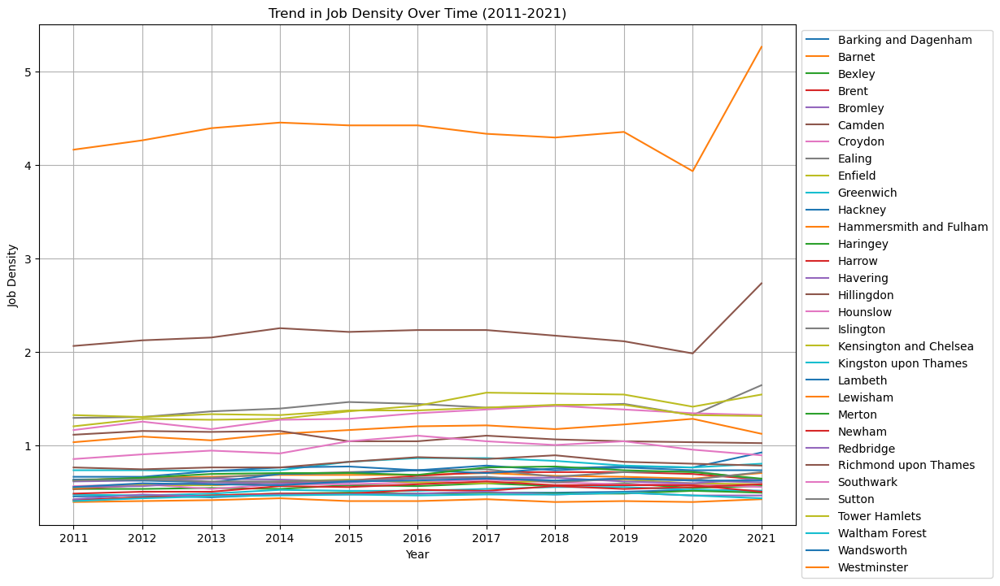

In [33]:
borough_job_density_trend(job_density_data)

The graph shows the trend in job density over the decade for each borough in London. There is a general upward trend in job density across all boroughs. The boroughs with the highest job density in 2021 are Westminster and Camden, these boroughs have consistently higher job densities than other boroughs. 

Define the function to plot job density distribution across London boroughs over the years.

In [34]:
def job_density_distribution_over_years(job_density_data):
    
    # Plots job density distribution across London boroughs for each year in a subplot grid.
    years = ['2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021']

    # Create subplots in a 3 by 4 grid
    fig, axes = plt.subplots(3, 4, figsize=(20, 15))
    fig.suptitle('Job Density Distribution Across Boroughs (2011-2021)', fontsize=16)

    for i, year in enumerate(years):
        row, col = divmod(i, 4)
        ax = axes[row, col]

        # Select job density data for the chosen year
        job_density_selected_year = job_density_data[['Borough', year]]

        # Plot a bar chart for the job density distribution
        sns.barplot(x='Borough', y=year, data=job_density_selected_year, ax=ax, color='green')

        ax.set_title(year)
        ax.set_xlabel('Borough')
        ax.set_ylabel('Job Density')
        ax.set_xticklabels(ax.get_xticklabels(), rotation=90)  # Rotate the x-axis labels for neatness

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

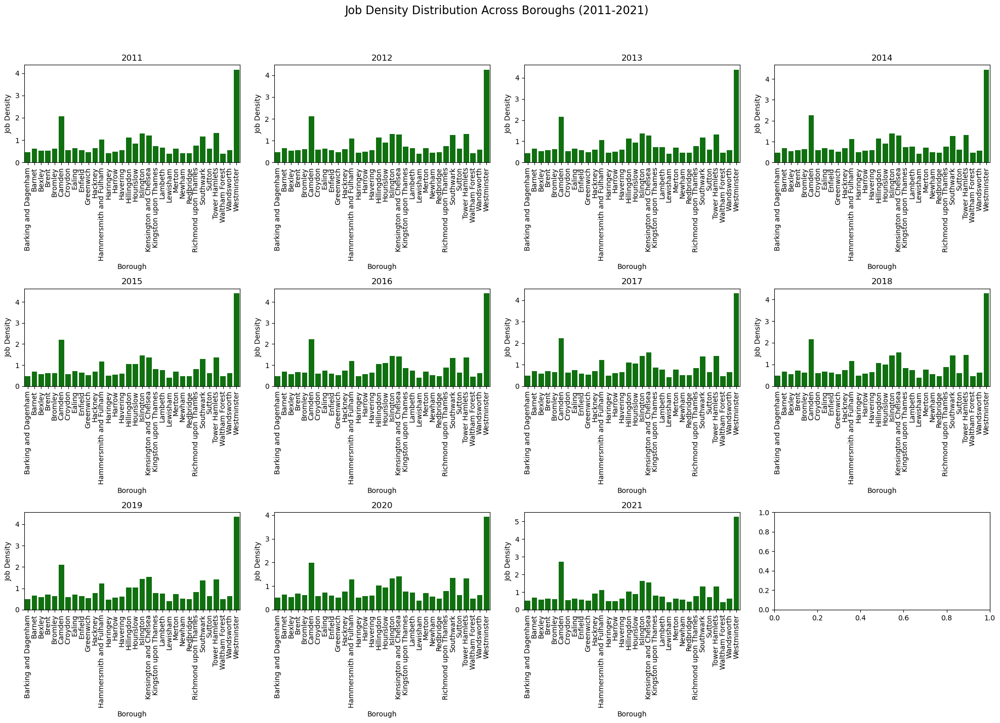

In [35]:
job_density_distribution_over_years(job_density_data)

The graph above indicates that majority of the boroughs have job density of less than 1.0. Westminster and Camden consistently rank high in job density across both visualizations, confirming their status as major employment hubs. 

Define the function to plot job density in boxplots across the years

In [36]:
def boxplot_of_job_density(job_density_data):
    
    # Plot a box plot of the job density across the years
    sns.boxplot(data=job_density_data.iloc[:, 2:])
    plt.xlabel('Year')
    plt.ylabel('Job Density')
    plt.title('Distribution of Job Density Over the Years')
    plt.show()


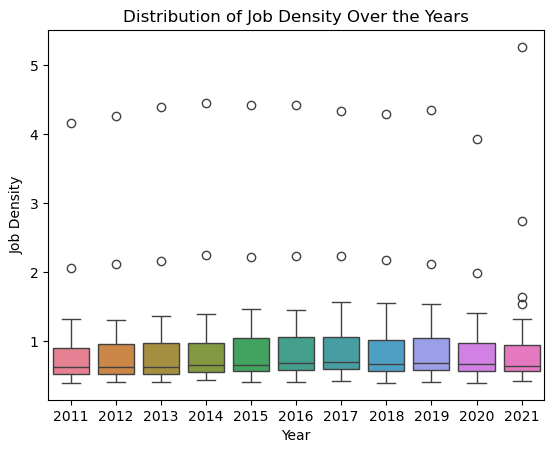

In [37]:
boxplot_of_job_density(job_density_data)

The boxplot above shows that the median job density over the years analized do not vary far from each other, the outliers in the plot are the values for Westminster and Camden the two boroughs that have a relatively higher job density than the rest of the boroughs.

Define the function to plot a heat map of the job density across the years by boroughs.

In [38]:
def job_density_heatmap(job_density_data):
   
    # Extract the needed data
    years = job_density_data.columns[2:]
    boroughs = job_density_data['Borough']
    data_to_plot = job_density_data.iloc[:, 2:].T

    #  Create a heatmap to visualize the job density across boroughs and years.
    plt.figure(figsize=(12, 8))
    sns.heatmap(data_to_plot, cmap='viridis', cbar_kws={'label': 'Job Density'})
    plt.xticks(range(len(boroughs)), boroughs, rotation=90)
    plt.xlabel('Borough')
    plt.ylabel('Year')
    plt.title('Job Density Heatmap Across Boroughs and Years')
    plt.show()


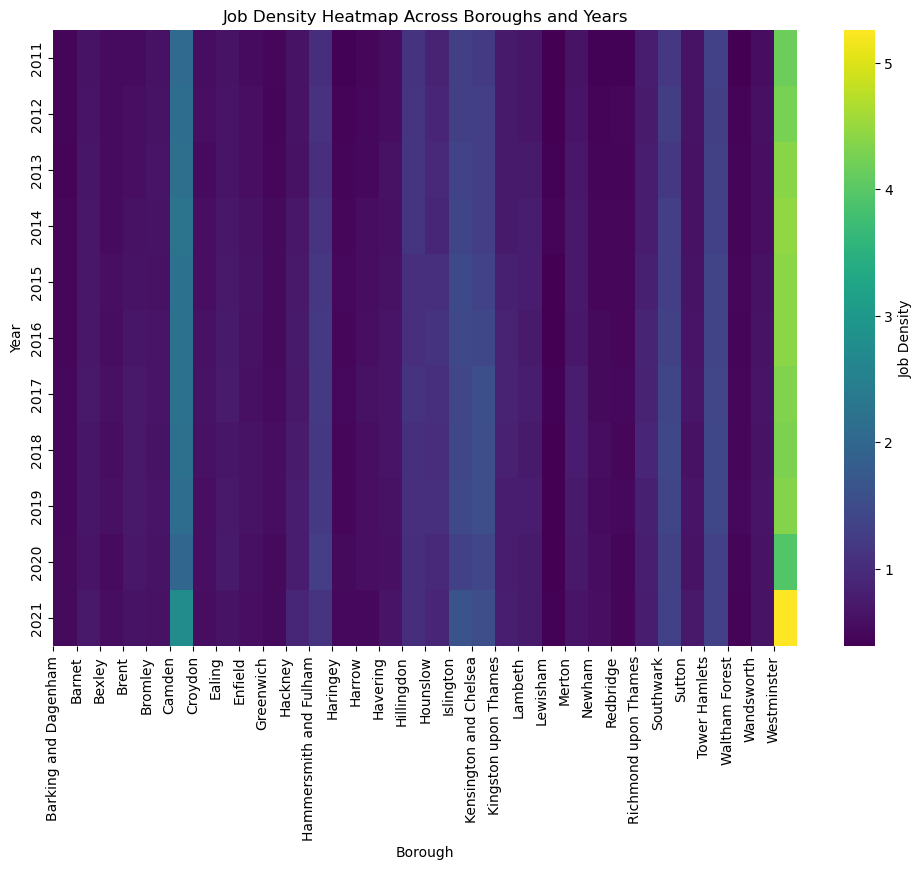

In [39]:
job_density_heatmap(job_density_data)

The heatmap above indicates that boroughs with consistently high job density throughout the period, shown in lighter colours, tend to be concentrated in central London, including Westminster, Kensington and Chelsea, Camden. Dark purple areas on the heatmap, indicating lower job density, are more prevalent in outer boroughs like Barking and Dagenham, Havering, Bexley, and Croydon. There are some exceptions to this trend. For example, Hammersmith and Fulham, despite being located in central location, exhibits lower job density in some years.

Next we will explore the data in the crime dataaset visually using line plots and graphs. 

Define the function to plot the trend of major crimes over time.

In [40]:
def major_category_crimes_trend(crimes_yearly_data):
    
    
    plt.figure(figsize=(12, 8))
    sns.set_style("whitegrid")

    # Melt the DataFrame to have 'Year' as a separate column
    melted_data = pd.melt(crimes_yearly_data, id_vars=['Major Category', 'Borough'], 
                          var_name='Year', value_name='Crime Count')

    # Filter out non-numeric values in the 'Year' column
    melted_data = melted_data[melted_data['Year'].str.isnumeric()]

    # Convert 'Year' to numeric for proper sorting
    melted_data['Year'] = pd.to_numeric(melted_data['Year'])

    # Use a line plot to visualize major category crimes over time
    sns.lineplot(data=melted_data, x='Year', y='Crime Count', hue='Major Category', ci=None)
    plt.title('Major Category Crimes Over Time')
    plt.xlabel('Year')
    plt.ylabel('Crime Count')
    plt.legend(title='Major Category', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

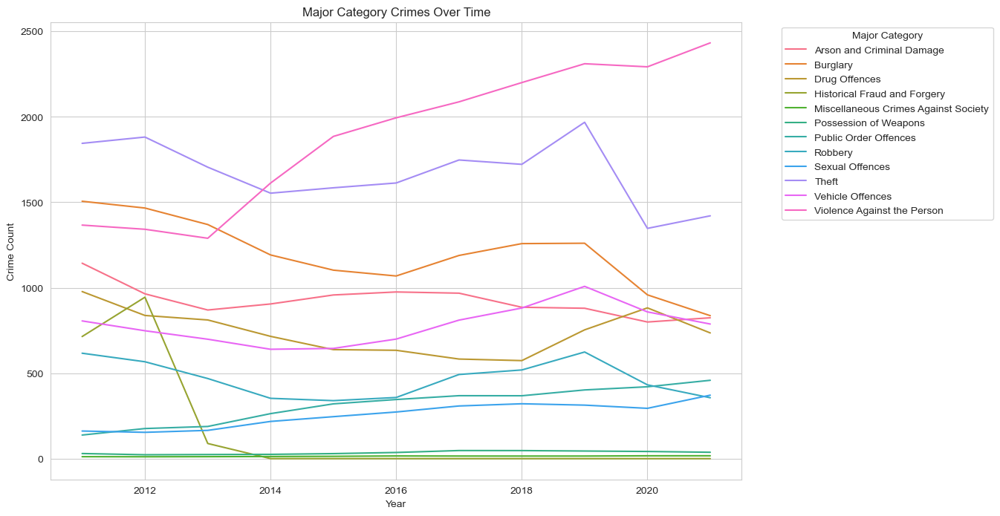

In [41]:
major_category_crimes_trend(crimes_yearly_data)

The line plot shows the tren of major crimes across the years. We notice that Violence against the Person is the most common crime and has been steadily from 2013. Theft is the next most common crime with a sharp decline in 2019. Drug Offences has seen a slight decline across the years. Historical Fraud and Forgery also saw a sharp decline from 2012 and remained low. Public Order Offences, Robbery and Sexual Offences showed a slight increase over the years. The plot shows that Possesion of Weapons and Miscellaneous Crimes against Society were relatively low throughout the period.

Define the function to plot the trend of Arson and Criminal Damage across the years.

In [42]:
def trend_of_Arson_and_Criminal_Damage(crimes_yearly_data):   
    
    plt.figure(figsize=(12, 6))
    sns.set_style("darkgrid")

    # Choose a Major Category to visualize
    major_category = 'Arson and Criminal Damage'

    # Filter the data for the selected category
    selected_data = crimes_yearly_data[crimes_yearly_data['Major Category'] == major_category]

    # Create a line plot for the trend in Arson and Criminal Damage over time
    plt.plot(selected_data.columns[3:], selected_data.iloc[0, 3:], marker='o', label=major_category)

    plt.title(f'Trend in Crime Rates Over Time for {major_category}')
    plt.xlabel('Year')
    plt.ylabel('Crime Count')
    plt.legend()
    plt.show()

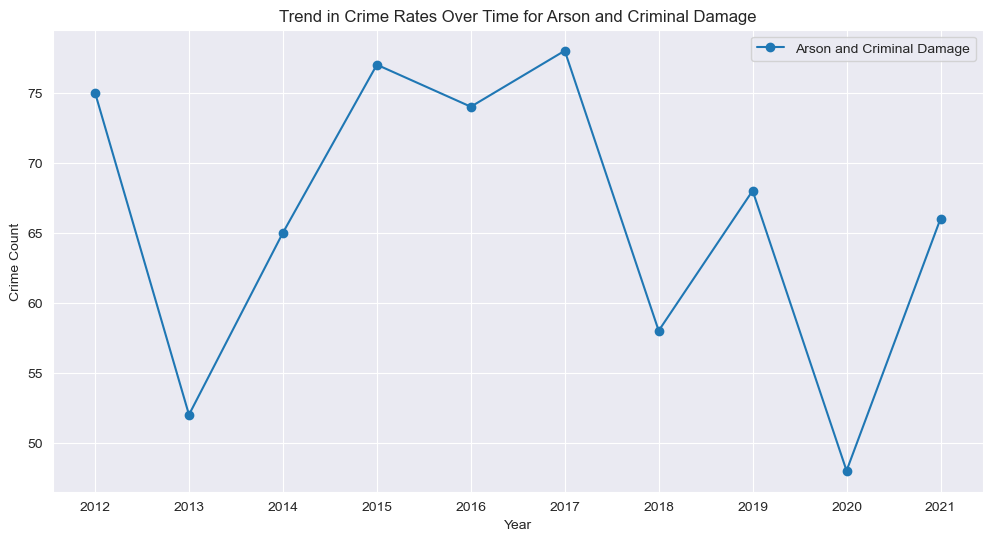

In [43]:
trend_of_Arson_and_Criminal_Damage(crimes_yearly_data)

The line plot shows the trend in crime rates over time for arson and criminal damage in all boroughs. There has been a steady drop from 2017 but it increased in 2020.

Define the function to plot the trend of Burglary across the years.

In [44]:
def trend_of_Burglary(crimes_yearly_data): 
    
    plt.figure(figsize=(12, 6))
    sns.set_style("darkgrid")

    # Choose a Major Category to visualize
    major_category = 'Burglary'

    # Filter the data for the selected category
    selected_data = crimes_yearly_data[crimes_yearly_data['Major Category'] == major_category]

    # Create a line plot for the trend in Burglary over time
    plt.plot(selected_data.columns[3:], selected_data.iloc[0, 3:], marker='o', label=major_category)

    
    plt.title(f'Trend in Crime Rates Over Time for {major_category}')
    plt.xlabel('Year')
    plt.ylabel('Crime Count')
    plt.legend()
    plt.show()

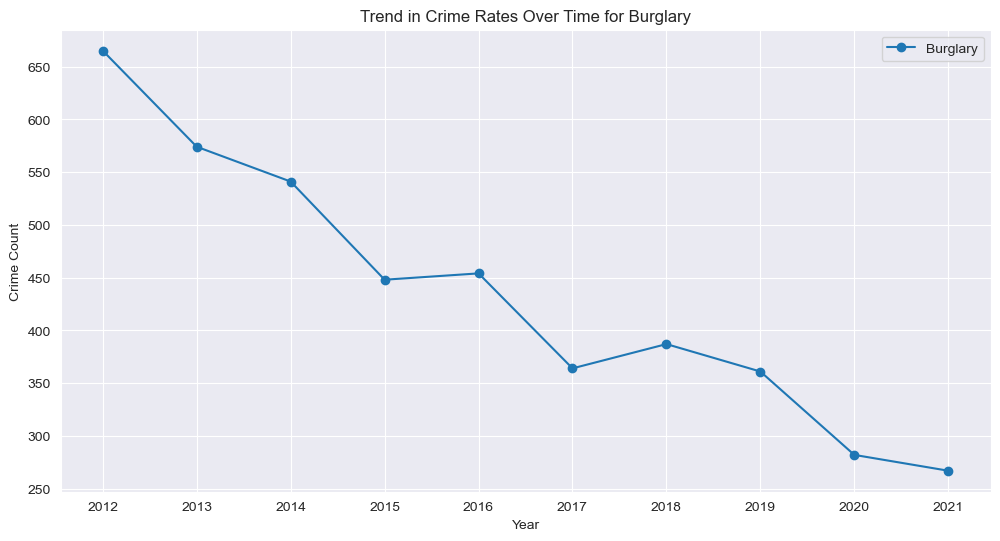

In [45]:
trend_of_Burglary(crimes_yearly_data)

The line plot shows the trend in crime rates over time for burglary in all boroughs. It shows a steady decrease from 2011 to 2021.

Define the function to plot the trend of Drug Offences across the years.

In [46]:
def trend_of_Drug_Offences(crimes_yearly_data): 
    
    plt.figure(figsize=(14, 8))
    sns.set_style("darkgrid")

    # Choose a Major Category to visualize
    major_category = 'Drug Offences'

    # Filter the data for the selected category
    selected_data = crimes_yearly_data[crimes_yearly_data['Major Category'] == major_category]

    # Create a line plot for the trend in Drug Offences over time
    plt.plot(selected_data.columns[3:], selected_data.iloc[0, 3:], marker='o', label=major_category)

    
    plt.title(f'Trend in Crime Rates Over Time for {major_category}')
    plt.xlabel('Year')
    plt.ylabel('Crime Count')
    plt.legend()
    plt.show()

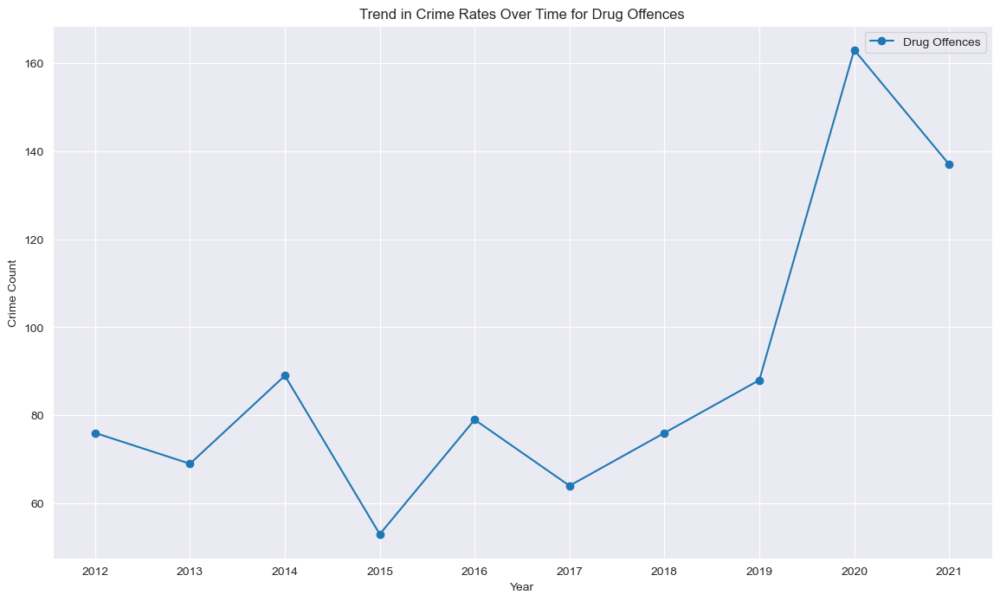

In [47]:
trend_of_Drug_Offences(crimes_yearly_data)

The line plot shows the trend in crime rates over time for drug offences in all boroughs. There was a sharp rise in 2019 and a drop in the crime in 2020.

Define the function to plot the trend of Historical Fraud and Forgery across the years.

In [48]:
def trend_of_Historical_Fraud_and_Forgery(crimes_yearly_data): 
    
    plt.figure(figsize=(14, 8))
    sns.set_style("darkgrid")

    # Choose a Major Category to visualize
    major_category = 'Historical Fraud and Forgery'

    # Filter the data for the selected category
    selected_data = crimes_yearly_data[crimes_yearly_data['Major Category'] == major_category]

    # Create a line plot for the trend in Historical Fraud and Forgery over time
    plt.plot(selected_data.columns[3:], selected_data.iloc[0, 3:], marker='o', label=major_category)

   
    plt.title(f'Trend in Crime Rates Over Time for {major_category}')
    plt.xlabel('Year')
    plt.ylabel('Crime Count')
    plt.legend()
    plt.show()

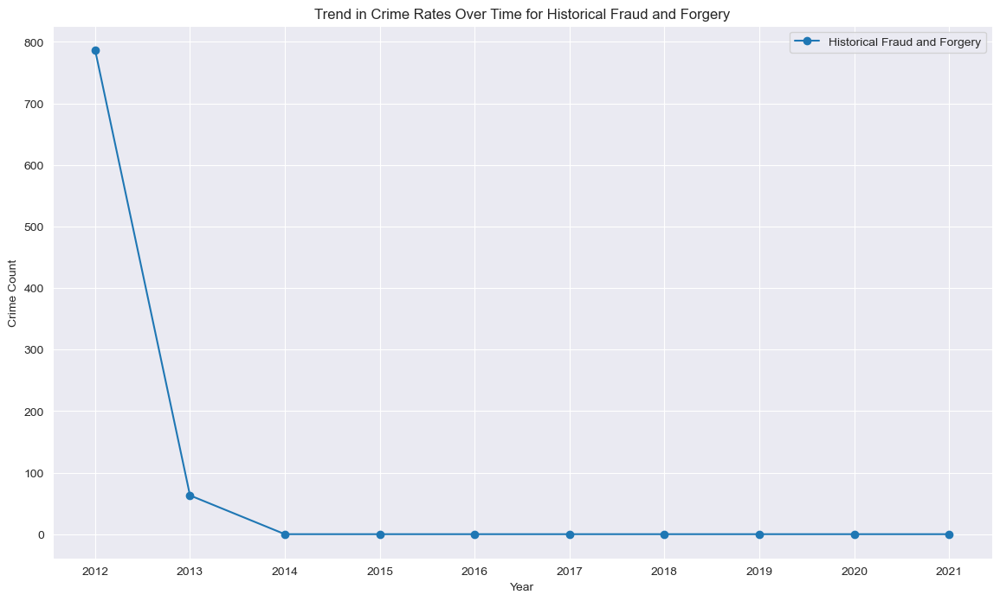

In [49]:
trend_of_Historical_Fraud_and_Forgery(crimes_yearly_data)

The line plot shows the trend in crime rates over time for historical fraud and forgery in all boroughs. There was a steep drop in the crime in 2020 and no other crime was recorded throughout the period in this research.

Define the function to plot the trend of Miscellaneous Crimes Against Society across the years.

In [50]:
def trend_of_Miscellaneous_Crimes_Against_Society(crimes_yearly_data): 
    
    plt.figure(figsize=(14, 8))
    sns.set_style("darkgrid")

    # Choose a Major Category to visualize
    major_category = 'Miscellaneous Crimes Against Society'

    # Filter the data for the selected category
    selected_data = crimes_yearly_data[crimes_yearly_data['Major Category'] == major_category]

    # Create a line plot for the trend in Miscellaneous Crimes Against Society over time
    plt.plot(selected_data.columns[3:], selected_data.iloc[0, 3:], marker='o', label=major_category)

   
    plt.title(f'Trend in Crime Rates Over Time for {major_category}')
    plt.xlabel('Year')
    plt.ylabel('Crime Count')
    plt.legend()
    plt.show()

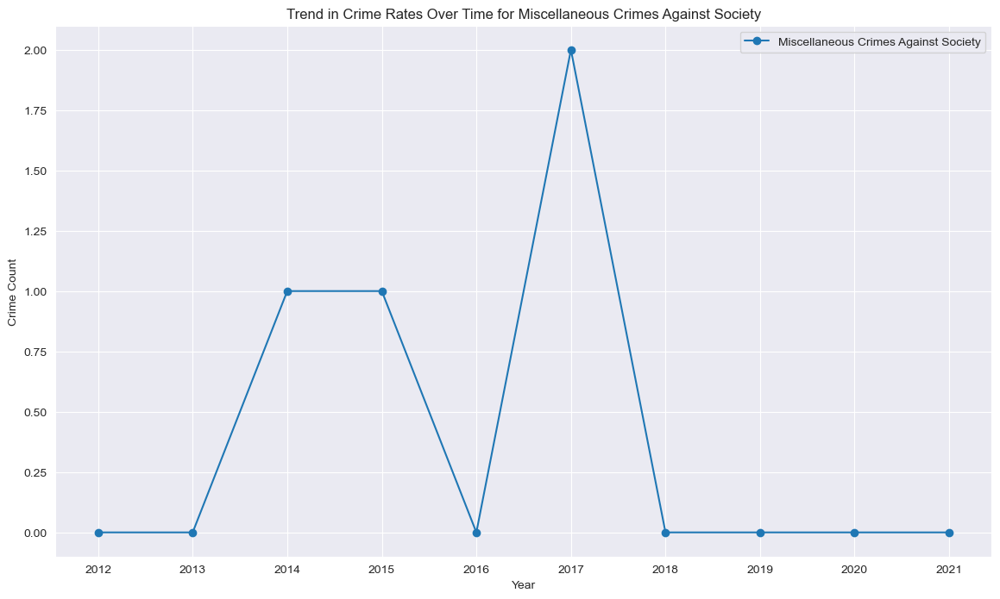

In [51]:
trend_of_Miscellaneous_Crimes_Against_Society(crimes_yearly_data)

The line plot shows the trend in crime rates over time for miscellaneous crimes against society in all boroughs. The plot shows that the rate of the crime has been oscillating over the years and none has been recorded since 2018. This might be due to the fact that not all crimes are reported to the police.

Define the function to plot the trend of Possession of Weapons across the years.

In [52]:
def trend_of_Possession_of_Weapons(crimes_yearly_data): 
    
    plt.figure(figsize=(14, 8))
    sns.set_style("darkgrid")

    # Choose a Major Category to visualize
    major_category = 'Possession of Weapons'

    # Filter the data for the selected category
    selected_data = crimes_yearly_data[crimes_yearly_data['Major Category'] == major_category]

    # Create a line plot for the trend in Possession of Weapons over time
    plt.plot(selected_data.columns[3:], selected_data.iloc[0, 3:], marker='o', label=major_category)

   
    plt.title(f'Trend in Crime Rates Over Time for {major_category}')
    plt.xlabel('Year')
    plt.ylabel('Crime Count')
    plt.legend()
    plt.show()

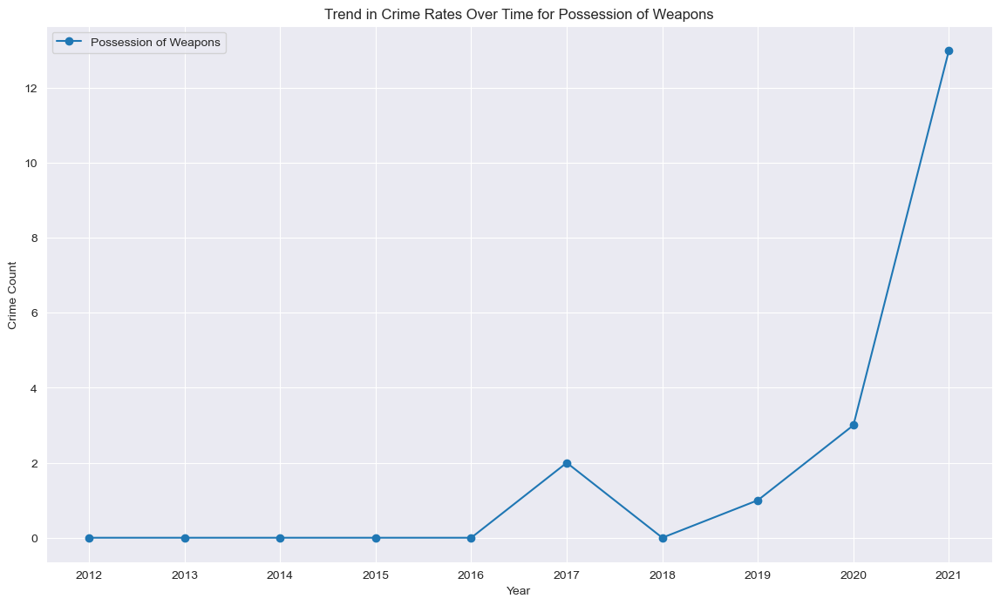

In [53]:
trend_of_Possession_of_Weapons(crimes_yearly_data)

The line plot shows the trend in crime rates over time for possesion of weapons in all boroughs. There has been a steady increase since 2018 with a sharp increase in 2020.

Define the function to plot the trend of Public Order Offences across the years.

In [54]:
def trend_of_Public_Order_Offences(crimes_yearly_data): 
    
    plt.figure(figsize=(14, 8))
    sns.set_style("darkgrid")

    # Choose a Major Category to visualize
    major_category = 'Public Order Offences'

    # Filter the data for the selected category
    selected_data = crimes_yearly_data[crimes_yearly_data['Major Category'] == major_category]

    # Create a line plot for the trend in Public Order Offences over time
    plt.plot(selected_data.columns[3:], selected_data.iloc[0, 3:], marker='o', label=major_category)

  
    plt.title(f'Trend in Crime Rates Over Time for {major_category}')
    plt.xlabel('Year')
    plt.ylabel('Crime Count')
    plt.legend()
    plt.show()

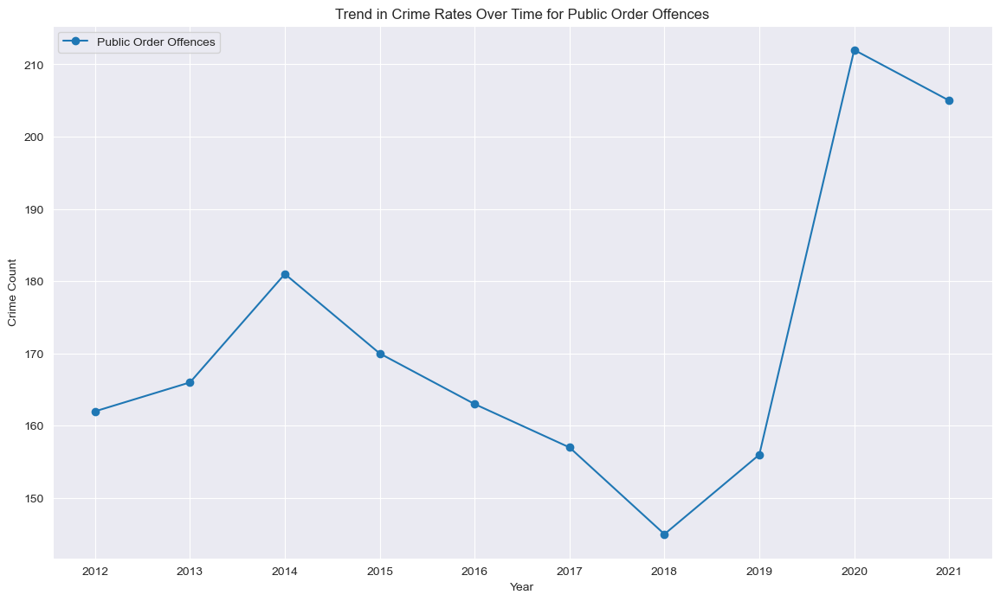

In [55]:
trend_of_Public_Order_Offences(crimes_yearly_data)

The line plot shows the trend in crime rates over time for public order offences in all boroughs. There was a steady drop in the rate of the crime from 2014 with a spike in the crime from 2018.

Define the function to plot the trend of Robbery across the years.

In [56]:
def trend_of_Robbery(crimes_yearly_data): 
       
    plt.figure(figsize=(14, 8))
    sns.set_style("darkgrid")

    # Choose a Major Category to visualize
    major_category = 'Robbery'

    # Filter the data for the selected category
    selected_data = crimes_yearly_data[crimes_yearly_data['Major Category'] == major_category]

    # Create a line plot for the trend in Robbery over time
    plt.plot(selected_data.columns[3:], selected_data.iloc[0, 3:], marker='o', label=major_category)

    plt.title(f'Trend in Crime Rates Over Time for {major_category}')
    plt.xlabel('Year')
    plt.ylabel('Crime Count')
    plt.legend()
    plt.show()

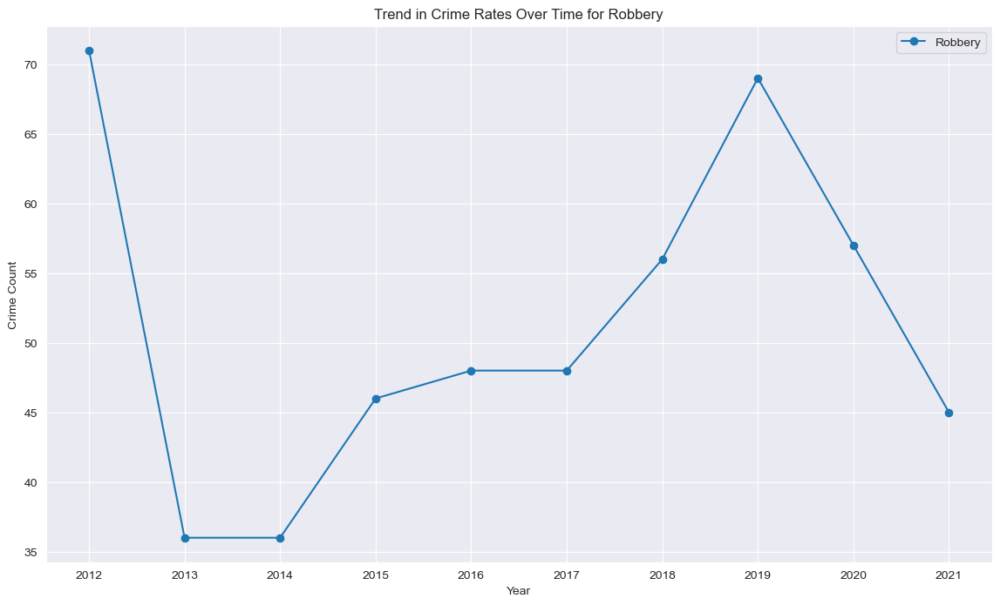

In [57]:
trend_of_Robbery(crimes_yearly_data)

The line plot shows the trend in crime rates over time for robbery in all boroughs. There has been a steady rise since 2014 and a sharp drop from 2019.

Define the function to plot the trend of Sexual Offences across the years.

In [58]:
def trend_of_Sexual_Offences(crimes_yearly_data):     
    
    plt.figure(figsize=(14, 8))
    sns.set_style("darkgrid")

    # Choose a Major Category to visualize
    major_category = 'Sexual Offences'

    # Filter the data for the selected category
    selected_data = crimes_yearly_data[crimes_yearly_data['Major Category'] == major_category]

    # Create a line plot for the trend in Sexual Offences over time
    plt.plot(selected_data.columns[3:], selected_data.iloc[0, 3:], marker='o', label=major_category)


    plt.title(f'Trend in Crime Rates Over Time for {major_category}')
    plt.xlabel('Year')
    plt.ylabel('Crime Count')
    plt.legend()
    plt.show()

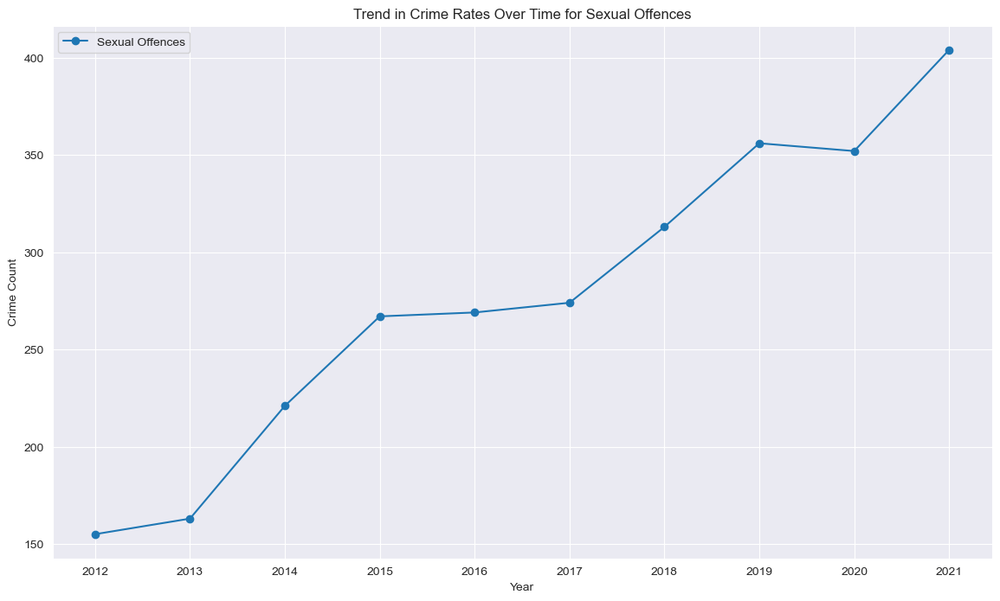

In [59]:
trend_of_Sexual_Offences(crimes_yearly_data)

The line plot shows the trend in crime rates over time for sexual offences in all boroughs. The plot shows a steady rise in the crime from 2012.

Define the function to plot the trend of Theft across the years.

In [60]:
def trend_of_Theft(crimes_yearly_data):      
    
    plt.figure(figsize=(14, 8))
    sns.set_style("darkgrid")

    # Choose a Major Category to visualize
    major_category = 'Theft'

    # Filter the data for the selected category
    selected_data = crimes_yearly_data[crimes_yearly_data['Major Category'] == major_category]

    # Create a line plot for the trend in Theft over time
    plt.plot(selected_data.columns[3:], selected_data.iloc[0, 3:], marker='o', label=major_category)

    
    plt.title(f'Trend in Crime Rates Over Time for {major_category}')
    plt.xlabel('Year')
    plt.ylabel('Crime Count')
    plt.legend()
    plt.show()

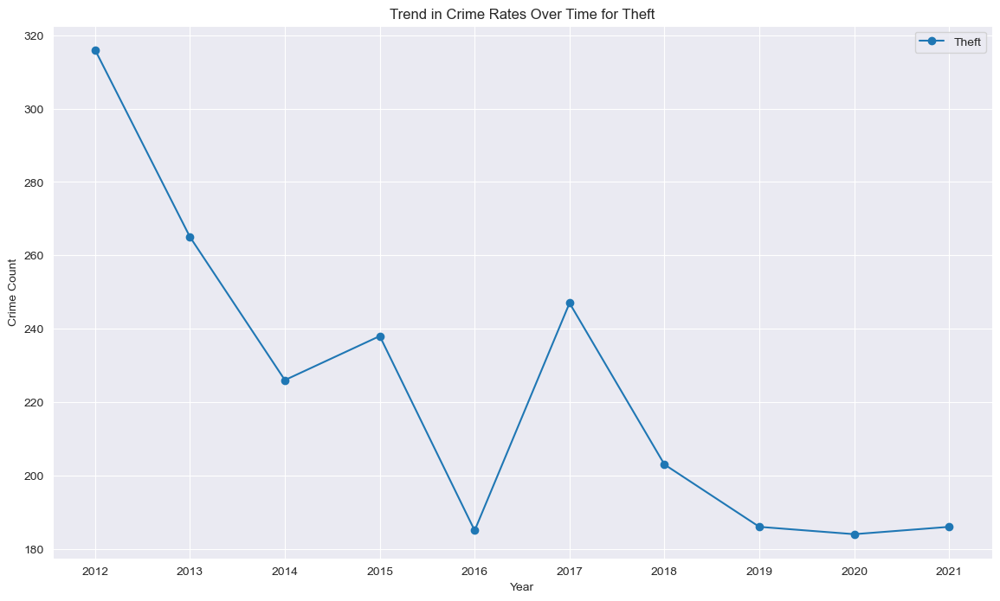

In [61]:
trend_of_Theft(crimes_yearly_data)

The line plot shows the trend in crime rates over time for theft in all boroughs. There has been a steady drop in the crime since 2012 but there was a spike in the crime rate between 2016 and 2017.

Define the function to plot the trend of Vehicle Offences across the years.

In [62]:
def trend_of_Vehicle_Offences(crimes_yearly_data):       
    
    plt.figure(figsize=(14, 8))
    sns.set_style("darkgrid")

    # Choose a Major Category to visualize
    major_category = 'Vehicle Offences'

    # Filter the data for the selected category
    selected_data = crimes_yearly_data[crimes_yearly_data['Major Category'] == major_category]

    # Create a line plot for the trend in Vehicle Offences over time
    plt.plot(selected_data.columns[3:], selected_data.iloc[0, 3:], marker='o', label=major_category)

    
    plt.title(f'Trend in Crime Rates Over Time for {major_category}')
    plt.xlabel('Year')
    plt.ylabel('Crime Count')
    plt.legend()
    plt.show()

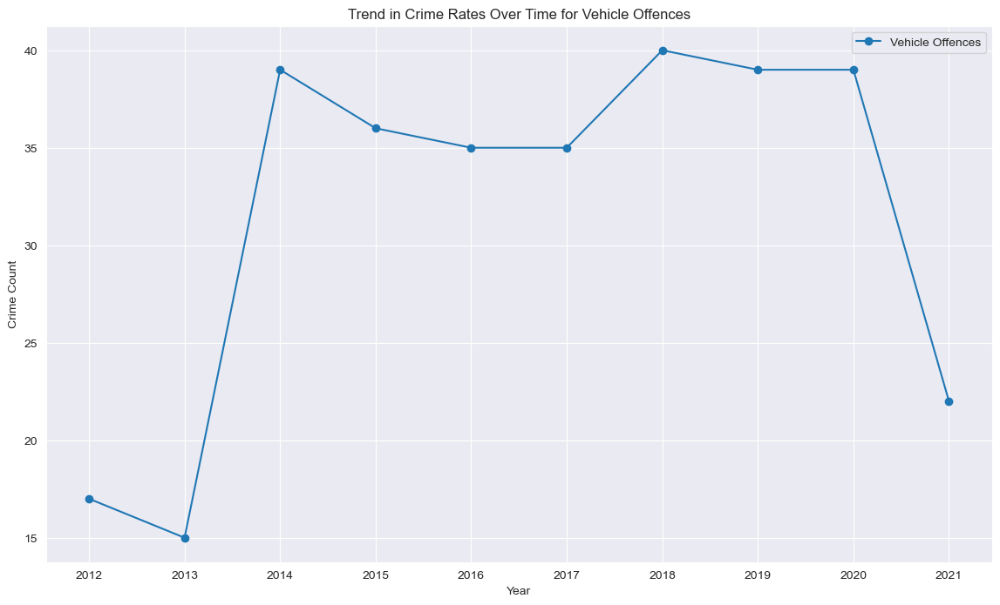

In [63]:
trend_of_Vehicle_Offences(crimes_yearly_data)

The line plot shows the trend in crime rates over time for vehicle offences in all boroughs. The plot shows a spike in the crime rate in 2013 and a steep drop in 2020. 

Define the function to plot the trend of Violence Against the Person across the years.

In [64]:
def trend_of_Vehicle_Offences(crimes_yearly_data):      
    
    plt.figure(figsize=(14, 8))
    sns.set_style("darkgrid")

    # Choose a Major Category to visualize
    major_category = 'Violence Against the Person'

    # Filter the data for the selected category
    selected_data = crimes_yearly_data[crimes_yearly_data['Major Category'] == major_category]

    # Create a line plot for the trend in Violence Against the Person over time
    plt.plot(selected_data.columns[3:], selected_data.iloc[0, 3:], marker='o', label=major_category)
    plt.title(f'Trend in Crime Rates Over Time for {major_category}')
    plt.xlabel('Year')
    plt.ylabel('Crime Count')
    plt.legend()
    plt.show()

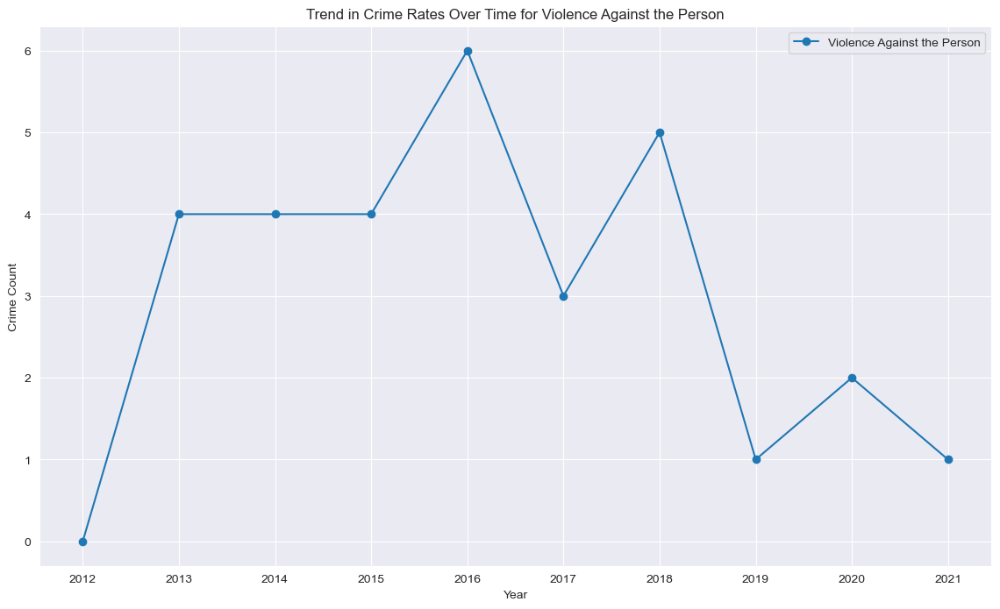

In [65]:
trend_of_Vehicle_Offences(crimes_yearly_data)

The line plot shows the trend in crime rates over time for violence against the person in all boroughs. There has been a drop in the crime rate from 2016.

Next, we will create a new column to sum up the total number of crimes in all the boroughs for visualization.

In [66]:
# Sum all the crimes in same category in a new column 'Overall Crime Rate'
crimes_yearly_data['Overall Crime Rate'] = crimes_yearly_data.loc[:, '2011':'2021'].sum(axis=1)
crimes_yearly_data = crimes_yearly_data.reset_index()
crimes_yearly_data.head()

C:\Users\olaju\AppData\Local\Temp\ipykernel_39376\1977347753.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  crimes_yearly_data['Overall Crime Rate'] = crimes_yearly_data.loc[:, '2011':'2021'].sum(axis=1)


,index,Major Category,Borough,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,Overall Crime Rate
0,0,Arson and Criminal Damage,Barking and Dagenham,132,75,52,65,77,74,78,58,68,48,66,793
1,1,Arson and Criminal Damage,Barking and Dagenham,2017,1613,1550,1553,1678,1816,1631,1392,1435,1276,1388,17349
2,2,Burglary,Barking and Dagenham,740,665,574,541,448,454,364,387,361,282,267,5083
3,3,Burglary,Barking and Dagenham,1625,1795,1669,1369,1184,840,1229,1285,1185,935,924,14040
4,4,Drug Offences,Barking and Dagenham,82,76,69,89,53,79,64,76,88,163,137,976


Define the function to plot the distribution of Total crimes across boroughs.

In [67]:
def Overall_Crime_Rate_Across_Boroughs(crimes_yearly_data):   
    
    # Create a bar chart to show the distribution of Total crimes across boroughs
    plt.figure(figsize=(12, 8))
    plt.bar(crimes_yearly_data['Borough'], crimes_yearly_data['Overall Crime Rate'], color='blue')
    plt.xlabel('Borough')
    plt.ylabel('Overall Crime Rate')
    plt.title('Overall Crime Rate Across Boroughs')
    plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
    plt.tight_layout()
    plt.show()

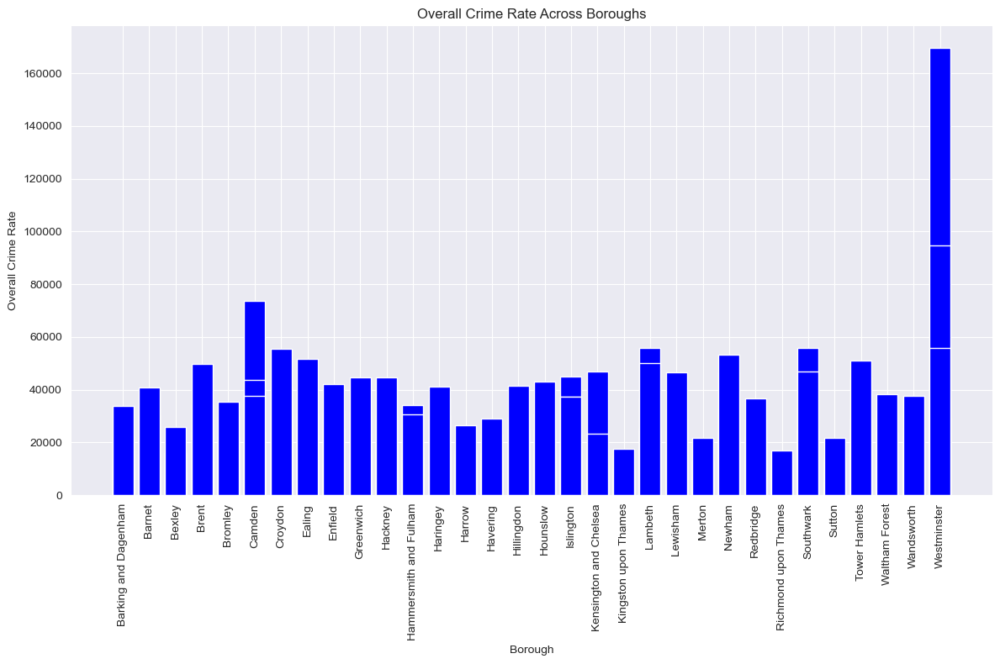

In [68]:
Overall_Crime_Rate_Across_Boroughs(crimes_yearly_data)

The above graph shows the distribution of crimes across the London boroughs, we notice that Westminster and Camdem has the highest crimes recorded across all borough while Richmond upon Thames and Kensington upon Thames has the lowest recorded crimes.

Define the function to plot the distribution of total number of crimes by major category.

In [69]:
def total_crimes_by_major_category(crimes_yearly_data): 
    
    # Group and sum up the Major category crimes
    total_major_category_crimes = crimes_yearly_data.groupby('Major Category').sum()

    # Create a bor chart to show the total number of crimes by major category
    plt.figure(figsize=(15, 8))
    sns.barplot(x=total_major_category_crimes.index, y=total_major_category_crimes['Overall Crime Rate'], color='green')
    plt.xticks(rotation=90, ha='right')
    plt.xlabel('Major Category')
    plt.ylabel('Total Number of Crimes')
    plt.title('Total Number of Crimes by Major Category')
    plt.show()

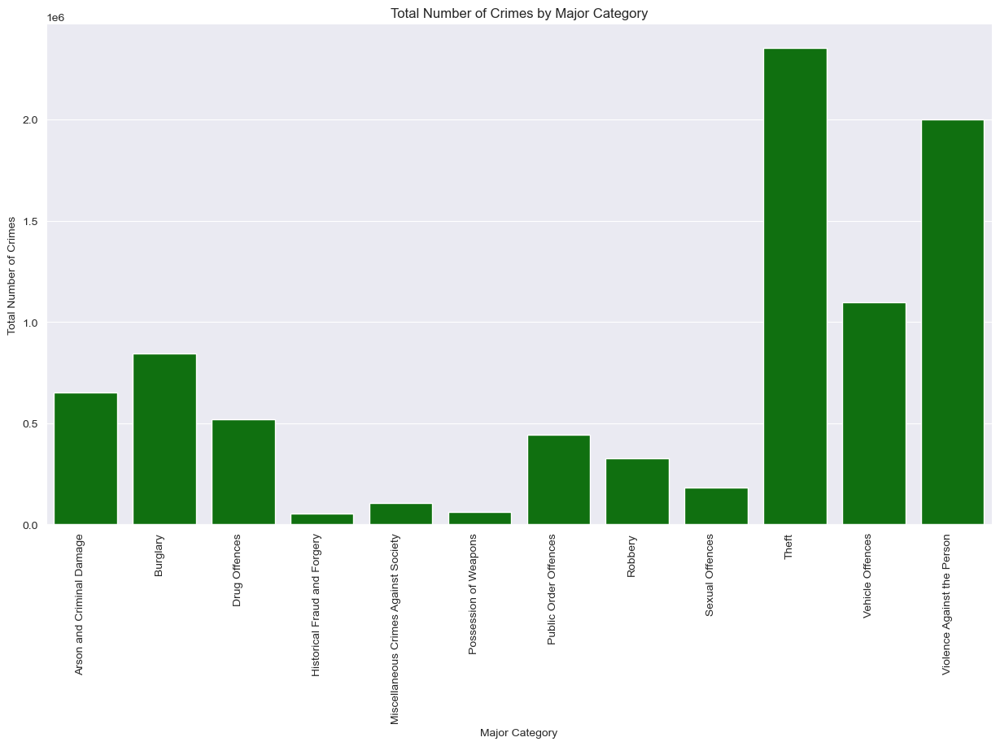

In [70]:
total_crimes_by_major_category(crimes_yearly_data)

The graph above displays the distribution of the major crime categories. It is clear that theft, violence against the person and vehicle offences are the most commited crimes while historical fraud and forgery, possesion of weapons and miscellaneous crimes against society are the least commited crimes.

Sum up the crimes in each borough.

In [71]:
crime_counts = crimes_yearly_data.groupby(['Borough', 'Major Category']).sum().reset_index()
crime_counts

,Borough,Major Category,index,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,Overall Crime Rate
0,Barking and Dagenham,Arson and Criminal Damage,1,2149,1688,1602,1618,1755,1890,1709,1450,1503,1324,1454,18142
1,Barking and Dagenham,Burglary,5,2365,2460,2243,1910,1632,1294,1593,1672,1546,1217,1191,19123
2,Barking and Dagenham,Drug Offences,9,996,1065,1278,1064,1194,1152,787,939,1164,1682,1626,12947
3,Barking and Dagenham,Historical Fraud and Forgery,6,628,787,63,0,0,0,0,0,0,0,0,1478
4,Barking and Dagenham,Miscellaneous Crimes Against Society,357,171,142,205,251,268,263,268,273,309,367,349,2866
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
379,Westminster,Robbery,3431,2219,2396,2259,1998,1547,1856,2392,3180,4467,2150,2227,26691
380,Westminster,Sexual Offences,3435,578,533,566,749,828,919,1051,1276,1160,917,1374,9951
381,Westminster,Theft,6882,36256,35531,30666,25073,25065,23769,27309,31512,46524,20490,21574,323769
382,Westminster,Vehicle Offences,6898,3134,3188,3534,3359,3175,4010,4354,4226,4893,3822,3496,41191


Next we will create heatmaps for the crime counts in each borough for each year.

In [72]:
# Define the function to plot a heatmap of major crimes across boroughs for 2011    
def crime_heatmap_2011(crime_counts):   
    
    # Pivot the DataFrame for heatmap
    crime_counts_pivot = crime_counts.pivot(index='Borough', columns='Major Category', values='2011')

    # Plot a heatmap
    plt.figure(figsize=(14, 8))
    sns.heatmap(crime_counts_pivot, cmap='Greens', annot=True, fmt='g', cbar_kws={'label': 'Crime Count'})
    plt.xlabel('Major Category')
    plt.ylabel('Borough')
    plt.title('Distribution of Crime Counts Across Boroughs and Categories (2011)')
    plt.tight_layout()
    plt.show()

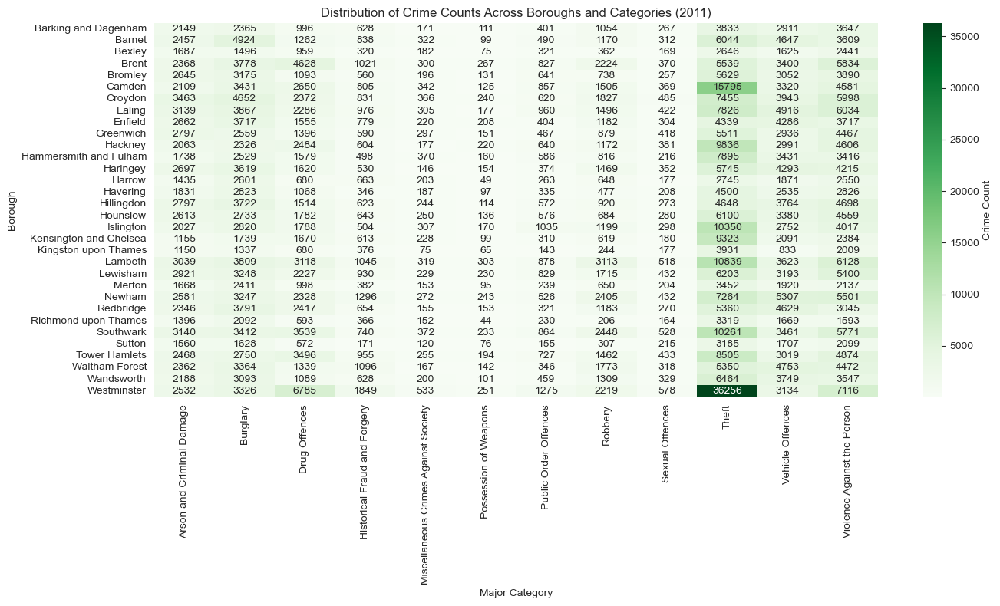

In [73]:
crime_heatmap_2011(crime_counts)

In [74]:
# Define the function to plot a heatmap of major crimes across boroughs for 2012   
def crime_heatmap_2012(crime_counts):   
    
    crime_counts = crimes_yearly_data.groupby(['Borough', 'Major Category']).sum().reset_index()
    # Pivot the DataFrame for heatmap
    crime_counts_pivot = crime_counts.pivot(index='Borough', columns='Major Category', values='2012')

    # Plot a heatmap
    plt.figure(figsize=(14, 8))
    sns.heatmap(crime_counts_pivot, cmap='Greens', annot=True, fmt='g', cbar_kws={'label': 'Crime Count'})
    plt.xlabel('Major Category')
    plt.ylabel('Borough')
    plt.title('Distribution of Crime Counts Across Boroughs and Categories (2012)')
    plt.tight_layout()
    plt.show()


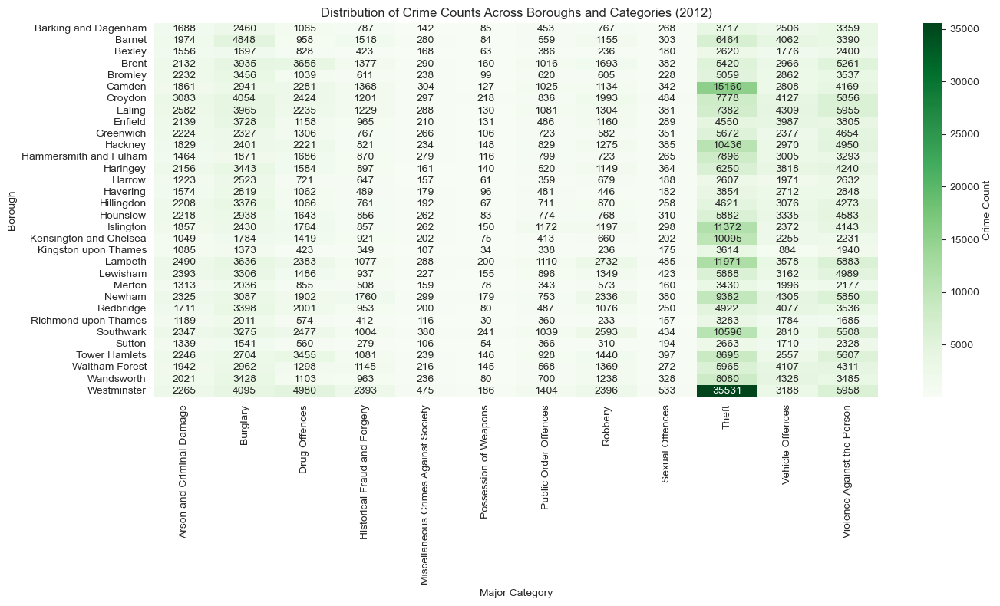

In [75]:
crime_heatmap_2012(crime_counts)

In [76]:
# Define the function to plot a heatmap of major crimes across boroughs for 2013   
def crime_heatmap_2013(crime_counts):  
    
    # Pivot the DataFrame for heatmap
    crime_counts_pivot = crime_counts.pivot(index='Borough', columns='Major Category', values='2013')

    # Plot a heatmap
    plt.figure(figsize=(14, 8))
    sns.heatmap(crime_counts_pivot, cmap='Greens', annot=True, fmt='g', cbar_kws={'label': 'Crime Count'})
    plt.xlabel('Major Category')
    plt.ylabel('Borough')
    plt.title('Distribution of Crime Counts Across Boroughs and Categories (2013)')
    plt.tight_layout()
    plt.show()

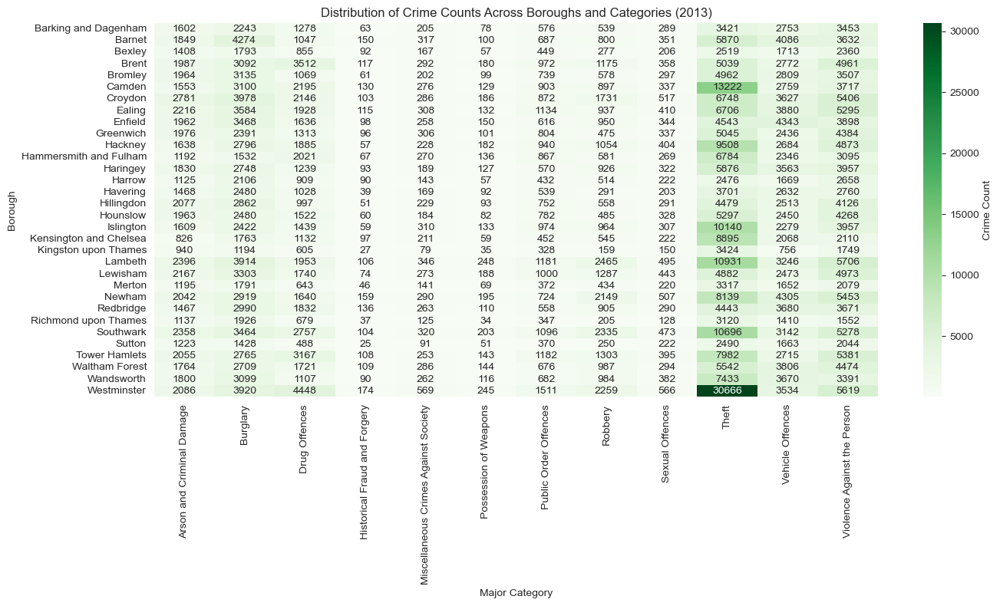

In [77]:
crime_heatmap_2013(crime_counts)

In [78]:
# Define the function to plot a heatmap of major crimes across boroughs for 2014  
def crime_heatmap_2014(crime_counts):  
    
    # Pivot the DataFrame for heatmap    
    crime_counts_pivot = crime_counts.pivot(index='Borough', columns='Major Category', values='2014')

    # Plot a heatmap
    plt.figure(figsize=(14, 8))
    sns.heatmap(crime_counts_pivot, cmap='Greens', annot=True, fmt='g', cbar_kws={'label': 'Crime Count'})
    plt.xlabel('Major Category')
    plt.ylabel('Borough')
    plt.title('Distribution of Crime Counts Across Boroughs and Categories (2014)')
    plt.tight_layout()
    plt.show()

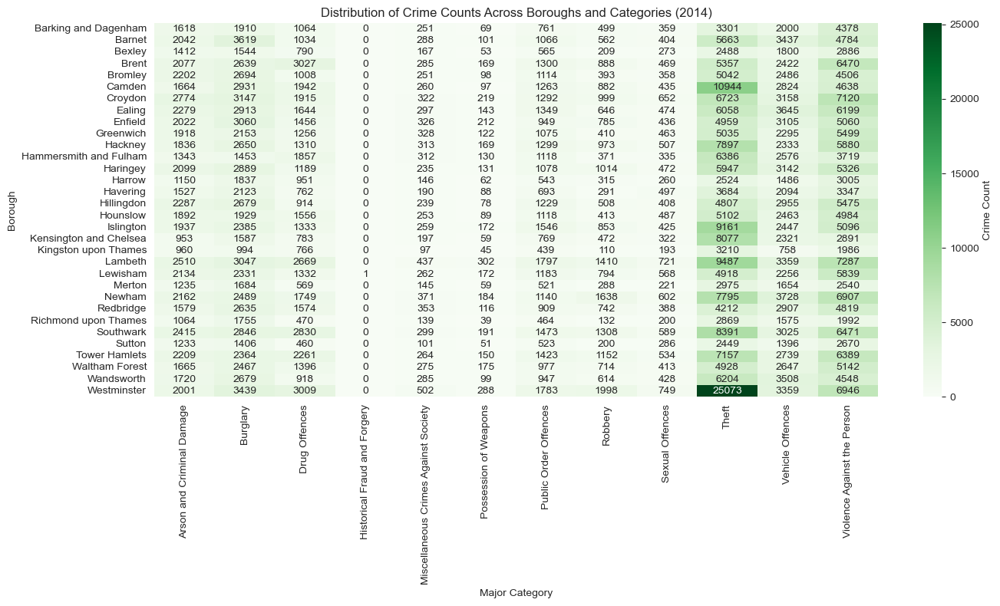

In [79]:
crime_heatmap_2014(crime_counts)

In [80]:
# Define the function to plot a heatmap of major crimes across boroughs for 2015  
def crime_heatmap_2015(crime_counts):  
    
    # Pivot the DataFrame for heatmap     
    crime_counts_pivot = crime_counts.pivot(index='Borough', columns='Major Category', values='2015')

    # Plot a heatmap
    plt.figure(figsize=(14, 8))
    sns.heatmap(crime_counts_pivot, cmap='Greens', annot=True, fmt='g', cbar_kws={'label': 'Crime Count'})
    plt.xlabel('Major Category')
    plt.ylabel('Borough')
    plt.title('Distribution of Crime Counts Across Boroughs and Categories (2015)')
    plt.tight_layout()
    plt.show()

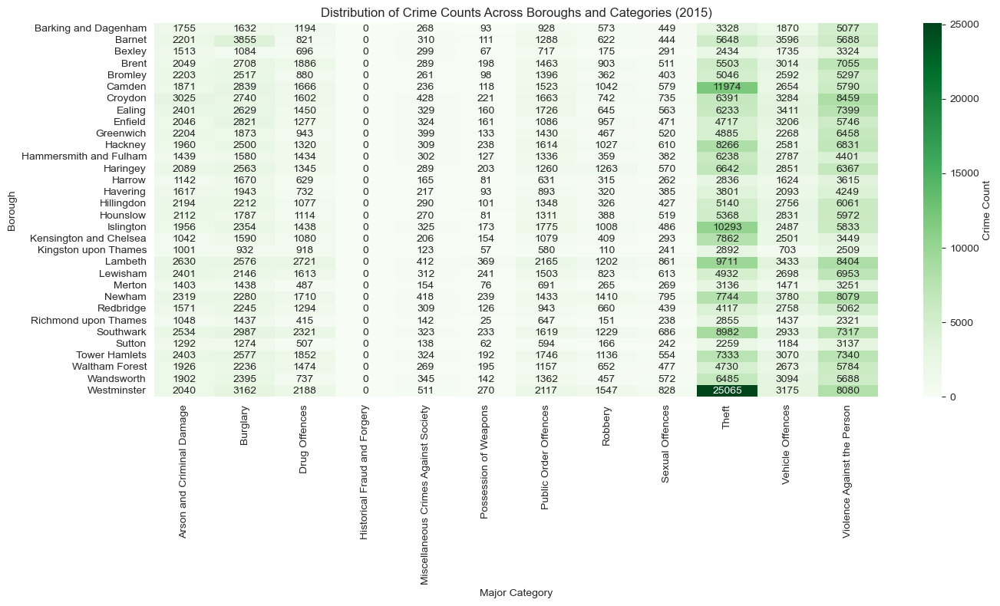

In [81]:
crime_heatmap_2015(crime_counts)

In [82]:
# Define the function to plot a heatmap of major crimes across boroughs for 2016  
def crime_heatmap_2016(crime_counts):  
    
    # Pivot the DataFrame for heatmap     
    crime_counts_pivot = crime_counts.pivot(index='Borough', columns='Major Category', values='2016')

    # Plot a heatmap
    plt.figure(figsize=(14, 8))
    sns.heatmap(crime_counts_pivot, cmap='Greens', annot=True, fmt='g', cbar_kws={'label': 'Crime Count'})
    plt.xlabel('Major Category')
    plt.ylabel('Borough')
    plt.title('Distribution of Crime Counts Across Boroughs and Categories (2016)')
    plt.tight_layout()
    plt.show()

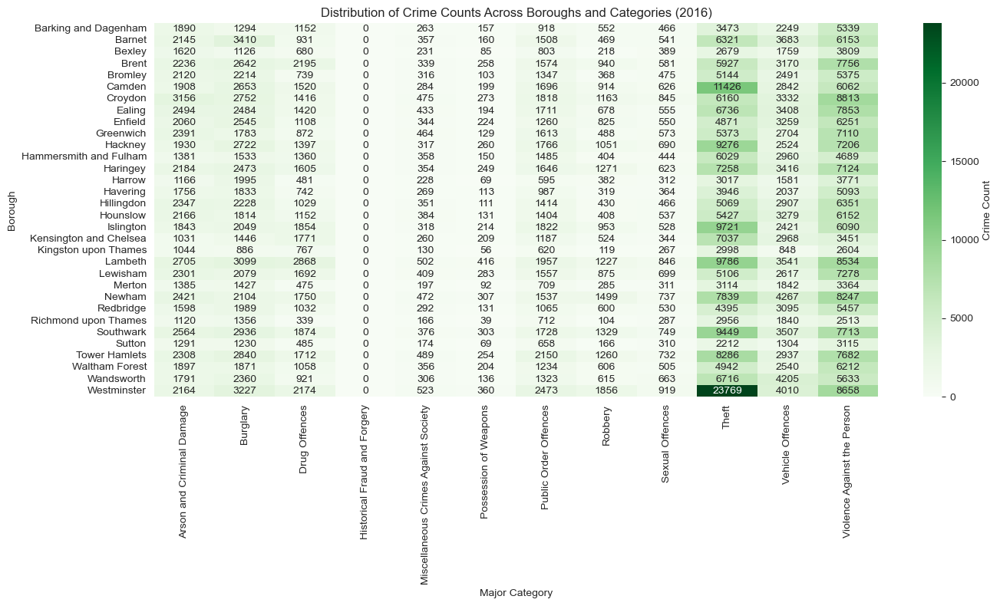

In [83]:
crime_heatmap_2016(crime_counts)

In [84]:
# Define the function to plot a heatmap of major crimes across boroughs for 2017  
def crime_heatmap_2017(crime_counts):  
    
    # Pivot the DataFrame for heatmap     
    crime_counts_pivot = crime_counts.pivot(index='Borough', columns='Major Category', values='2017')

    # Plot a heatmap
    plt.figure(figsize=(14, 8))
    sns.heatmap(crime_counts_pivot, cmap='Greens', annot=True, fmt='g', cbar_kws={'label': 'Crime Count'})
    plt.xlabel('Major Category')
    plt.ylabel('Borough')
    plt.title('Distribution of Crime Counts Across Boroughs and Categories (2017)')
    plt.tight_layout()
    plt.show()

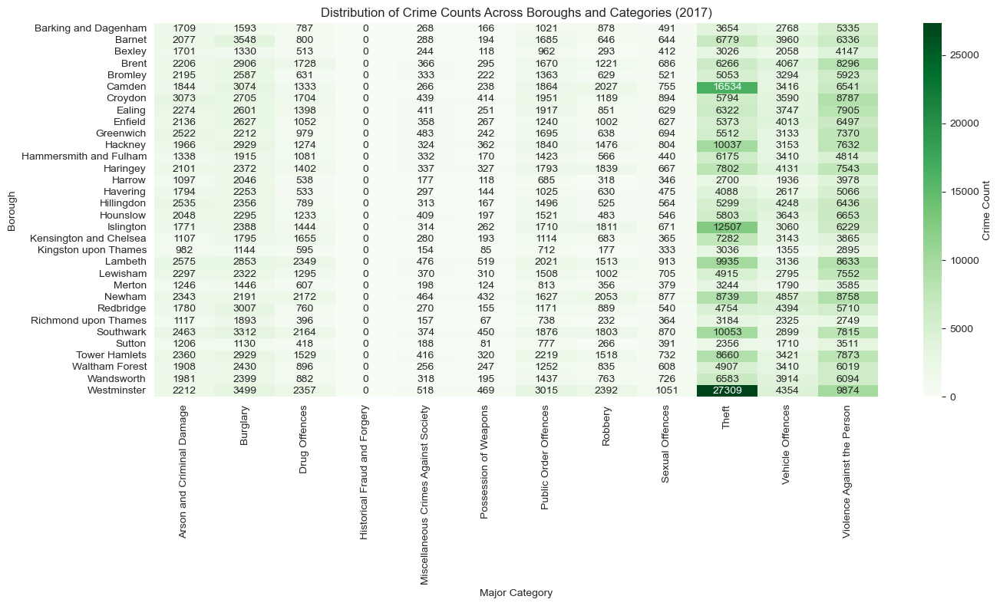

In [85]:
crime_heatmap_2017(crime_counts)

In [86]:
# Define the function to plot a heatmap of major crimes across boroughs for 2018  
def crime_heatmap_2018(crime_counts):  
    
    # Pivot the DataFrame for heatmap     
    crime_counts_pivot = crime_counts.pivot(index='Borough', columns='Major Category', values='2018')

    # Plot a heatmap
    plt.figure(figsize=(14, 8))
    sns.heatmap(crime_counts_pivot, cmap='Greens', annot=True, fmt='g', cbar_kws={'label': 'Crime Count'})
    plt.xlabel('Major Category')
    plt.ylabel('Borough')
    plt.title('Distribution of Crime Counts Across Boroughs and Categories (2018)')
    plt.tight_layout()
    plt.show()

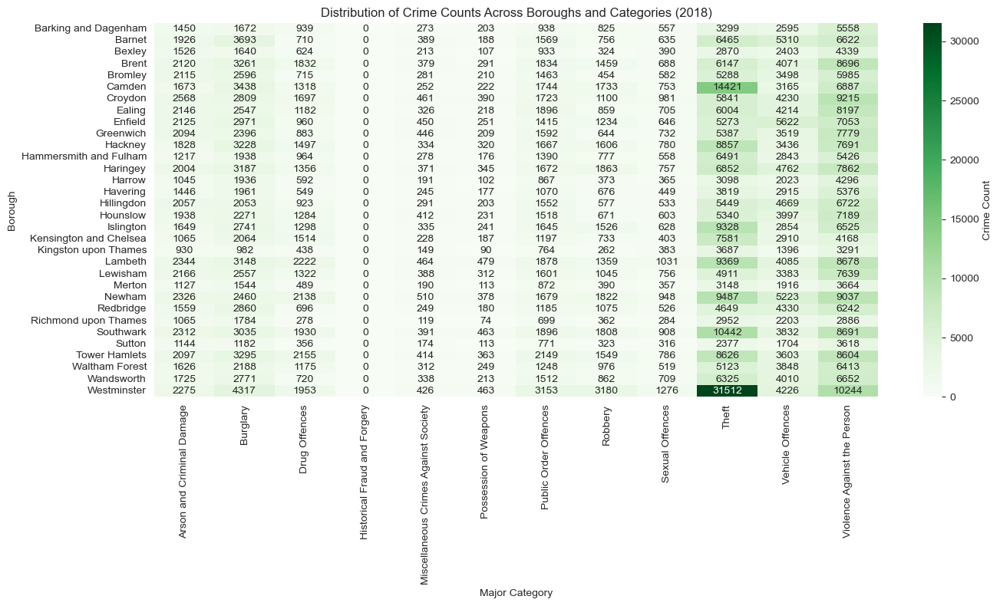

In [87]:
crime_heatmap_2018(crime_counts)

In [88]:
# Define the function to plot a heatmap of major crimes across boroughs for 2019  
def crime_heatmap_2019(crime_counts):  
    
    # Pivot the DataFrame for heatmap     
    crime_counts_pivot = crime_counts.pivot(index='Borough', columns='Major Category', values='2019')

    # Plot a heatmap
    plt.figure(figsize=(14, 8))
    sns.heatmap(crime_counts_pivot, cmap='Greens', annot=True, fmt='g', cbar_kws={'label': 'Crime Count'})
    plt.xlabel('Major Category')
    plt.ylabel('Borough')
    plt.title('Distribution of Crime Counts Across Boroughs and Categories (2019)')
    plt.tight_layout()
    plt.show()

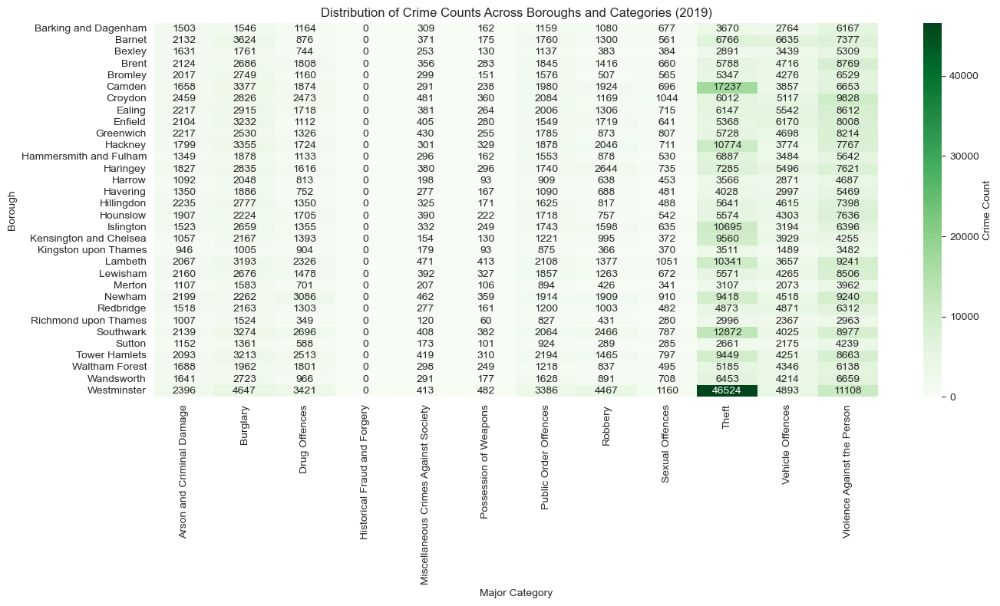

In [89]:
crime_heatmap_2019(crime_counts)

In [90]:
# Define the function to plot a heatmap of major crimes across boroughs for 2020  
def crime_heatmap_2020(crime_counts):  
    
    # Pivot the DataFrame for heatmap    
    crime_counts_pivot = crime_counts.pivot(index='Borough', columns='Major Category', values='2020')

    # Plot a heatmap
    plt.figure(figsize=(14, 8))
    sns.heatmap(crime_counts_pivot, cmap='Greens', annot=True, fmt='g', cbar_kws={'label': 'Crime Count'})
    plt.xlabel('Major Category')
    plt.ylabel('Borough')
    plt.title('Distribution of Crime Counts Across Boroughs and Categories (2020)')
    plt.tight_layout()
    plt.show()

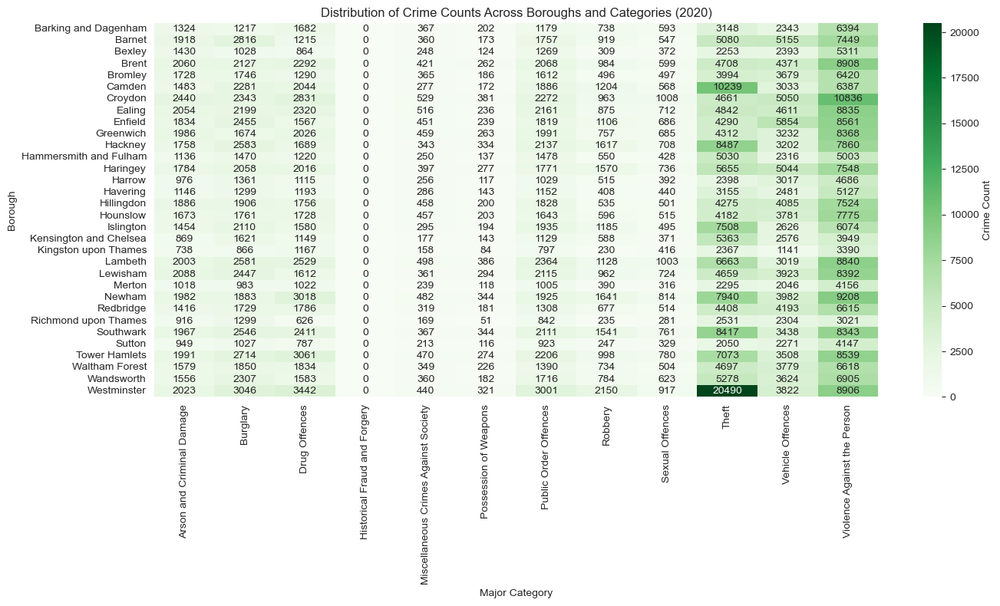

In [91]:
crime_heatmap_2020(crime_counts)

In [92]:
# Define the function to plot a heatmap of major crimes across boroughs for 2021  
def crime_heatmap_2021(crime_counts):  
    
    # Pivot the DataFrame for heatmap    
    crime_counts_pivot = crime_counts.pivot(index='Borough', columns='Major Category', values='2021')

    # Plot a heatmap
    plt.figure(figsize=(14, 8))
    sns.heatmap(crime_counts_pivot, cmap='Greens', annot=True, fmt='g', cbar_kws={'label': 'Crime Count'})
    plt.xlabel('Major Category')
    plt.ylabel('Borough')
    plt.title('Distribution of Crime Counts Across Boroughs and Categories (2021)')
    plt.tight_layout()
    plt.show()

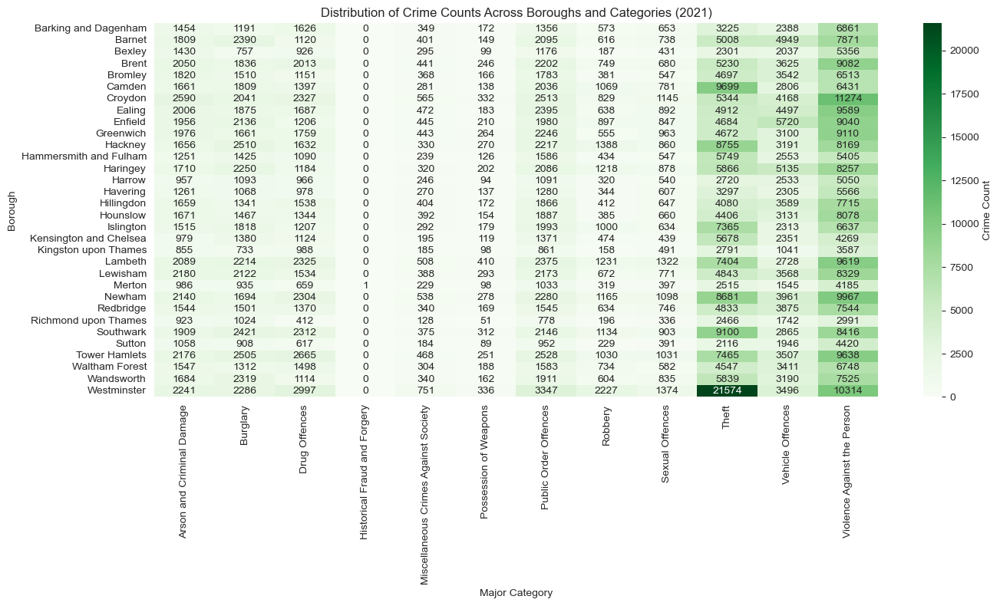

In [93]:
crime_heatmap_2021(crime_counts)

The heatmaps above indicates that theft and violence against the person in Westminster is the most common crime across the years.

## Statistical Analysis

The next step will be to find the relationship between job density and crime, to do this we will first have to merge the two datasets together using the .merge function in pandas.

In [94]:
job_density_crime_data = pd.merge(crimes_yearly_data, job_density_data, on='Borough', how='inner') # merge the two datasets with their common columns.
job_density_crime_data.head(10)

,index,Major Category,Borough,2011_x,2012_x,2013_x,2014_x,2015_x,2016_x,2017_x,...,2012_y,2013_y,2014_y,2015_y,2016_y,2017_y,2018_y,2019_y,2020_y,2021_y
0,0,Arson and Criminal Damage,Barking and Dagenham,132,75,52,65,77,74,78,...,0.46,0.44,0.47,0.48,0.48,0.49,0.49,0.5,0.52,0.51
1,1,Arson and Criminal Damage,Barking and Dagenham,2017,1613,1550,1553,1678,1816,1631,...,0.46,0.44,0.47,0.48,0.48,0.49,0.49,0.5,0.52,0.51
2,2,Burglary,Barking and Dagenham,740,665,574,541,448,454,364,...,0.46,0.44,0.47,0.48,0.48,0.49,0.49,0.5,0.52,0.51
3,3,Burglary,Barking and Dagenham,1625,1795,1669,1369,1184,840,1229,...,0.46,0.44,0.47,0.48,0.48,0.49,0.49,0.5,0.52,0.51
4,4,Drug Offences,Barking and Dagenham,82,76,69,89,53,79,64,...,0.46,0.44,0.47,0.48,0.48,0.49,0.49,0.5,0.52,0.51
5,5,Drug Offences,Barking and Dagenham,914,989,1209,975,1141,1073,723,...,0.46,0.44,0.47,0.48,0.48,0.49,0.49,0.5,0.52,0.51
6,6,Historical Fraud and Forgery,Barking and Dagenham,628,787,63,0,0,0,0,...,0.46,0.44,0.47,0.48,0.48,0.49,0.49,0.5,0.52,0.51
7,7,Miscellaneous Crimes Against Society,Barking and Dagenham,0,0,0,1,1,0,2,...,0.46,0.44,0.47,0.48,0.48,0.49,0.49,0.5,0.52,0.51
8,8,Miscellaneous Crimes Against Society,Barking and Dagenham,0,0,0,0,0,7,3,...,0.46,0.44,0.47,0.48,0.48,0.49,0.49,0.5,0.52,0.51
9,9,Miscellaneous Crimes Against Society,Barking and Dagenham,0,0,1,0,0,0,0,...,0.46,0.44,0.47,0.48,0.48,0.49,0.49,0.5,0.52,0.51


Check for missing values in the newly merged dataset.

In [95]:
job_density_crime_data.isnull().sum()

index                 0
Major Category        0
Borough               0
2011_x                0
2012_x                0
2013_x                0
2014_x                0
2015_x                0
2016_x                0
2017_x                0
2018_x                0
2019_x                0
2020_x                0
2021_x                0
Overall Crime Rate    0
Code                  0
2011_y                0
2012_y                0
2013_y                0
2014_y                0
2015_y                0
2016_y                0
2017_y                0
2018_y                0
2019_y                0
2020_y                0
2021_y                0
dtype: int64

In [96]:
list(job_density_crime_data)

['index',
 'Major Category',
 'Borough',
 '2011_x',
 '2012_x',
 '2013_x',
 '2014_x',
 '2015_x',
 '2016_x',
 '2017_x',
 '2018_x',
 '2019_x',
 '2020_x',
 '2021_x',
 'Overall Crime Rate',
 'Code',
 '2011_y',
 '2012_y',
 '2013_y',
 '2014_y',
 '2015_y',
 '2016_y',
 '2017_y',
 '2018_y',
 '2019_y',
 '2020_y',
 '2021_y']

## Correlation 

Next we will plot correlation matrix over the years to visualize the relationship between job density and major crime categories.

Define a function for the correlation matrix to visualize the relationship between job density and major crime categories

In [97]:
def plot_correlation_matrix_grid(job_density_crime_data, major_crime_category):
    
    # Filter data for the selected major crime category
    subset_data = job_density_crime_data[job_density_crime_data['Major Category'] == major_crime_category]

    # Define the years to visualize
    years_to_visualize = [str(year) for year in range(2011, 2022)]

    # Create subplots in a grid
    fig, axes = plt.subplots(3, 4, figsize=(20, 15))
    fig.suptitle(f'Correlation Matrix for {major_crime_category} and Job Density (2011-2021)', fontsize=16)

    for i, year in enumerate(years_to_visualize):
        row, col = divmod(i, 4)
        ax = axes[row, col]

        # Create a subset of the DataFrame with the selected columns for the current year
        subset_year_data = subset_data[[f'{year}_x', f'{year}_y']]

        # Calculate the correlation matrix
        correlation_matrix = subset_year_data.corr()

        # Visualize the correlation matrix
        sns.heatmap(correlation_matrix, annot=True, cmap='viridis', fmt=".2f", ax=ax)
        ax.set_title(year)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

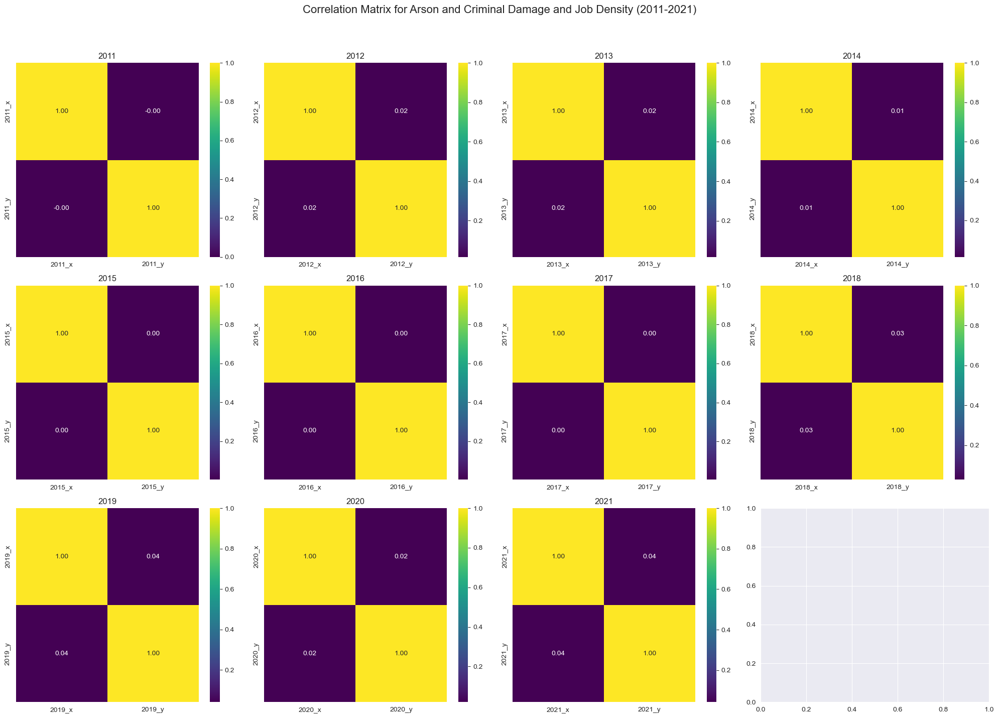

In [98]:
major_crime_category = 'Arson and Criminal Damage'
plot_correlation_matrix_grid(job_density_crime_data, major_crime_category)

The matrix shows that there is a weak positive correlation between job density and arson and criminal damage in most years. This means that the relationship between job density and the crime is not very strong.

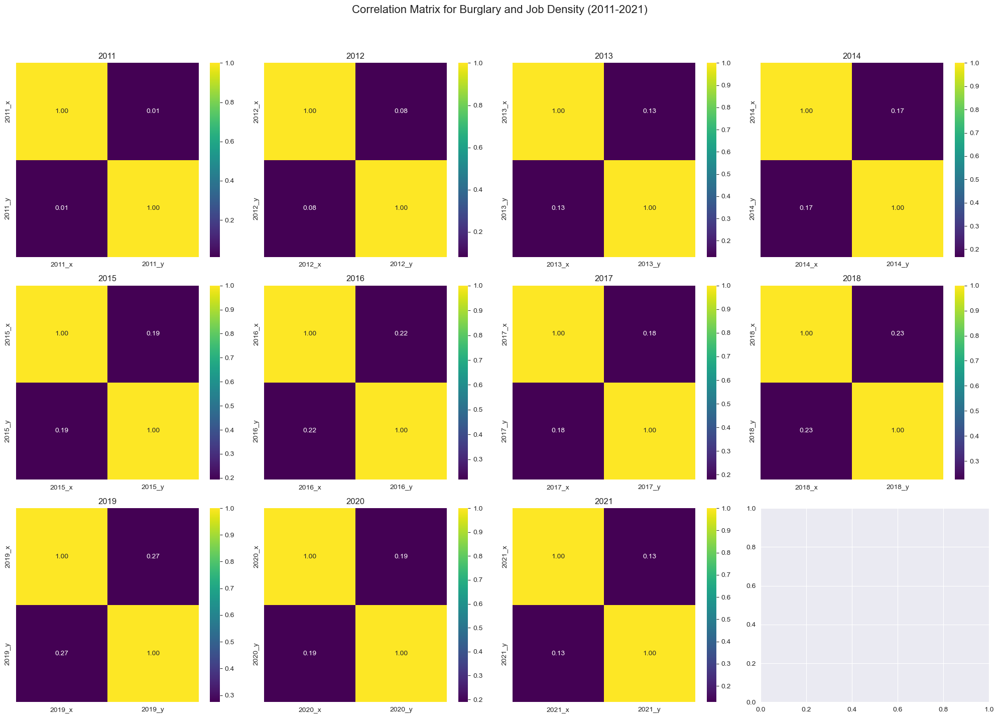

In [99]:
major_crime_category = 'Burglary'
plot_correlation_matrix_grid(job_density_crime_data, major_crime_category)

The matrix shows correlation coefficients less than 0.2, suggesting that there is a weak positive correlation between job density and burglary rates in London boroughs. This means that burglary rates tend to rise as job density rises, but the relationship isn't particularly strong.

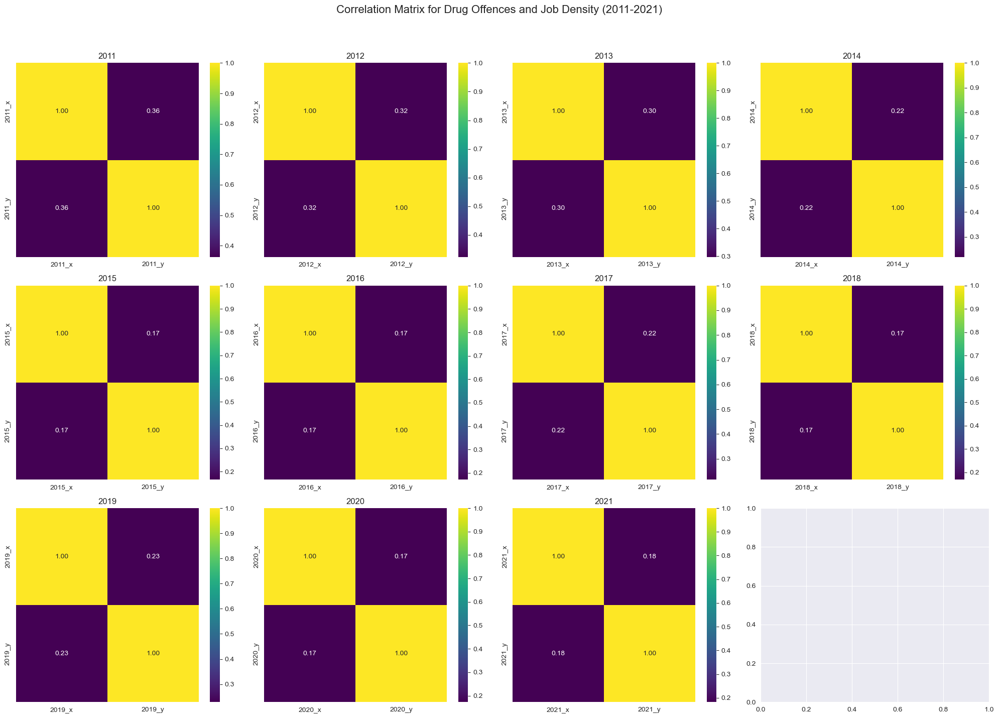

In [100]:
major_crime_category = 'Drug Offences'
plot_correlation_matrix_grid(job_density_crime_data, major_crime_category)

The correlation coefficients for all the years are positive, but they range from 0.17 to 0.36. This suggests a positive relationship between job density and drug offenses. This means that there is a tendency for drug offences to increase as job density increases.

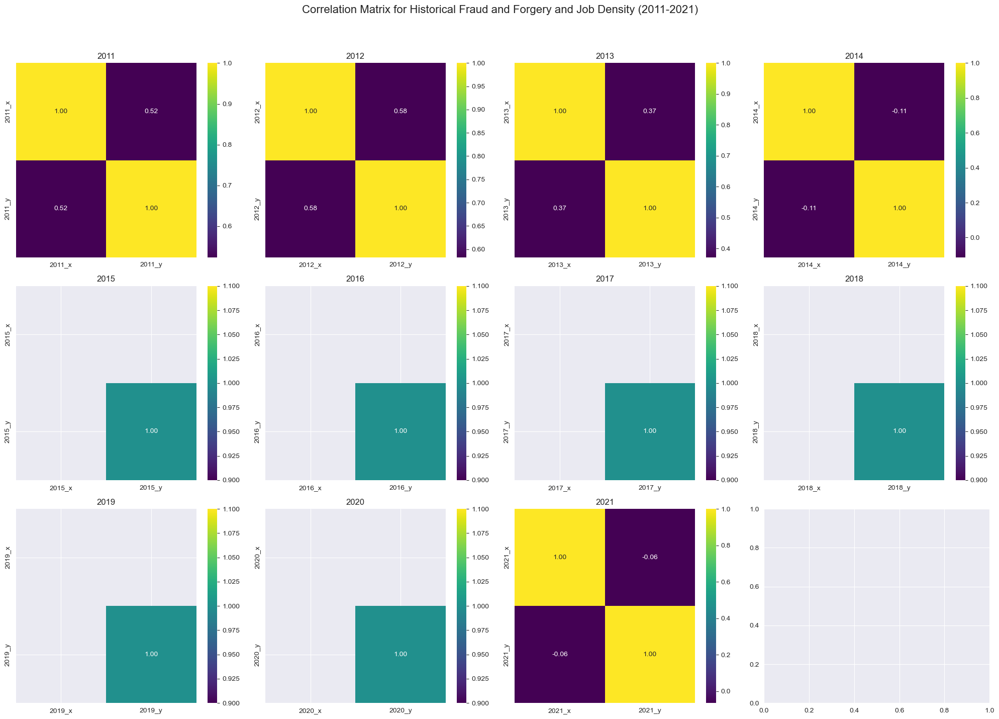

In [101]:
major_crime_category = 'Historical Fraud and Forgery'
plot_correlation_matrix_grid(job_density_crime_data, major_crime_category)

The correlation matrix indicates positive correlation in some years and negative correlation in other years. There is very little data on this crime so the relationship can not be accurately determined.

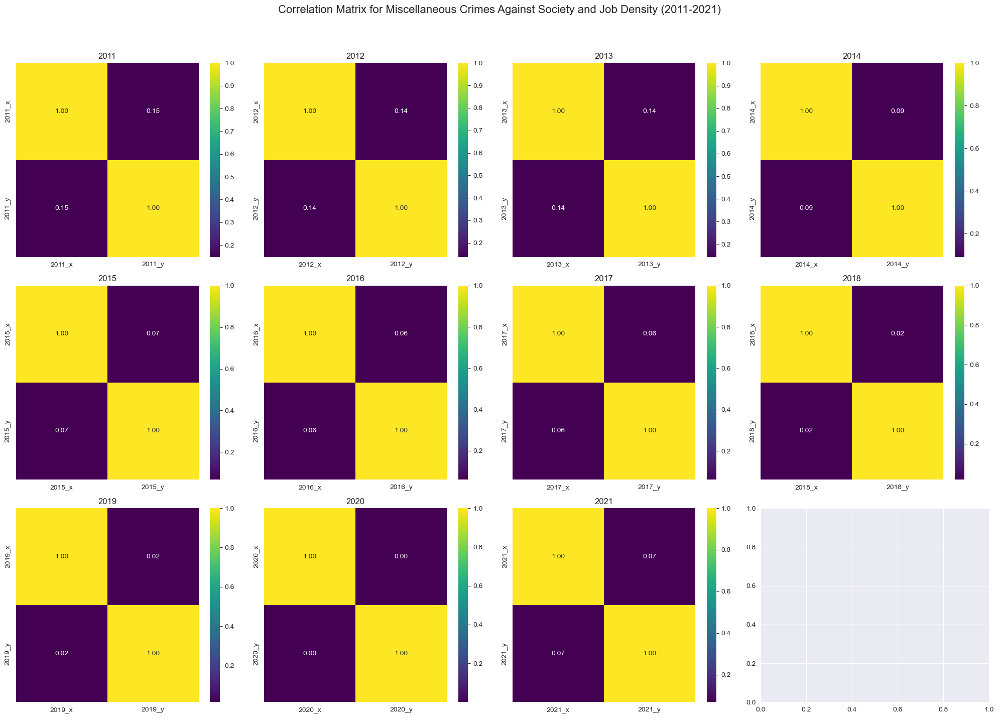

In [102]:
major_crime_category = 'Miscellaneous Crimes Against Society'
plot_correlation_matrix_grid(job_density_crime_data, major_crime_category)

The matrix show coefficients between 0 and 0.15, indicating very weak positive relationship between Miscellaneous Crimes Against Society and job density.

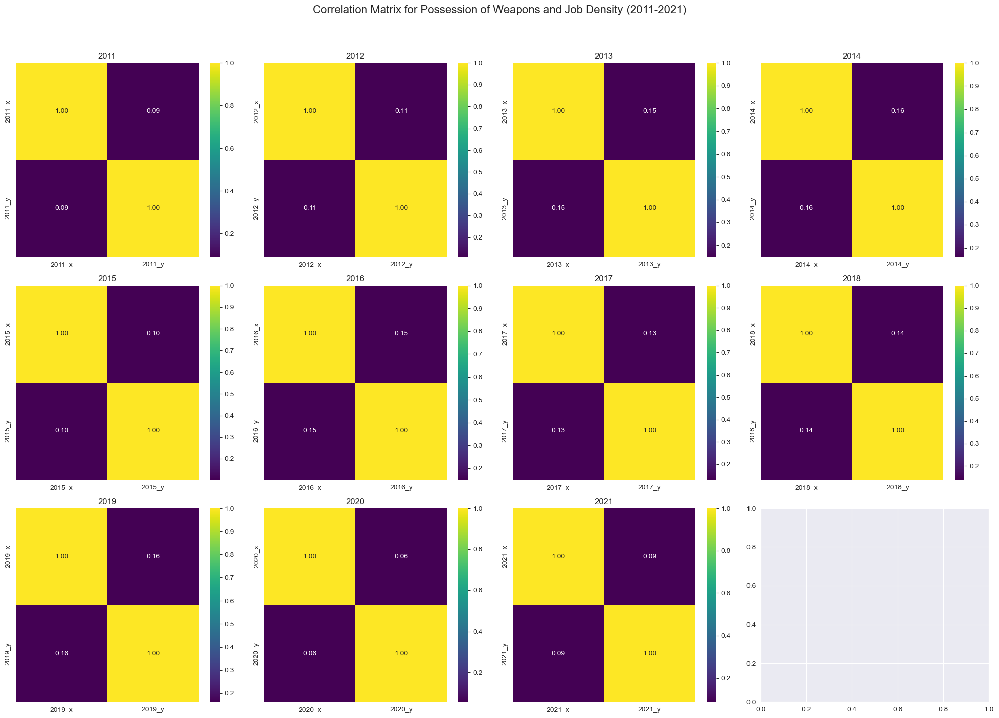

In [103]:
major_crime_category = 'Possession of Weapons'
plot_correlation_matrix_grid(job_density_crime_data, major_crime_category)

The correlation matrix for job density and possession of weapons in London boroughs suggests a weak positive correlation between the two factors with coefficients between 0.06 and 0.16.

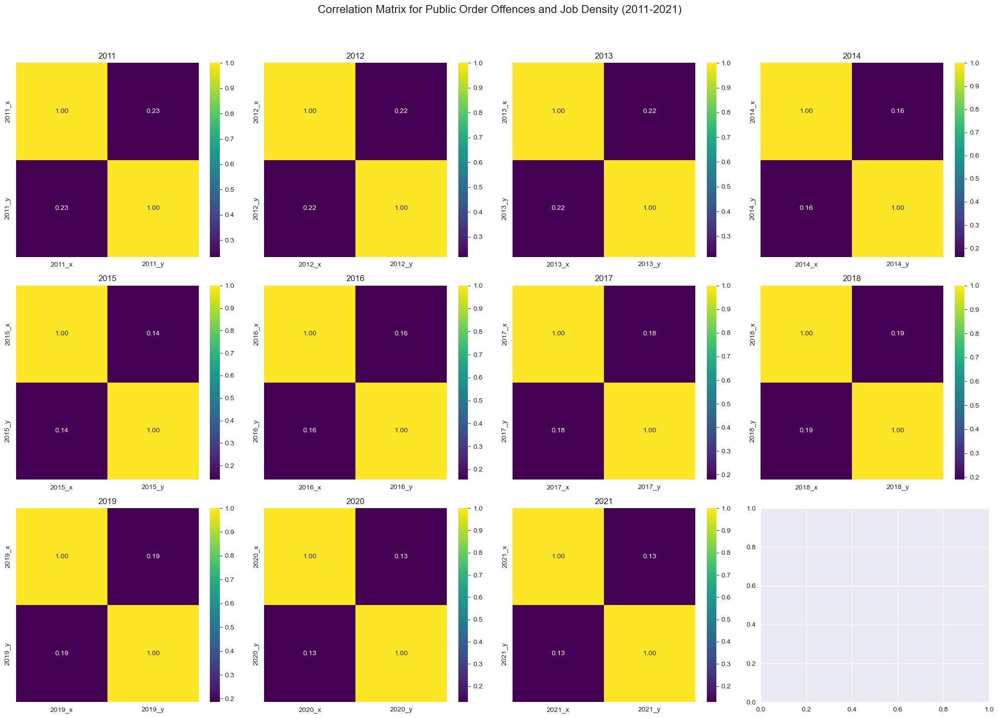

In [104]:
major_crime_category = 'Public Order Offences'
plot_correlation_matrix_grid(job_density_crime_data, major_crime_category)

The correlation matrix for job density and Public Order Offences in London boroughs suggests a weak positive correlation between the two factors with coefficients between 0.13 and 0.23.  This means that there is a tendency for Public Order Offences to increase as job density increases.

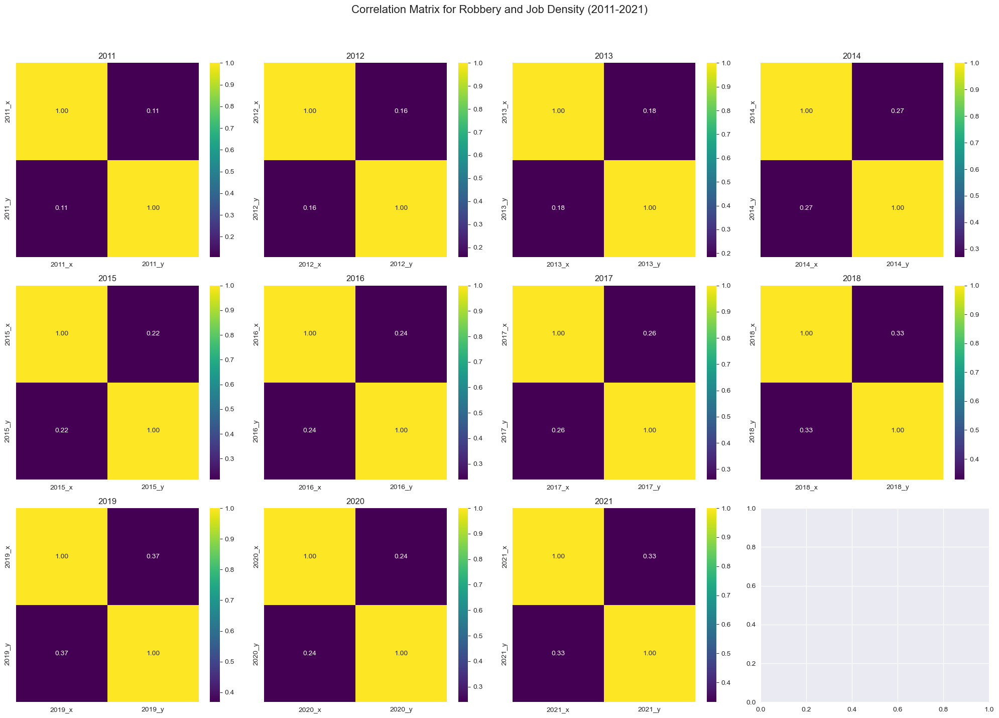

In [105]:
major_crime_category = 'Robbery'
plot_correlation_matrix_grid(job_density_crime_data, major_crime_category)

The correlation matrix for job density and Robbery in London boroughs suggests a weak positive correlation between the two factors with coefficients between 0.11 and 0.37.  This means that there is a tendency for robbery to increase as job density increases.

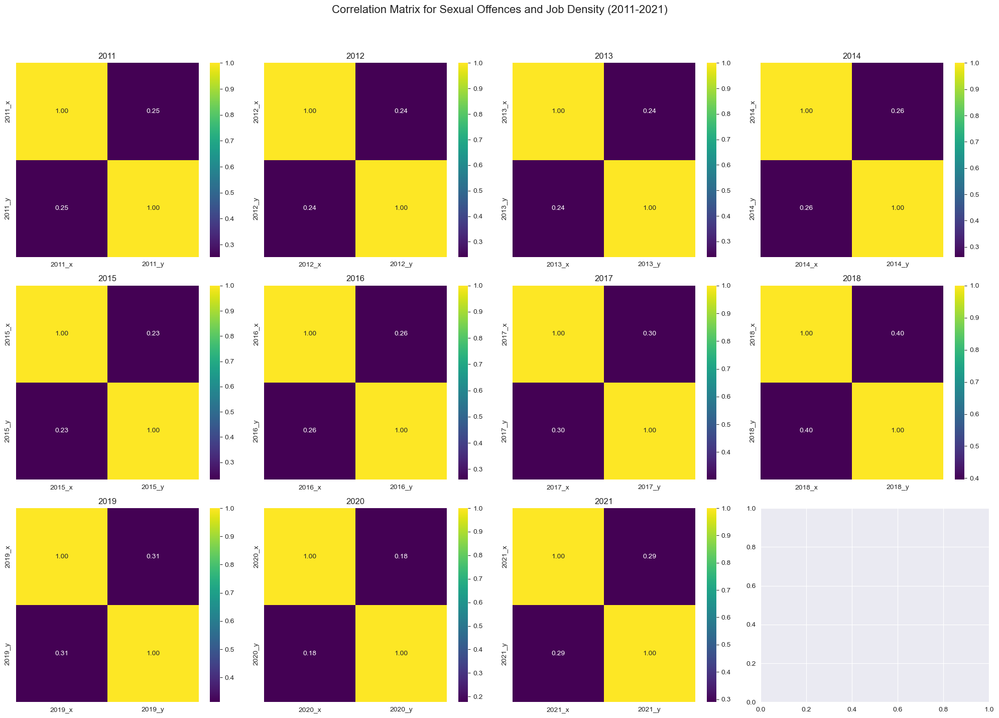

In [106]:
major_crime_category = 'Sexual Offences'
plot_correlation_matrix_grid(job_density_crime_data, major_crime_category)

The correlation matrix for job density and Sexual Offences in London boroughs suggests a positive correlation between the two factors with coefficients between 0.18 and 0.4. This means that there is a tendency for Sexual Offences to increase as job density increases.

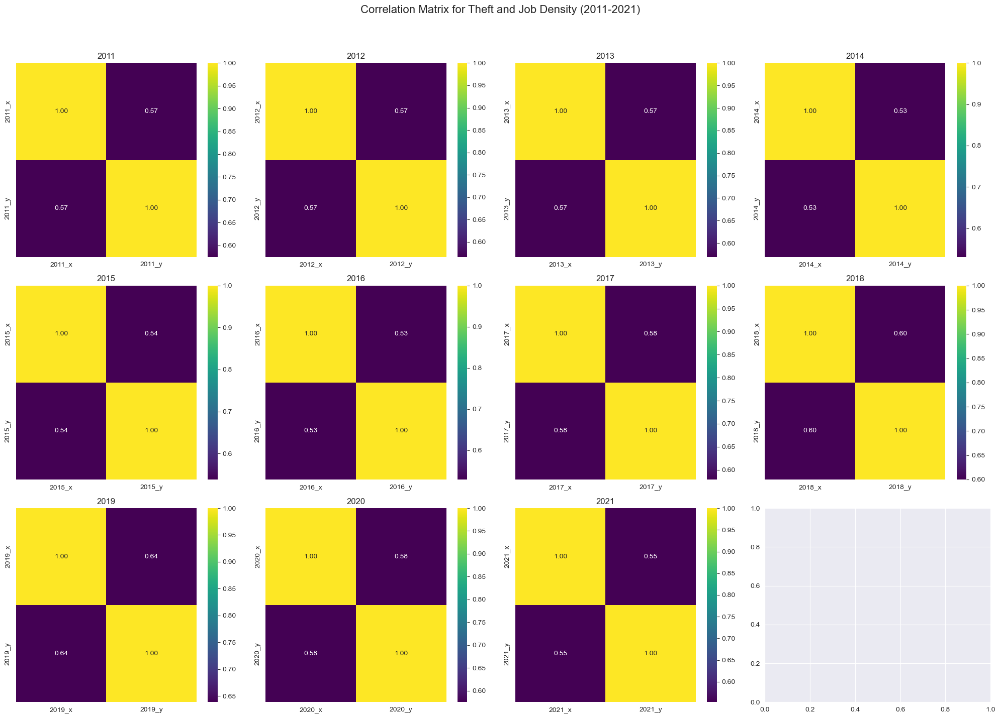

In [107]:
major_crime_category = 'Theft'
plot_correlation_matrix_grid(job_density_crime_data, major_crime_category)

The correlation matrix for job density and Theft in London boroughs suggests a strong positive correlation between the two factors with coefficients between 0.53 and 0.64. This means that there is a tendency for theft to increase as job density increases.

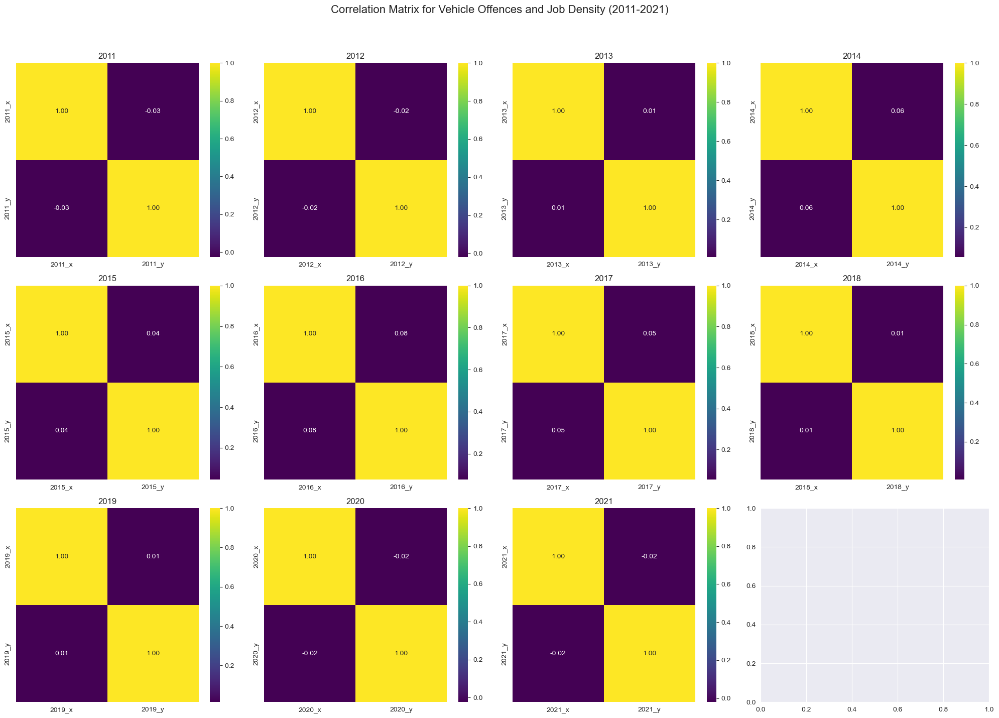

In [108]:
major_crime_category = 'Vehicle Offences'
plot_correlation_matrix_grid(job_density_crime_data, major_crime_category)

The correlation matrix for job density and Vehicle Offences in London boroughs indicates a weak negative relationship in some years and a weak positive relationship in other years. This means there is little or no relationship between the two factors.

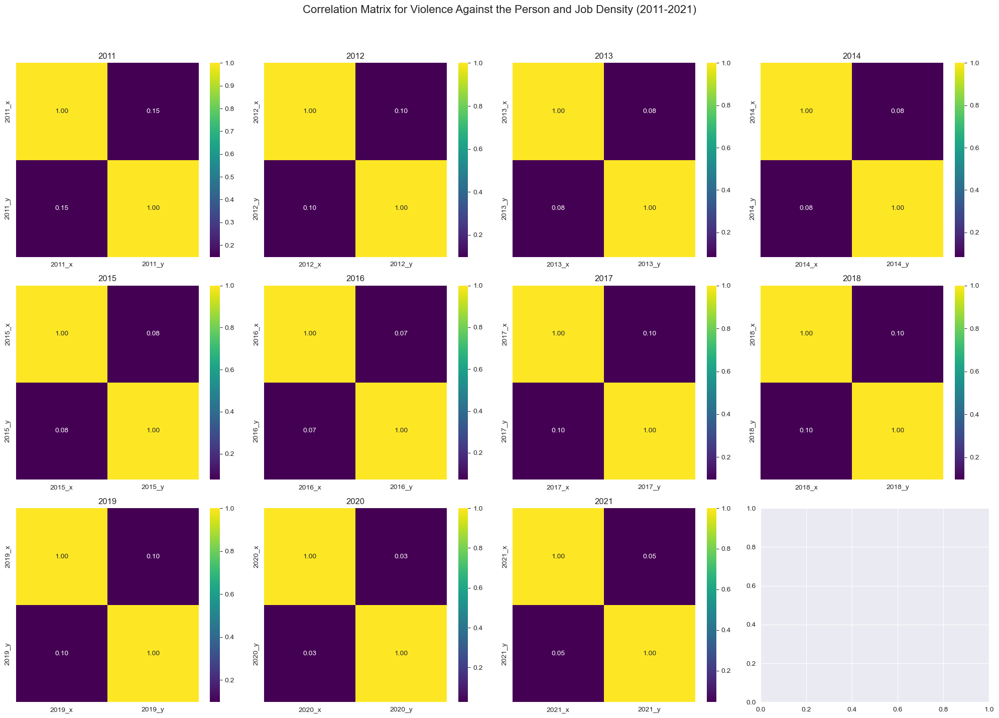

In [109]:
major_crime_category = 'Violence Against the Person'
plot_correlation_matrix_grid(job_density_crime_data, major_crime_category)

The correlation matrix for job density and Violence Against the Person in London boroughs suggests a weak positive correlation between the two factors with coefficients between 0.03 and 0.15. 

## Pearson Correlation Test

The next step in the research is to conduct a Pearson correlation test in order to examine the linear relationship between job density and overall crime rate.

### Null Hypothesis

There is no statistically significant relationship between job density and overall crime rates across London boroughs.

### Alternative Hypothesis

There is a statistically significant relationship between job density and overall crime rates across London boroughs

In [110]:
job_density_y = job_density_crime_data[['2011_y', '2012_y', '2013_y', '2014_y', '2015_y', '2016_y', '2017_y', '2018_y', '2019_y', '2020_y', '2021_y']].mean(axis=1)
overall_crime_rate = job_density_crime_data[['2011_x', '2012_x', '2013_x', '2014_x', '2015_x', '2016_x', '2017_x', '2018_x', '2019_x', '2020_x', '2021_x']].mean(axis=1)

# Calculate the Pearson correlation coefficient and p-value
correlation_coefficient, p_value = pearsonr(job_density_y, overall_crime_rate)

# Print the results
print(f"Pearson Correlation Coefficient: {correlation_coefficient}")
print(f"P-value: {p_value}")

if p_value < 0.05:
    print("Reject the null hypothesis.")
else:
    print("Fail to reject the null hypothesis.")


Pearson Correlation Coefficient: 0.11936564014853854
P-value: 9.06916181584802e-07
Reject the null hypothesis.


### Interpretation of Result

The Pearson correlation coefficient between job density and overall crime rates across boroughs is 0.1194. 

The p-value is 9.069e-7 which is less than 0.05, indicating that there is enough evidence to reject the null hypothesis.










### Scatter Plot of Job Density and Crime

We will plot a scatter plot for all the years to further visualize the relationship between job density and the major crime categories.

In [111]:
# create a subset of data for the scatter plot
job_density_crimes_subset = job_density_crime_data[['Major Category', '2011_x', '2012_x', '2013_x', '2014_x', '2015_x', '2016_x', '2017_x', '2018_x', '2019_x', '2020_x', '2021_x', '2011_y', '2012_y', '2013_y', '2014_y', '2015_y', '2016_y', '2017_y', '2018_y', '2019_y', '2020_y', '2021_y']]


In [112]:
# Define the function to display the relationship between job desity and crime from 2011 to 2021
def scatter_plots_grid(job_density_crimes_subset):
    
    # Define the columns for years
    years_columns = ['2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021']

    # Create subplots in a grid
    fig, axes = plt.subplots(3, 4, figsize=(20, 15))
    fig.suptitle('Scatter Plots for Job Density vs Crime Rates (2011-2021)', fontsize=16)

    # Flatten the 2D array of subplots to make indexing easier
    axes = axes.flatten()

    # Iterate over each year
    for i, year in enumerate(years_columns):
        ax = axes[i]

        # Iterate over major crime categories
        for crime_category in job_density_crimes_subset['Major Category'].unique():
            crime_category_data = job_density_crimes_subset[job_density_crimes_subset['Major Category'] == crime_category]

            # Scatter plot for job density and crime rates for the current year
            ax.scatter(crime_category_data[f'{year}_y'], crime_category_data[f'{year}_x'], label=crime_category, alpha=0.7)

        ax.set_title(f'Scatter Plot for Job Density vs Crime Rates in {year}')
        ax.set_xlabel('Job Density')
        ax.set_ylabel('Crime Rate')
        ax.legend()

    # Adjust layout for better spacing
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])

    # Show the plot
    plt.show()


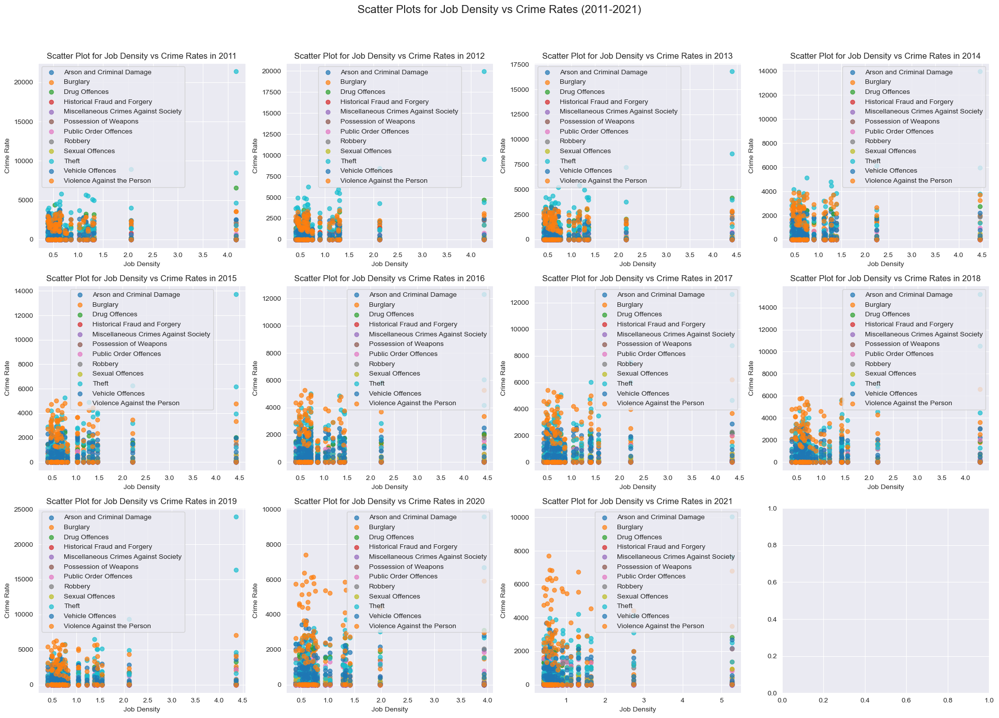

In [113]:
scatter_plots_grid(job_density_crimes_subset)

The scatter plots above indicates a weak positive correlation between major crime rates and job density. This means that as job density rises, so does the rate of major crimes. However, the relationship is not strong.

The data points are clustered in the plot's lower left corner, indicating low job density and major crime rates. This suggests that many London boroughs have both low job density and low crime rates.

### Linear Regrression

Next, we conduct linear regression analysis for each year in a dataset containing job density and crime count data to further investigate the relationship between the two variables.

In [114]:
def perform_regression(year, job_density_crime_data):
    
    # Extract the independent variable (job density) and dependent variable (crime count) for the specified year
    X = job_density_crime_data[f'{year}_y'] 
    y = job_density_crime_data[f'{year}_x']

    # Add a constant term to the independent variable
    X = sm.add_constant(X)

    # Fit the regression model
    model = sm.OLS(y, X).fit()

    # Store the regression results in a DataFrame
    results_df = pd.DataFrame({
        'Year': [year],
        'Intercept': [model.params['const']],
        'Job_Density_Coefficient': [model.params[f'{year}_y']],
        'R-squared': [model.rsquared],
        'P-value': [model.pvalues[f'{year}_y']]
    })

    return results_df

# Create an empty DataFrame to store the results
regression_results = pd.DataFrame()

# Iterate over the years and perform regression analysis for each year
years = ['2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021']

for year in years:
    result = perform_regression(year, job_density_crime_data)
    regression_results = pd.concat([regression_results, result], ignore_index=True)

# Display the table of regression results
print("Regression Results Table:")
print(regression_results)

Regression Results Table:
    Year   Intercept  Job_Density_Coefficient  R-squared       P-value
0   2011  312.022110               199.274600   0.017486  5.189095e-08
1   2012  305.428313               186.410878   0.017153  6.958243e-08
2   2013  283.156055               156.356091   0.015879  2.143086e-07
3   2014  297.763493               130.343642   0.012774  3.350018e-06
4   2015  317.606509               128.127861   0.010997  1.627265e-05
5   2016  335.112441               125.319595   0.010315  2.989897e-05
6   2017  338.129673               157.822816   0.013455  1.830567e-06
7   2018  333.953961               175.650507   0.014858  5.286654e-07
8   2019  310.216646               251.526724   0.021635  1.338697e-09
9   2020  364.632437               117.413752   0.006467  9.601078e-04
10  2021  381.147276                93.046830   0.007149  5.161397e-04


### Interpretation of Result

Since these all are positive values, hence it depicts a positive relationship between job density and crime rates. All the values of the coefficient in the table from 93.04 to 251.52 are quite small thereby suggesting a weak positive relationship that is increased job density coincides with a slight increase in crime rates.

The R-squared values vary over the years. Some years, like 2011, 2012 and 2019, have slightly higher R-squared values, indicating a stronger relationship between job density and crime.

Then all p-values are less than 0.05 meaning statistically strong associations across the years. However, it is essential to keep in mind that statistically strong results do not depict causation.

The correlation coefficient's weakness suggests that factors other than job density likely have more impact on the overall crime rate in London's boroughs.

# Spatial Analysis

We start the spatial analysis by loading the geospatial data.

In [4]:
LondonMap = gpd.read_file('London_Borough_Excluding_MHW.shp')
LondonMap

DriverError: London_Borough_Excluding_MHW.shp: No such file or directory

Next we rename the column for the borough names to match our previous datasets.

In [116]:
LondonMap = LondonMap.rename(columns={'NAME': 'Borough'})
LondonMap.head()

,Borough,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry
0,Kingston upon Thames,E09000021,3726.117,0.000,F,None,None,"POLYGON ((516401.600 160201.800, 516407.300 16..."
1,Croydon,E09000008,8649.441,0.000,F,None,None,"POLYGON ((535009.200 159504.700, 535005.500 15..."
2,Bromley,E09000006,15013.487,0.000,F,None,None,"POLYGON ((540373.600 157530.400, 540361.200 15..."
3,Hounslow,E09000018,5658.541,60.755,F,None,None,"POLYGON ((521975.800 178100.000, 521967.700 17..."
4,Ealing,E09000009,5554.428,0.000,F,None,None,"POLYGON ((510253.500 182881.600, 510249.900 18..."


We now go ahead to view thw map of London.

<Axes: >

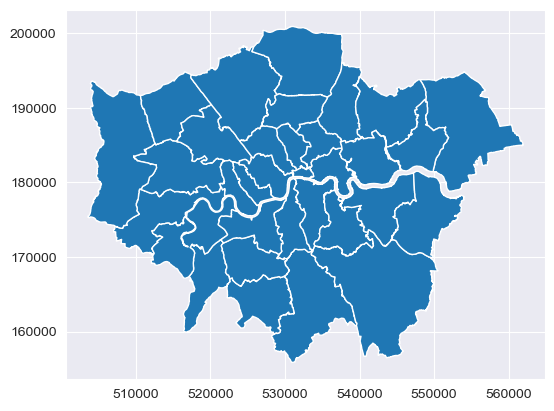

In [117]:
LondonMap.plot()

Next we load the latitude and longitude data.

In [118]:
location = pd.read_excel("Latitude_Longitude.xlsx")
location.head()

,Height restriction (m),Height restriction (imperial),Easting,Northing,Grid Reference,Lat,Lng,Borough,Road name,Road number,TLRN [Red route]?,Comments
0,Between 4.6 and 5.1,"Between 15'0"" and 16'6""",549062,183214,TQ4906283214,51.528168,0.147455,Barking & Dagenham,Chequers Lane,,No,NaN
1,Between 4.6 and 5.1,"Between 15'0"" and 16'6""",528611,184683,TQ2861184683,51.546393,-0.146647,Camden,Prince Of Wales Road,,No,NaN
2,Between 4.6 and 5.1,"Between 15'0"" and 16'6""",515399,183904,TQ1539983904,51.542246,-0.337346,Ealing,Green Park Way,,No,NaN
3,Between 4.6 and 5.1,"Between 15'0"" and 16'6""",515422,183895,TQ1542283895,51.542160,-0.337018,Ealing,Green Park Way,,No,NaN
4,Between 4.6 and 5.1,"Between 15'0"" and 16'6""",520659,180322,TQ2065980322,51.508954,-0.262760,Ealing,Churchfield Road,,No,NaN


Create a subset of the dataset for the needed variables.

In [119]:
location = location[['Easting', 'Northing', 'Lat', 'Lng','Borough']]
location.head()

,Easting,Northing,Lat,Lng,Borough
0,549062,183214,51.528168,0.147455,Barking & Dagenham
1,528611,184683,51.546393,-0.146647,Camden
2,515399,183904,51.542246,-0.337346,Ealing
3,515422,183895,51.542160,-0.337018,Ealing
4,520659,180322,51.508954,-0.262760,Ealing


Rename the columns for better understanding.

In [120]:
location = location.rename(columns={'Easting': 'X', 'Northing': 'Y', 'Lat': 'Latitude', 'Lng': 'Longitude'})
location.head()

,X,Y,Latitude,Longitude,Borough
0,549062,183214,51.528168,0.147455,Barking & Dagenham
1,528611,184683,51.546393,-0.146647,Camden
2,515399,183904,51.542246,-0.337346,Ealing
3,515422,183895,51.542160,-0.337018,Ealing
4,520659,180322,51.508954,-0.262760,Ealing


Create a GeoDataFrame using GeoPandas library. This GeoDataFrame is designed to store spatial data related to the locations of boroughs.

In [1]:
boroughloc = gpd.GeoDataFrame(location, geometry=gpd.points_from_xy(location['X'], location['Y'])) 
boroughloc

NameError: name 'gpd' is not defined

View the plot.

<Axes: >

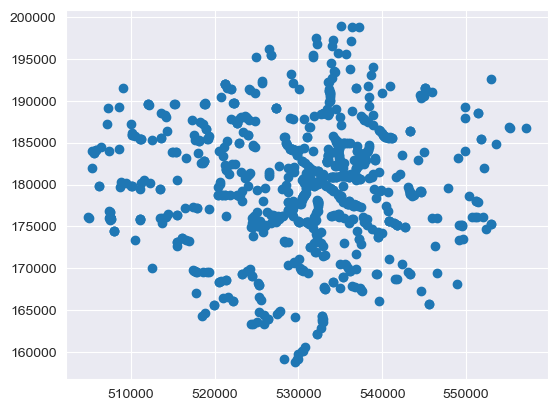

In [122]:
boroughloc.plot()

Check the crs of the data.

In [123]:
LondonMap.crs

<Projected CRS: PROJCS["OSGB36 / British National Grid",GEOGCS["OS ...>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- [east]: Easting (metre)
- [north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: unnamed
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

Set the crs for the boroughloc using the .set_crs command.

In [124]:
boroughloc = boroughloc.set_crs(LondonMap.crs, inplace = True)

Create a column for the area of each borough.

In [125]:
LondonMap['Area'] = LondonMap.area
LondonMap.head()

,Borough,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry,Area
0,Kingston upon Thames,E09000021,3726.117,0.000,F,None,None,"POLYGON ((516401.600 160201.800, 516407.300 16...",3.726118e+07
1,Croydon,E09000008,8649.441,0.000,F,None,None,"POLYGON ((535009.200 159504.700, 535005.500 15...",8.649444e+07
2,Bromley,E09000006,15013.487,0.000,F,None,None,"POLYGON ((540373.600 157530.400, 540361.200 15...",1.501349e+08
3,Hounslow,E09000018,5658.541,60.755,F,None,None,"POLYGON ((521975.800 178100.000, 521967.700 17...",5.592623e+07
4,Ealing,E09000009,5554.428,0.000,F,None,None,"POLYGON ((510253.500 182881.600, 510249.900 18...",5.554435e+07


In [126]:
LondonMap.tail()

,Borough,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry,Area
28,Hackney,E09000012,1904.902,0.000,T,None,None,"POLYGON ((531928.400 187801.500, 531935.700 18...",1.904903e+07
29,Haringey,E09000014,2959.837,0.000,T,None,None,"POLYGON ((531928.400 187801.500, 531919.200 18...",2.959839e+07
30,Newham,E09000025,3857.806,237.637,T,None,None,"MULTIPOLYGON (((544065.000 183254.100, 544062....",3.620173e+07
31,Barking and Dagenham,E09000002,3779.934,169.150,F,None,None,"MULTIPOLYGON (((543905.400 183199.100, 543905....",3.610781e+07
32,City of London,E09000001,314.942,24.546,T,None,None,"POLYGON ((531145.100 180782.100, 531143.800 18...",2.903926e+06


Notice that City of London is not part of the borough, we will go ahead and delete it.

In [127]:
boroughs_to_delete = ['City of London']

# Filter out rows that belong to the specified boroughs
LondonMap = LondonMap[~LondonMap['Borough'].isin(boroughs_to_delete)]
LondonMap

,Borough,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry,Area
0,Kingston upon Thames,E09000021,3726.117,0.000,F,None,None,"POLYGON ((516401.600 160201.800, 516407.300 16...",3.726118e+07
1,Croydon,E09000008,8649.441,0.000,F,None,None,"POLYGON ((535009.200 159504.700, 535005.500 15...",8.649444e+07
2,Bromley,E09000006,15013.487,0.000,F,None,None,"POLYGON ((540373.600 157530.400, 540361.200 15...",1.501349e+08
3,Hounslow,E09000018,5658.541,60.755,F,None,None,"POLYGON ((521975.800 178100.000, 521967.700 17...",5.592623e+07
4,Ealing,E09000009,5554.428,0.000,F,None,None,"POLYGON ((510253.500 182881.600, 510249.900 18...",5.554435e+07
5,Havering,E09000016,11445.735,210.763,F,None,None,"POLYGON ((549893.900 181459.800, 549894.600 18...",1.123497e+08
6,Hillingdon,E09000017,11570.063,0.000,F,None,None,"POLYGON ((510599.800 191689.500, 510615.200 19...",1.157005e+08
7,Harrow,E09000015,5046.330,0.000,F,None,None,"POLYGON ((510599.800 191689.500, 510660.000 19...",5.046330e+07
8,Brent,E09000005,4323.270,0.000,F,None,None,"POLYGON ((525201.000 182512.600, 525181.500 18...",4.323264e+07
9,Barnet,E09000003,8674.837,0.000,F,None,None,"POLYGON ((524579.900 198355.200, 524594.300 19...",8.674831e+07


Join the Map dataset with the job density and crime dataset.

In [128]:
LondonMap2 = LondonMap.join(job_density_crime_data.set_index('Borough'), on = 'Borough') #join the datasets
LondonMap2.head()

,Borough,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry,Area,index,...,2012_y,2013_y,2014_y,2015_y,2016_y,2017_y,2018_y,2019_y,2020_y,2021_y
0,Kingston upon Thames,E09000021,3726.117,0.0,F,None,None,"POLYGON ((516401.600 160201.800, 516407.300 16...",37261177.97,998,...,0.73,0.72,0.73,0.82,0.86,0.86,0.83,0.78,0.76,0.8
0,Kingston upon Thames,E09000021,3726.117,0.0,F,None,None,"POLYGON ((516401.600 160201.800, 516407.300 16...",37261177.97,999,...,0.73,0.72,0.73,0.82,0.86,0.86,0.83,0.78,0.76,0.8
0,Kingston upon Thames,E09000021,3726.117,0.0,F,None,None,"POLYGON ((516401.600 160201.800, 516407.300 16...",37261177.97,1000,...,0.73,0.72,0.73,0.82,0.86,0.86,0.83,0.78,0.76,0.8
0,Kingston upon Thames,E09000021,3726.117,0.0,F,None,None,"POLYGON ((516401.600 160201.800, 516407.300 16...",37261177.97,1001,...,0.73,0.72,0.73,0.82,0.86,0.86,0.83,0.78,0.76,0.8
0,Kingston upon Thames,E09000021,3726.117,0.0,F,None,None,"POLYGON ((516401.600 160201.800, 516407.300 16...",37261177.97,1002,...,0.73,0.72,0.73,0.82,0.86,0.86,0.83,0.78,0.76,0.8


We can now plot the maps to visualize both job density and major crime categories for all years across all the London boroughs.

In [129]:
# Define the function to display maps of crime distribution in London boroughs
def crime_distribution_maps(data, major_category, years):
    
    # Create a GeoDataFrame using GeoPandas
    gdf = gpd.GeoDataFrame(data, geometry='geometry')

    # Create subplots with colorbars
    fig, axes = plt.subplots(3, 4, figsize=(12, 8))
    fig.suptitle(f'Spatial Distribution of {major_category} in London Boroughs (2011-2021)', fontsize=16)

    # Add colorbar
    divider = make_axes_locatable(axes[2, 3])
    cax = divider.append_axes("right", size="5%", pad=0.1)

    for i, year in enumerate(years):
        row, col = divmod(i, 4)
        ax = axes[row, col]

        # Plot the specified major crime category for each year
        gdf[gdf['Major Category'] == major_category].plot(column=year, cmap='YlGnBu', linewidth=0.8, ax=ax, legend=True, cax=cax)

        ax.set_title(f'{year} {major_category}')
        ax.set_axis_off()

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


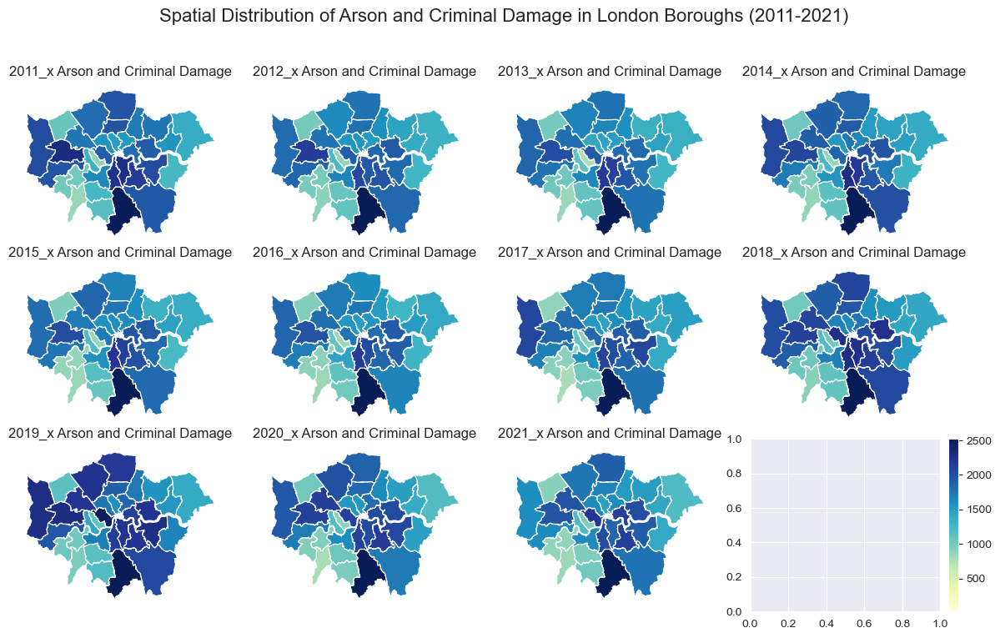

In [130]:
crime_distribution_maps(LondonMap2, 'Arson and Criminal Damage', ['2011_x', '2012_x', '2013_x', '2014_x', '2015_x', '2016_x', '2017_x', '2018_x', '2019_x', '2020_x', '2021_x'])

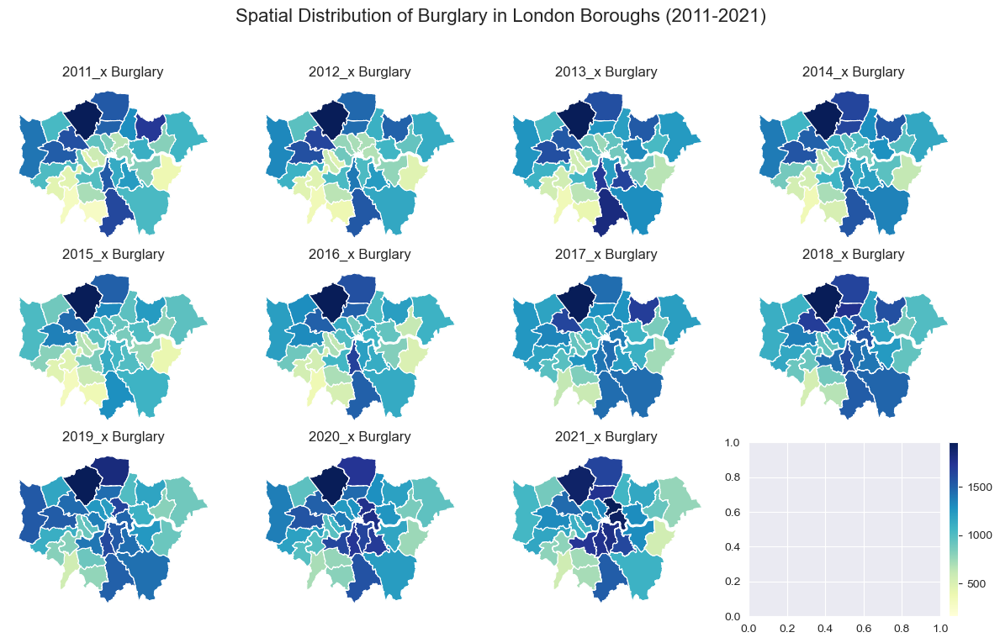

In [131]:
crime_distribution_maps(LondonMap2, 'Burglary', ['2011_x', '2012_x', '2013_x', '2014_x', '2015_x', '2016_x', '2017_x', '2018_x', '2019_x', '2020_x', '2021_x'])

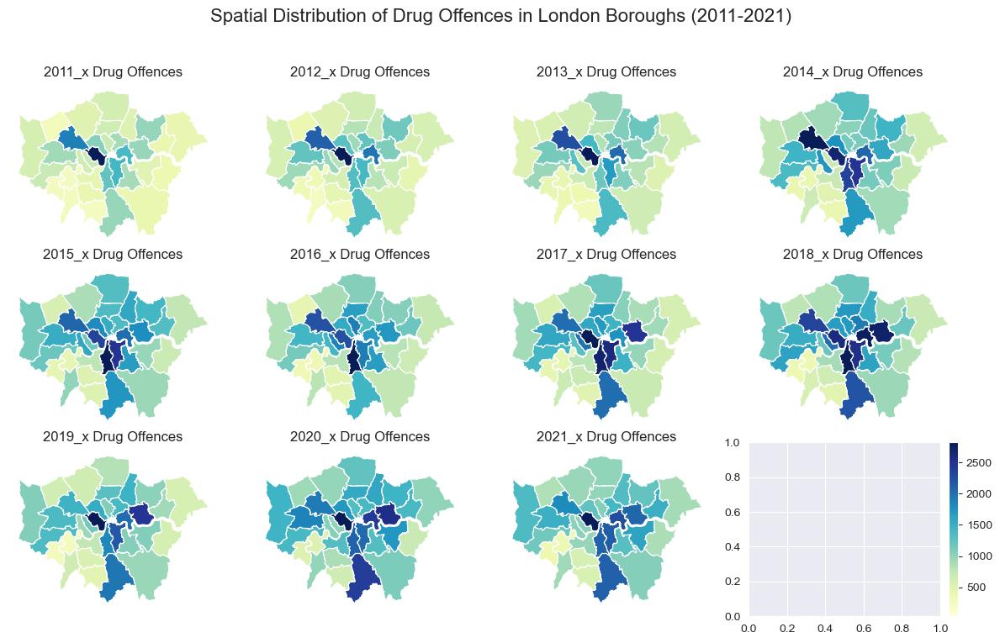

In [132]:
crime_distribution_maps(LondonMap2, 'Drug Offences', ['2011_x', '2012_x', '2013_x', '2014_x', '2015_x', '2016_x', '2017_x', '2018_x', '2019_x', '2020_x', '2021_x'])

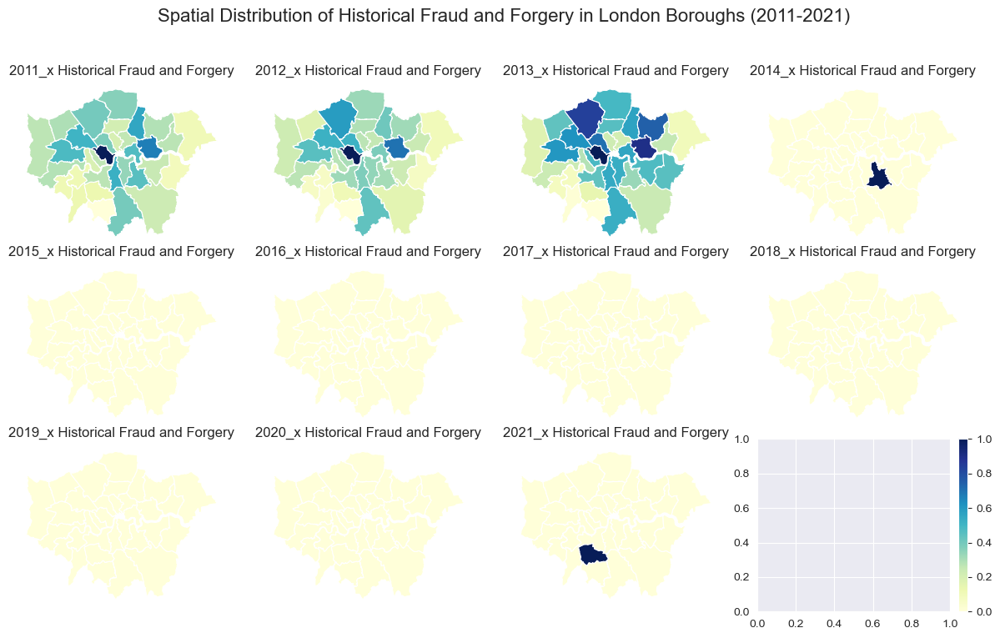

In [133]:
crime_distribution_maps(LondonMap2, 'Historical Fraud and Forgery', ['2011_x', '2012_x', '2013_x', '2014_x', '2015_x', '2016_x', '2017_x', '2018_x', '2019_x', '2020_x', '2021_x'])

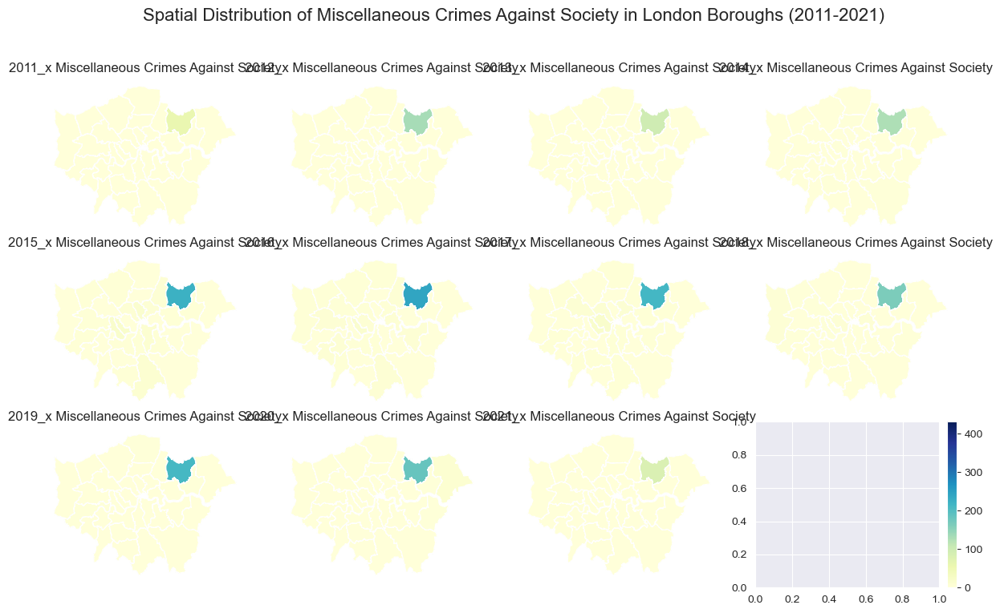

In [134]:
crime_distribution_maps(LondonMap2, 'Miscellaneous Crimes Against Society', ['2011_x', '2012_x', '2013_x', '2014_x', '2015_x', '2016_x', '2017_x', '2018_x', '2019_x', '2020_x', '2021_x'])

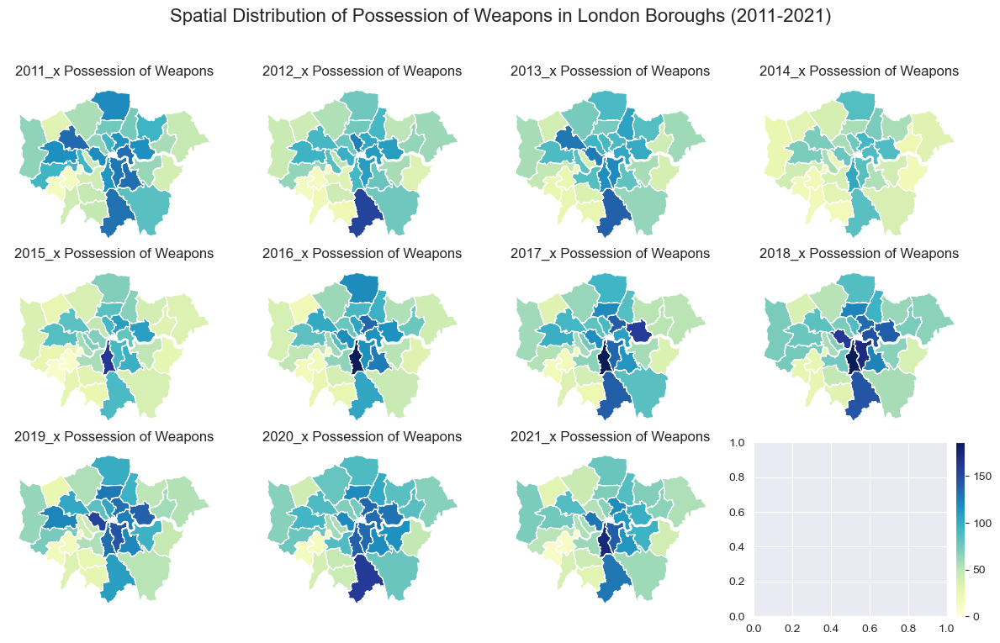

In [135]:
crime_distribution_maps(LondonMap2, 'Possession of Weapons', ['2011_x', '2012_x', '2013_x', '2014_x', '2015_x', '2016_x', '2017_x', '2018_x', '2019_x', '2020_x', '2021_x'])

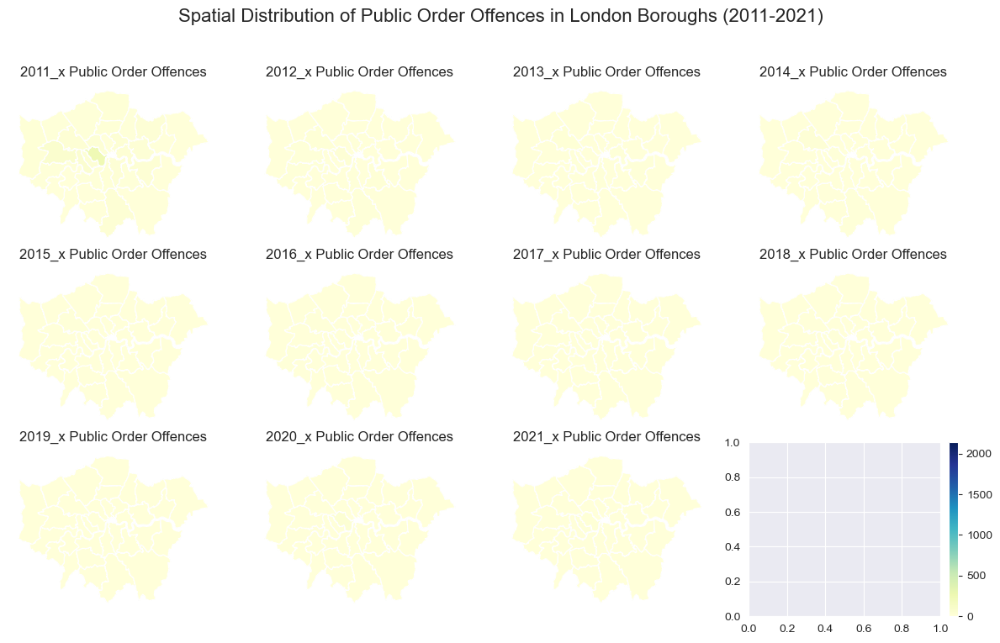

In [136]:
crime_distribution_maps(LondonMap2, 'Public Order Offences', ['2011_x', '2012_x', '2013_x', '2014_x', '2015_x', '2016_x', '2017_x', '2018_x', '2019_x', '2020_x', '2021_x'])

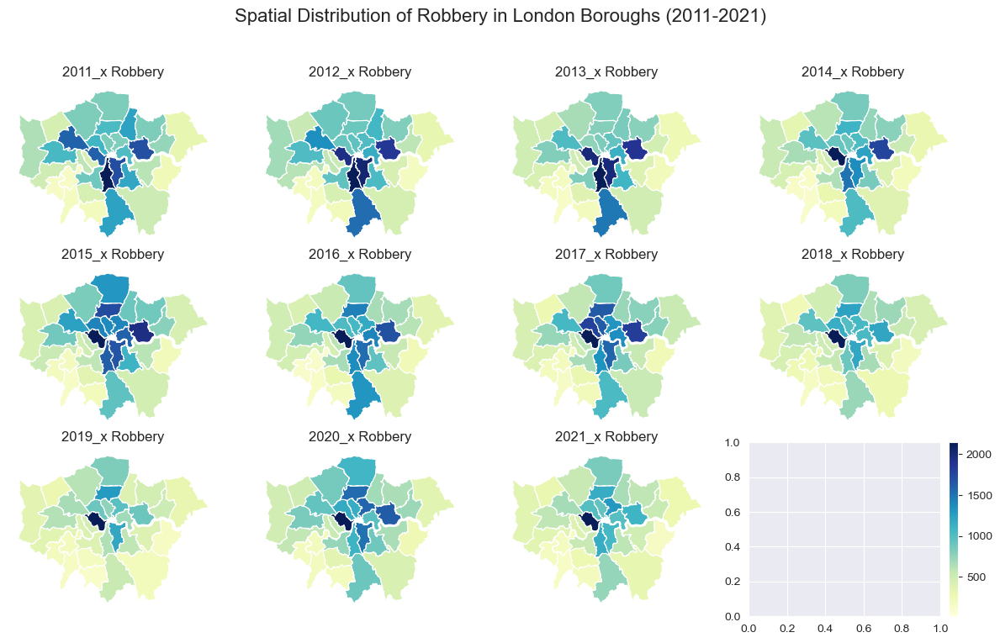

In [137]:
crime_distribution_maps(LondonMap2, 'Robbery', ['2011_x', '2012_x', '2013_x', '2014_x', '2015_x', '2016_x', '2017_x', '2018_x', '2019_x', '2020_x', '2021_x'])

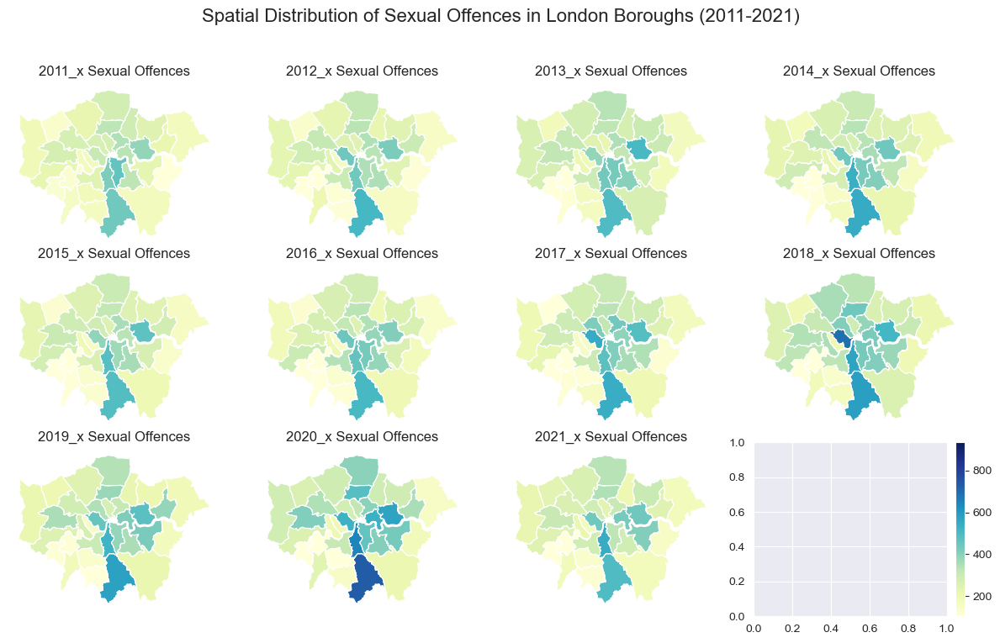

In [138]:
crime_distribution_maps(LondonMap2, 'Sexual Offences', ['2011_x', '2012_x', '2013_x', '2014_x', '2015_x', '2016_x', '2017_x', '2018_x', '2019_x', '2020_x', '2021_x'])

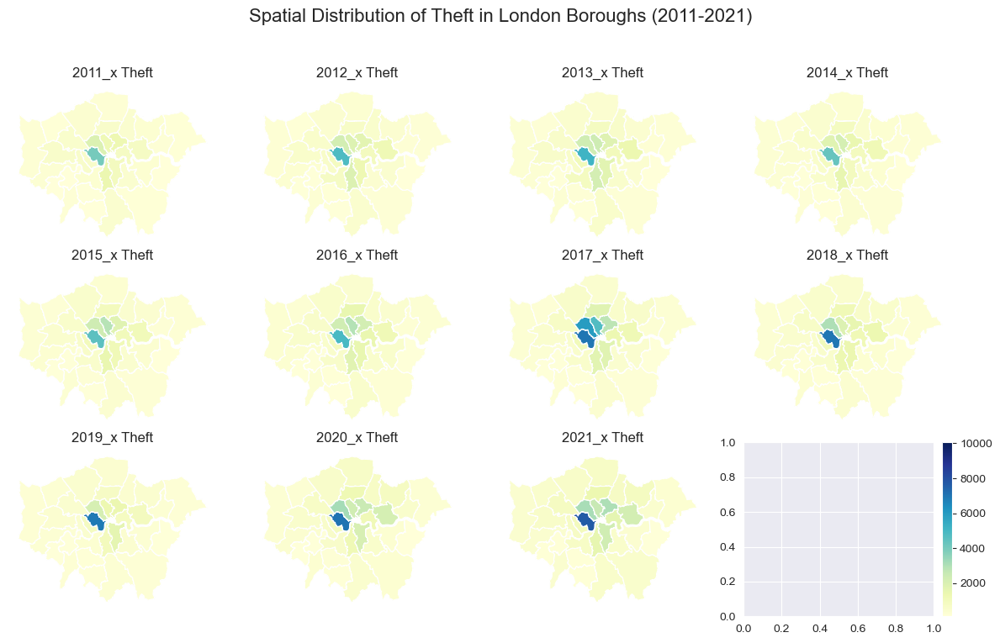

In [139]:
crime_distribution_maps(LondonMap2, 'Theft', ['2011_x', '2012_x', '2013_x', '2014_x', '2015_x', '2016_x', '2017_x', '2018_x', '2019_x', '2020_x', '2021_x'])

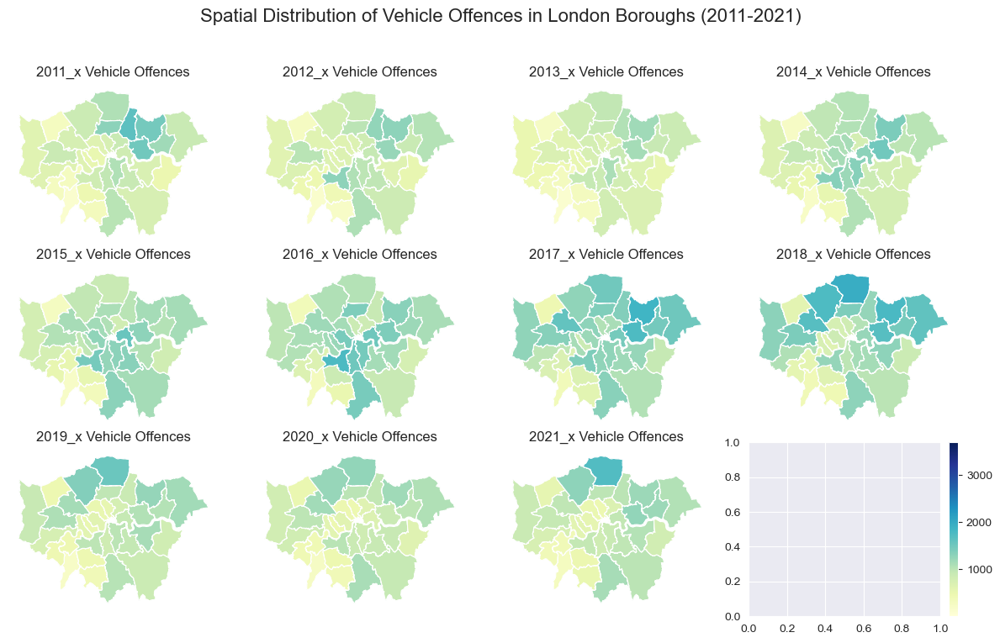

In [140]:
crime_distribution_maps(LondonMap2, 'Vehicle Offences', ['2011_x', '2012_x', '2013_x', '2014_x', '2015_x', '2016_x', '2017_x', '2018_x', '2019_x', '2020_x', '2021_x'])

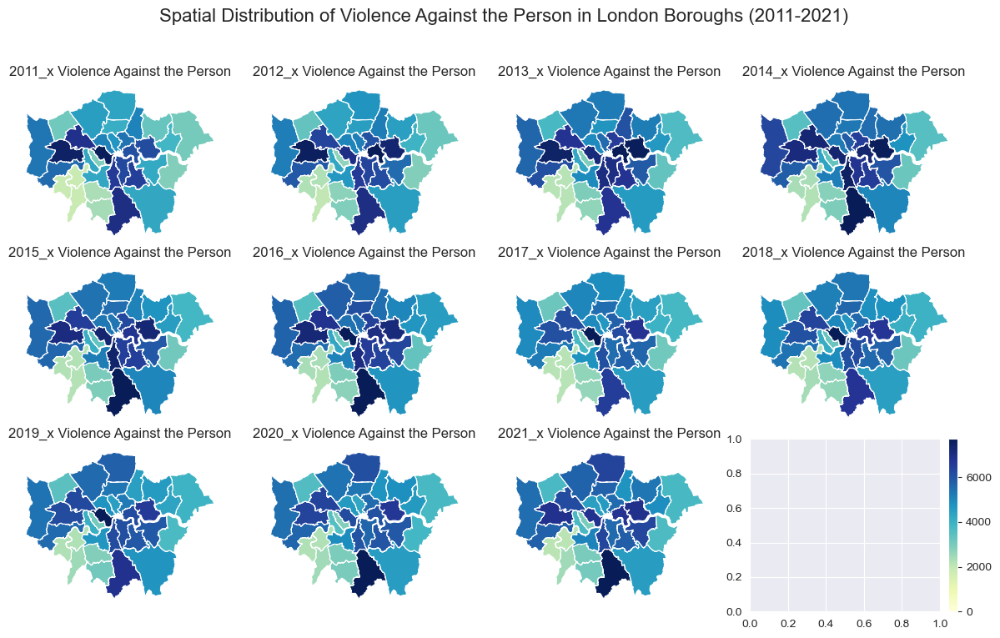

In [141]:
crime_distribution_maps(LondonMap2, 'Violence Against the Person', ['2011_x', '2012_x', '2013_x', '2014_x', '2015_x', '2016_x', '2017_x', '2018_x', '2019_x', '2020_x', '2021_x'])

In [142]:
# Define the function to display maps of crime distribution in London boroughs
def job_density_distribution_maps(data, years):
    
    # Create a GeoDataFrame using GeoPandas
    gdf = gpd.GeoDataFrame(LondonMap2, geometry='geometry')

    # Define the years for which you want to create maps
    job_density_years = ['2011_y', '2012_y', '2013_y', '2014_y', '2015_y', '2016_y', '2017_y', '2018_y', '2019_y', '2020_y', '2021_y']

    # Create subplots with colorbars
    fig, axes = plt.subplots(3, 4, figsize=(15, 10))
    fig.suptitle('Spatial Distribution of Job Density in London Boroughs (2011-2021)', fontsize=16)
    
    # Add colorbar
    divider = make_axes_locatable(axes[2, 3])
    cax = divider.append_axes("right", size="5%", pad=0.1)

    for i, year in enumerate(job_density_years):
        row, col = divmod(i, 4)
        ax = axes[row, col]

        # Plot job density for each year
        gdf.plot(column=year, cmap='YlGnBu', linewidth=0.8, ax=ax, legend=True, cax=cax)

        ax.set_title(f'{year} - Job Density')
        ax.set_axis_off()

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])

    # Display the subplots
    plt.show()


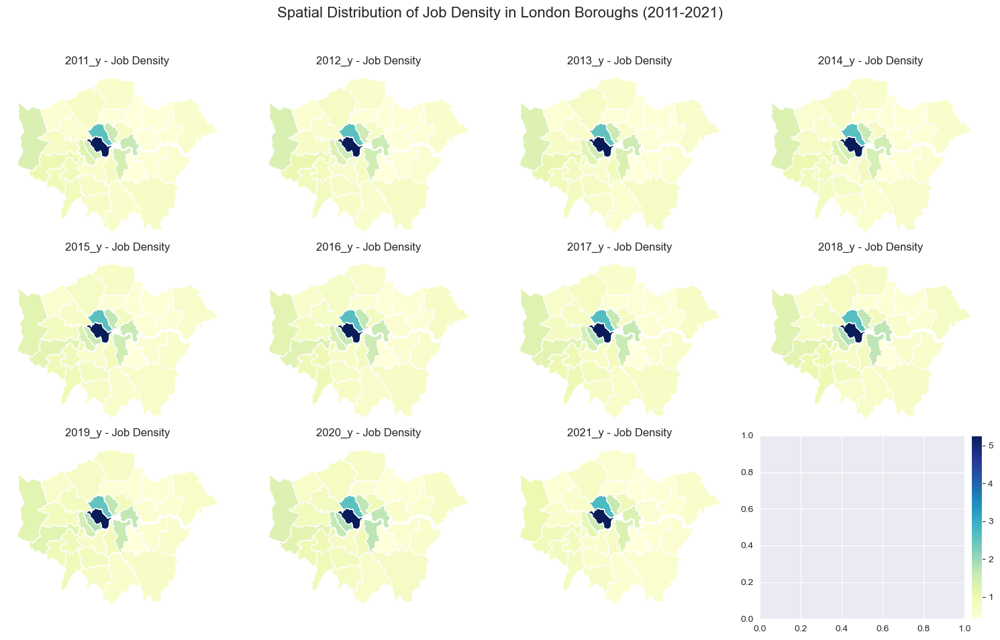

In [143]:
job_density_distribution_maps(LondonMap2, ['2011_y', '2012_y', '2013_y', '2014_y', '2015_y', '2016_y', '2017_y', '2018_y', '2019_y', '2020_y', '2021_y'])

# Results

### Distribution of job density across London boroughs over the years

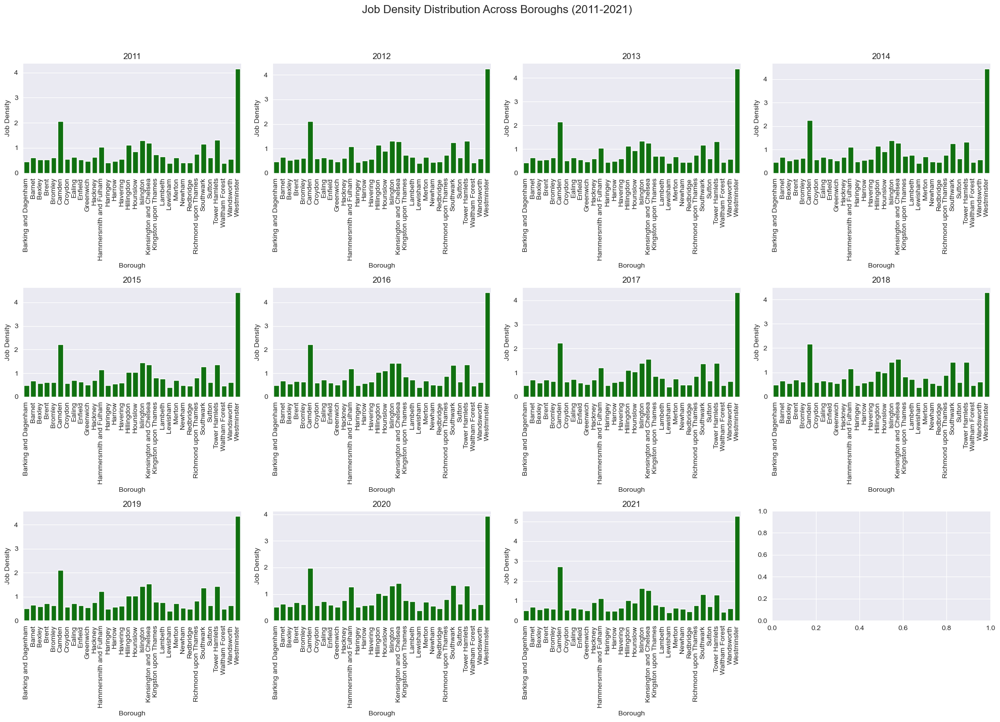

In [144]:
job_density_distribution_over_years(job_density_data)

From the above, it is clear that Westminster and Camdem are the boroughs with the highest job densities over the years when compared to other boroughs. 

### Distribution of total crimes in London

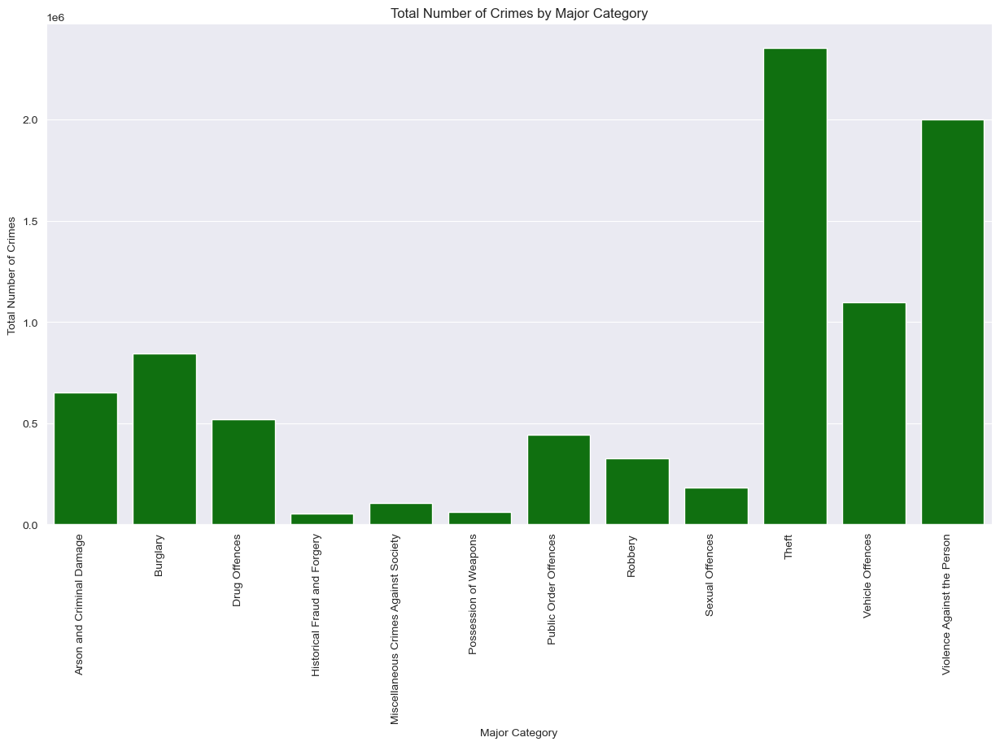

In [145]:
total_crimes_by_major_category(crimes_yearly_data)

The three most common catergories of crime are theft, violence against the person and vehicle offences while the least prevalent crime categories are historical fraud and forgery, possession of weapons and miscellaneous crimes against society.

### Distribution of crime across boroughs

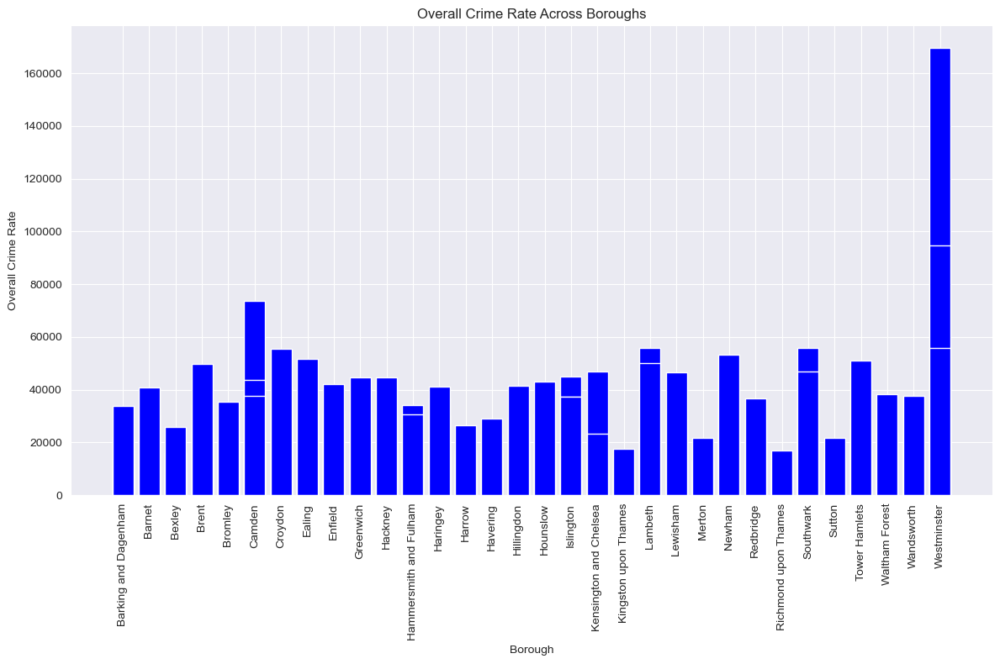

In [146]:
Overall_Crime_Rate_Across_Boroughs(crimes_yearly_data)

The above graph shows that more crimes happen in Westminster amd Camdem, which are the boroughs with the highest job density. Therefore we see that theres a relationship between job density and crime in London boroughs.

### Pearson Correlation Coefficient

In [147]:
print(f"Pearson Correlation Coefficient: {correlation_coefficient}")
print(f"P-value: {p_value}")

if p_value < 0.05:
    print("Reject the null hypothesis.")
else:
    print("Fail to reject the null hypothesis.")

Pearson Correlation Coefficient: 0.11936564014853854
P-value: 9.06916181584802e-07
Reject the null hypothesis.


The positive correlation coefficient of 0.1194 suggests that there is a weak positive linear relationship between job density and overall crime rates.

The small p-value indicates that this correlation is not due to random chance.

In conclusion, there is evidence of a statistically significant but weak positive correlation between job density and overall crime rates across boroughs, so we can reject the null hypothesis.



### Linrear Regression

In [148]:
print("Regression Results Table:")
print(regression_results)

Regression Results Table:
    Year   Intercept  Job_Density_Coefficient  R-squared       P-value
0   2011  312.022110               199.274600   0.017486  5.189095e-08
1   2012  305.428313               186.410878   0.017153  6.958243e-08
2   2013  283.156055               156.356091   0.015879  2.143086e-07
3   2014  297.763493               130.343642   0.012774  3.350018e-06
4   2015  317.606509               128.127861   0.010997  1.627265e-05
5   2016  335.112441               125.319595   0.010315  2.989897e-05
6   2017  338.129673               157.822816   0.013455  1.830567e-06
7   2018  333.953961               175.650507   0.014858  5.286654e-07
8   2019  310.216646               251.526724   0.021635  1.338697e-09
9   2020  364.632437               117.413752   0.006467  9.601078e-04
10  2021  381.147276                93.046830   0.007149  5.161397e-04


Weak positive relationship: After exploring the relationship between job density and crime rates over the years, we observed a consistent but weak positive correlation. This implies that an increase in job density is marginally attributed to be associated with a rise in crime rates.


Varying strength across years: The coefficient values as well as R-squared values showed some variation across the years. For instance, 2019 and 2011 appeared to have slightly higher R-squared values, meaning that a slightly stronger relationship between job density and crime emerged in those years.

Statistical significance: All the p-values are less than 0.05, suggesting that the relationships in all these years are statistically significant. However, it is to be remembered that statistical significance does not imply causation being present.

Intercept: Intercept value represents the crime rate component when job density is Zero, increases over time and shows overall increase in crime rates for that particular period being analyzed.

R-squared: Though very significant at the statistical level, the usual R-squared values are pretty low and lie in the range of 0.0064-0.0216. This reveals job density explains only a very small proportion of the variance in crime rates which implies other factors influencing the crime rate to a larger extent.

This analysis indicates a weak positive correlation of job density with crime rates though the crime rates are likely to be influenced other factors like unemployment, poverty, and law enforcement resources.

Correlation doesn't imply causation. This analysis simply indicates a relationship, but doesn't prove the suggestion that an increase in job density causes a directly accompanying rise in crime rates. More research into the causal mechanisms would have to be done.

# Discussion

From our analysis, it would be correct to deduce that there is a positive statistically significant correlation between job density and overall crimes rates across the London boroughs. This implies that the increase in the density of jobs within a borough is associated with an increase in total crime rates within the borough.

### Reject Null Hypothesis: 
A p-value of 9.069e-7 against a significance level of 0.05 states that there is enough evidence to reject the null hypothesis. This implies that the observed correlation is not by chance and a true relationship between job density and crime rates does exist.

### Linear Regression Insights: 
The regression results support the correlation analysis findings. While the R-squared values across years are low (ranging from 0.01 to 0.02), indicating that job density explains a small portion of the variance in crime rates, the positive coefficient for Job_Density in each year further confirms the positive association.

### Interpretation in Context of Existing Literature: 
Partial resonance to social disorganization theory which stated high density of jobs along with social disintegration and economic difference can make create crime prone environments, do point towards the proposition above. However, the weak correlation would suggest that factors other than mere job density are likely to be important in shaping crime patterns.

### Practical Implications: 
The current study would contribute towards building informed urban planning strategies. Higher job densities may result in increasing economic growth, while potential crime implications were to be understood and planned for together with adequate social support and community development initiatives, and effective policing strategies in place so as not to bring along the potential downsides of increased job-density.

# Conclusion

In this project, a complex relationship between job density and overall crime rates was discovered in the London boroughs. The analysis revealed that there is a weak but significant positive correlation between job density and overall crime rates, implying that an increase in job density is associated with a slightly higher average crime level.

This reinforces the existing literature on social disorganization theory, emphasizing how high job density can have negative consequences if it is not accompanied by adequate support systems and assurance for each individual. The study found that when planning job concentration, economic benefits and potential social consequences should be factored in. Future research can go deeper into specific types of crimes and socioeconomic factors to improve this overall understanding.

This project demonstrates urban data science as a necessary approach to solving key urban problems. Cities can be made more economically vibrant by developing and implementing new insights derived from data to guide evidence-based planning strategies.

## References

Cohen, L. E., & Felson, M. (1979). Social change and crime rate trends: A sociological explanation. American Journal of Sociology, 84(4), 827-858.

Hirsch, A. (1983). Crime in the context of economic opportunity: An explanation of the paradox of low rates in Japan and high rates in the United States. Criminology, 21(2), 257-283.

Sampson, R. J., Raudenbush, S. W., & Earls, F. (1997). Neighborhood context and collective efficacy for child rearing. Child Development, 68(4), 162
